In [1]:
# Import and Install Libraries

from monai.utils import set_determinism, first
from monai.transforms import (
    EnsureChannelFirstD,
    Compose,
    LoadImageD,
    RandRotateD,
    RandZoomD,
    ScaleIntensityRanged,
)
import torch, torchinfo
import monai
from monai.data import DataLoader, Dataset, CacheDataset
from monai.config import print_config, USE_COMPILED
from monai.networks.nets import GlobalNet, LocalNet, RegUNet
from monai.networks.blocks import Warp
from monai.apps import MedNISTDataset
import torch.nn.functional as F

from glob import glob
import cv2
import torchmetrics

from torch.autograd import Variable

from scipy.spatial.distance import directed_hausdorff
from scipy.ndimage import zoom
import pandas as pd

import torch.nn as nn

import numpy as np
import torch
from torch.nn import MSELoss
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
from matplotlib.animation import FuncAnimation
import os
import tempfile
from monai.losses import *
from monai.metrics import *
from piqa import SSIM

import nibabel as nib

import csv

print_config()
set_determinism(40)

MONAI version: 1.0.1
Numpy version: 1.22.3
Pytorch version: 1.13.1
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 8271a193229fe4437026185e218d5b06f7c8ce69
MONAI __file__: /home/mkh/anaconda3/envs/phd/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.10
Nibabel version: 5.0.1
scikit-image version: 0.19.3
Pillow version: 9.0.1
Tensorboard version: 2.12.0
gdown version: 4.6.4
TorchVision version: 0.14.1
tqdm version: 4.64.1
lmdb version: 1.4.0
psutil version: 5.9.4
pandas version: 1.5.3
einops version: 0.6.0
transformers version: 4.21.3
mlflow version: 2.1.1
pynrrd version: 1.0.0

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



In [2]:
print('How many GPUs = ' + str(torch.cuda.device_count()))

#checking for device

device=torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(device)


if not torch.cuda.is_available():
    raise Exception("GPU not availalbe. CPU training will be too slow.")

print("device name", torch.cuda.get_device_name(0))

How many GPUs = 4
cuda:2
device name NVIDIA GeForce RTX 3090 Ti


In [3]:
img_size = 256
slice_size = 32
EP = 200
num_workers = 8

TrDir = "/home/mkh/MKH/KSA/VAE_3D/data_VAE_3D/train/"
ValDir = "/home/mkh/MKH/KSA/VAE_3D/data_VAE_3D/val/"

TrNames = sorted(os.listdir(TrDir))
ValNames = sorted(os.listdir((ValDir)))

TrImage = []
ValImage = []

for name in TrNames:
    path = os.path.join(TrDir, name)
    TrImage.append(path)

for name in ValNames:
    path = os.path.join(ValDir, name)
    ValImage.append(path)

In [4]:
print(len(TrImage))
print(len(ValImage))

1356
66


In [5]:
class EchoDatasetMask(Dataset):
    def __init__(self, images_path, labtozero):

        self.images_path = images_path
        self.labtozero = labtozero
        self.n_samples = len(images_path)

    def __getitem__(self, index):
        """ Reading image """
        # image = cv2.imread(self.images_path[index], cv2.IMREAD_GRAYSCALE)
        img_3d = nib.load(self.images_path[index])
        image = img_3d.get_fdata()
        image[image==127]=1 #lv
        image[image==255]=2 #myo
        if self.labtozero is not None:
            image [image==self.labtozero]=0
            
        # image = cv2.resize(image,(img_size, img_size), interpolation=cv2.INTER_NEAREST)
        image = zoom(image, (img_size / image.shape[0], img_size / image.shape[1], slice_size / image.shape[2]), order=0)
        image = image/(image.max()) ## (512, 512, 3)
#         print(image.max())
#         image = image/(image.max()) ## (512, 512, 3)
        image = np.expand_dims(image, axis=0)
        image = image.astype(np.float32)
        self.images_path[index]
        return image

    def __len__(self):
        return self.n_samples
    
def get_batches_mask(_dir,
                     _labtozero,
                     batch_size,
                     num_workers,
                     pin_memory):
    
    _data = EchoDatasetMask(images_path=_dir, labtozero = _labtozero)

    _loader = DataLoader(_data,
                              batch_size=batch_size,
                              num_workers=num_workers,
                              pin_memory=pin_memory,
                              shuffle=True)

    return _loader

print(len(sorted(TrImage)))
print(len(sorted(ValImage)))

1356
66


_train_mask_ shape: torch.Size([256, 256, 32])
_val_mask_ shape: torch.Size([256, 256, 32])
_train_mask_ range: 1.0 0.0 [0. 1.]
_val_mask_ range: 1.0 0.0 [0. 1.]


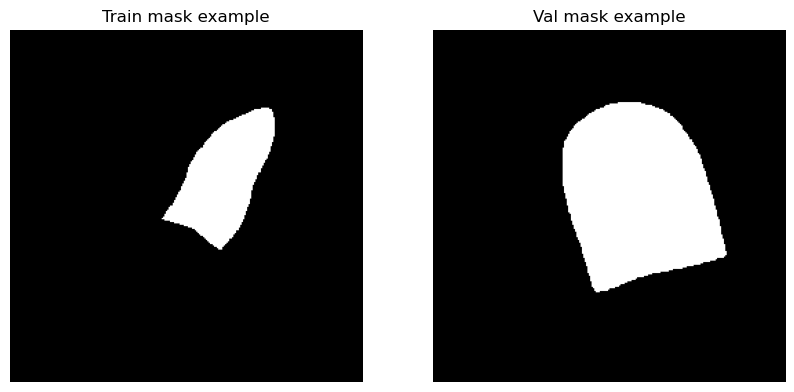

In [6]:
train_mask_LV = get_batches_mask(_dir = sorted(TrImage),
                                            _labtozero = 2,
                                            batch_size = 64,
                                            num_workers = num_workers,
                                            pin_memory = True)



val_mask_LV = get_batches_mask(_dir = sorted(ValImage),
                                          _labtozero = 2,
                                          batch_size = 8,
                                          num_workers = num_workers,
                                          pin_memory = True)

dataloaders = {'_train': train_mask_LV, '_val': val_mask_LV}


_train_mask_ = first(dataloaders["_train"])[0][0]
_val_mask_ = first(dataloaders["_val"])[0][0]

print(f"_train_mask_ shape: {_train_mask_.shape}")
print(f"_val_mask_ shape: {_val_mask_.shape}")


print(f"_train_mask_ range: {_train_mask_.max()} {_train_mask_.min()} {np.unique(_train_mask_)}")
print(f"_val_mask_ range: {_val_mask_.max()} {_val_mask_.min()} {np.unique(_val_mask_)}")

plt.figure("check", (10, 5))

plt.subplot(1, 2, 1)
plt.title("Train mask example")
plt.imshow(_train_mask_[:,:,20], cmap="gray")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Val mask example")
plt.imshow(_val_mask_[:,:,20], cmap="gray")
plt.axis('off')

plt.show()

_train_mask_ shape: torch.Size([256, 256, 32])
_val_mask_ shape: torch.Size([256, 256, 32])
_train_mask_ range: 1.0 0.0 [0. 1.]
_val_mask_ range: 1.0 0.0 [0. 1.]


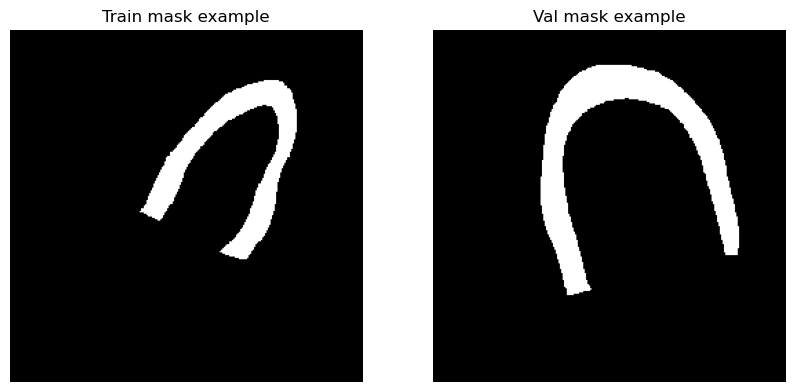

In [7]:
train_mask_Myo = get_batches_mask(_dir = sorted(TrImage),
                                            _labtozero = 1,
                                            batch_size = 32,
                                            num_workers = num_workers,
                                            pin_memory = True)



val_mask_Myo = get_batches_mask(_dir = sorted(ValImage),
                                          _labtozero = 1,
                                          batch_size = 8,
                                          num_workers = num_workers,
                                          pin_memory = True)

dataloaders = {'_train': train_mask_Myo, '_val': val_mask_Myo}


_train_mask_ = first(dataloaders["_train"])[0][0]
_val_mask_ = first(dataloaders["_val"])[0][0]

print(f"_train_mask_ shape: {_train_mask_.shape}")
print(f"_val_mask_ shape: {_val_mask_.shape}")


print(f"_train_mask_ range: {_train_mask_.max()} {_train_mask_.min()} {np.unique(_train_mask_)}")
print(f"_val_mask_ range: {_val_mask_.max()} {_val_mask_.min()} {np.unique(_val_mask_)}")

plt.figure("check", (10, 5))

plt.subplot(1, 2, 1)
plt.title("Train mask example")
plt.imshow(_train_mask_[:,:,20], cmap="gray")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Val mask example")
plt.imshow(_val_mask_[:,:,20], cmap="gray")
plt.axis('off')

plt.show()

In [8]:
trainData = {'Myo': train_mask_Myo, 'LV': train_mask_LV}
valData = {'Myo': val_mask_Myo, 'LV': val_mask_LV}

In [9]:
class VariationalEncoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalEncoder, self).__init__()
        self.conv1 = nn.Conv3d(1, 8, kernel_size=3, stride=2, padding=1)
        self.conv2 = nn.Conv3d(8, 16, kernel_size=3, stride=2, padding=1)
        self.batch2 = nn.BatchNorm3d(16)
        self.conv3 = nn.Conv3d(16, 32, kernel_size=3, stride=2, padding=1)
        self.linear1 = nn.Linear(img_size//8 * img_size//8 * slice_size//8 * 32, 128)
        self.linear2 = nn.Linear(128, latent_dims)
        self.linear3 = nn.Linear(128, latent_dims)

        self.N = torch.distributions.Normal(0, 1)
        self.N.loc = self.N.loc.to(device)  # hack to get sampling on the GPU
        self.N.scale = self.N.scale.to(device)
        self.kl = 0

    def forward(self, x):
        x = x.to(device)
        x = F.relu(self.conv1(x))
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        mu = self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma * self.N.sample(mu.shape)
        self.kl = (sigma ** 2 + mu ** 2 - torch.log(sigma) - 1/2).sum()
        return z


In [10]:
class Decoder(nn.Module):
    def __init__(self, latent_dims):
        super().__init__()
        
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dims, 128),
            nn.ReLU(True),
            nn.Linear(128, img_size // 8 * img_size // 8 * slice_size // 8 * 32),
            nn.ReLU(True)
        )
        
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, img_size // 8, img_size // 8, slice_size // 8))
        
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose3d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm3d(16),
            nn.ReLU(True),
            nn.ConvTranspose3d(16, 8, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm3d(8),
            nn.ReLU(True),
            nn.ConvTranspose3d(8, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
        )
    
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [11]:
class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device)
        z = self.encoder(x)
#         print(f'Latent dim = {z.shape}')
#         print(f'Latent Value = {z}')
        return self.decoder(z)

In [14]:
### Set the random seed for reproducible results
torch.manual_seed(0)

d = 8

Myo_VAE = VariationalAutoencoder(latent_dims=d)
Myo_VAE.to(device)
Myo_VAE.load_state_dict(torch.load('Myo_VAE_3D_'+ str(img_size) + '_' + str(slice_size) +'_.pth', map_location= device))

torchinfo.summary(Myo_VAE, input_size=(2, 1, img_size, img_size, slice_size), depth=100)

Layer (type:depth-idx)                   Output Shape              Param #
VariationalAutoencoder                   [2, 1, 256, 256, 32]      --
├─VariationalEncoder: 1-1                [2, 8]                    --
│    └─Conv3d: 2-1                       [2, 8, 128, 128, 16]      224
│    └─Conv3d: 2-2                       [2, 16, 64, 64, 8]        3,472
│    └─BatchNorm3d: 2-3                  [2, 16, 64, 64, 8]        32
│    └─Conv3d: 2-4                       [2, 32, 32, 32, 4]        13,856
│    └─Linear: 2-5                       [2, 128]                  16,777,344
│    └─Linear: 2-6                       [2, 8]                    1,032
│    └─Linear: 2-7                       [2, 8]                    1,032
├─Decoder: 1-2                           [2, 1, 256, 256, 32]      --
│    └─Sequential: 2-8                   [2, 131072]               --
│    │    └─Linear: 3-1                  [2, 128]                  1,152
│    │    └─ReLU: 3-2                    [2, 128]           

In [15]:
lr = 1e-3 

optim_Myo_VAE = torch.optim.Adam(Myo_VAE.parameters(), lr=lr, weight_decay=1e-5)

dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)

In [16]:
### Training function

class SSIMLoss(SSIM):
    def forward(self, x, y):
        return 1. - super().forward(x, y)
    

label_SSIM = SSIMLoss(n_channels=1).to(device) # .cuda() if you need GPU support

label_loss = DiceLoss()


def train_epoch(model, device, dataloader, optimizer):
    # Set train mode for both the encoder and the decoder
    model.train()
    _loss = 0.0
    _loss_DSC = 0.0
    _loss_SSIM = 0.0
    _loss_KL = 0.0
    _loss_diff_loss = 0.0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for x in dataloader: 
        # Move tensor to the proper device
        x = x.to(device)
        x_hat = model(x)
        # Evaluate loss
        # x_o = x[8,:,:,:].reshape(512,512)
        # x_p = x_hat[8,:,:,:].reshape(512,512)

        # x_p[x_p<0.1]=0
        # x_p[x_p>0.9]=1


        # # print(x_o.shape)
        # # print(x_p.shape)
        # print(torch.unique(x_o, return_counts= True))
        # print(torch.unique(x_p, return_counts= True))
        
        diff_loss = ((x - x_hat)**2).sum()
        DSC = label_loss(x, x_hat)
        KL = model.encoder.kl
        SSIM = label_SSIM(x,x_hat)
        
        loss = KL + diff_loss + DSC + SSIM
    
#         print('------')
#         print(DSC)    
#         print(SSIM)
#         print(KL)
#         print(diff_loss)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Print batch loss
#         print('\t partial train loss (single batch): %f' % (loss.item()))
        _loss+=loss.item()
        _loss_DSC+=DSC.item()
        _loss_SSIM+=SSIM.item()
        _loss_KL+=KL.item()
        _loss_diff_loss+=diff_loss.item()
        
        dice_metric(y_pred = x_hat, y=x)
            
    metric = dice_metric.aggregate().item()
    dice_metric.reset()
    print(f"Train mean dice: {metric:.4f}")
    L = len(dataloader.dataset)
#     print(_loss_DSC)
#     print(_loss_SSIM)

    return [_loss/L, _loss_DSC/L, _loss_SSIM/L, _loss_KL/L, _loss_diff_loss/L]

In [17]:
### Testing function
def test_epoch(model, device, dataloader):
    
    # Set evaluation mode for encoder and decoder
    model.eval()
    _loss = 0.0
    _loss_DSC = 0.0
    _loss_SSIM = 0.0
    _loss_KL = 0.0
    _loss_diff_loss = 0.0
    
    with torch.no_grad(): # No need to track the gradients
        for x in dataloader:
            # Move tensor to the proper device
            x = x.to(device)
            # Encode data
            encoded_data = model.encoder(x)
            # Decode data
            x_hat = model(x)         
            
            diff_loss = ((x - x_hat)**2).sum()
            DSC = label_loss(x, x_hat)
            KL = model.encoder.kl
            SSIM = label_SSIM(x,x_hat)

            loss = KL + diff_loss + DSC + SSIM
            
            _loss += loss.item()
            _loss_DSC+=DSC.item()
            _loss_SSIM+=SSIM.item()
            _loss_KL+=KL.item()
            _loss_diff_loss+=diff_loss.item()

        #     meandice_.extend((compute_meandice(y_pred = make_one_hot(x_hat, C=3), y=make_one_hot(x.to(device), C=3))).detach().cpu().numpy())
            
            dice_metric(y_pred = x_hat, y=x)
            
        metric = dice_metric.aggregate().item()
        dice_metric.reset()
        print(f"Val mean dice: {metric:.4f}")
        L = len(dataloader.dataset)
        # print(f'Mean dice = {np.mean(np.array(meandice_), axis=0)}')

    return [_loss/L, _loss_DSC/L, _loss_SSIM/L, _loss_KL/L, _loss_diff_loss/L, metric]

In [18]:
def plot_outputs(encoder, decoder, mask):
    plt.figure(figsize=(16,4.5))
    for image in mask:
#         print(image.size(0))
        encoder.eval() 
        decoder.eval()
        with torch.no_grad():
            rec_img  = decoder(encoder(image.to(device)))
            
            
        for i in range (image.size(0)):
            ax = plt.subplot(2,image.size(0),i+1)
            plt.imshow(image[i,:,:,:,20].reshape(img_size, img_size).cpu().squeeze().numpy(), cmap='gist_gray')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)  
            if i == image.size(0)//2:
                ax.set_title('Original images')
                
#             print(np.unique(rec_img[i,:,:,:].reshape(512,512).cpu().squeeze().numpy()))
                
            ax = plt.subplot(2, image.size(0), i + 1 + image.size(0))
            plt.imshow(rec_img[i,:,:,:,20].reshape(img_size, img_size).cpu().squeeze().numpy(), cmap='gist_gray')  
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)  
            # print(np.unique(rec_img[i,:,:,:].reshape(512,512).cpu().squeeze().numpy()))
            if i == image.size(0)//2:
                ax.set_title('Reconstructed images')
                
        plt.show()   
        break    


<<<----------------------- EPOCH 1/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>


y_pred should be a binarized tensor.


Train mean dice: 0.9757
Val mean dice: 0.3218
Valid DSC improved from 0.0000 to 0.3218! Best model is saving as---> Myo_VAE_3D_256_32_.pth

 MYO train loss=3549.593 	 and 	 MYO val loss=130390.370
Best val DSC: 0.3218 at epoch number of 1


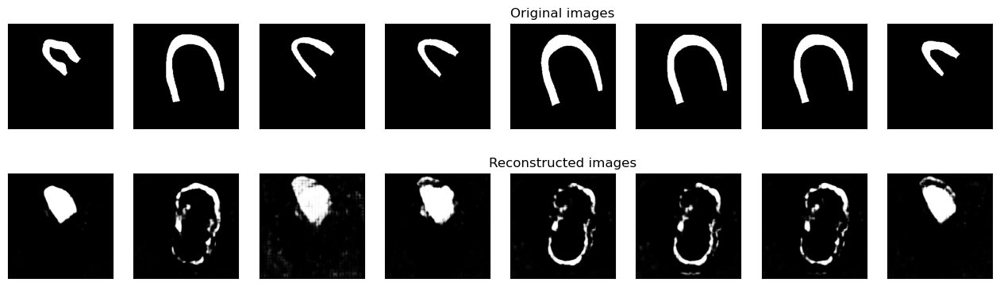


<<<----------------------- EPOCH 2/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9783
Val mean dice: 0.3135

 MYO train loss=3021.769 	 and 	 MYO val loss=128349.420
Best val DSC: 0.3218 at epoch number of 1


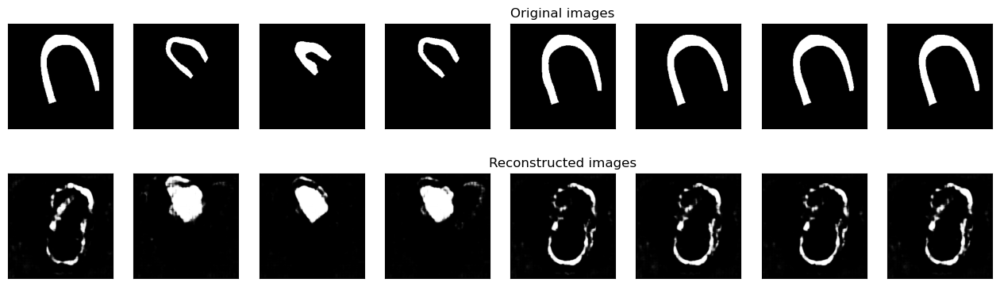


<<<----------------------- EPOCH 3/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9794
Val mean dice: 0.3180

 MYO train loss=2914.209 	 and 	 MYO val loss=132207.018
Best val DSC: 0.3218 at epoch number of 1


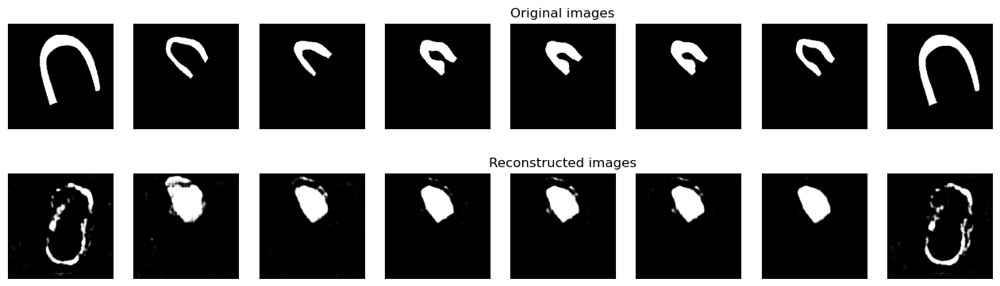


<<<----------------------- EPOCH 4/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9796
Val mean dice: 0.3218

 MYO train loss=2887.589 	 and 	 MYO val loss=132301.687
Best val DSC: 0.3218 at epoch number of 1


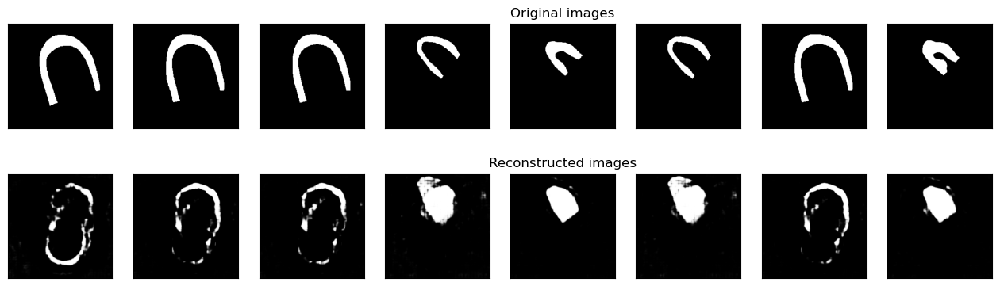


<<<----------------------- EPOCH 5/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9800
Val mean dice: 0.3149

 MYO train loss=2886.354 	 and 	 MYO val loss=130617.095
Best val DSC: 0.3218 at epoch number of 1


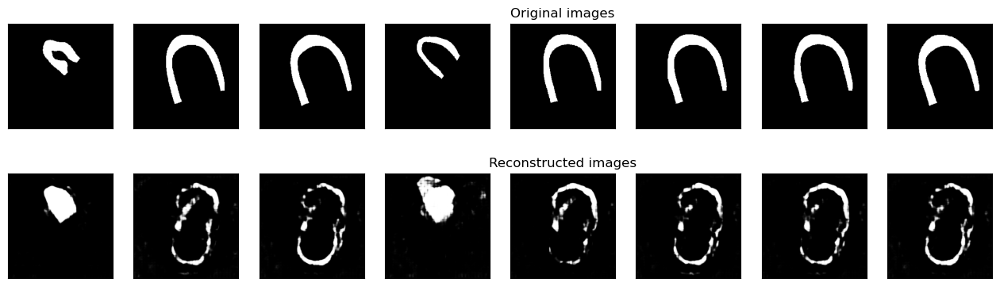


<<<----------------------- EPOCH 6/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9802
Val mean dice: 0.3160

 MYO train loss=2894.932 	 and 	 MYO val loss=132726.731
Best val DSC: 0.3218 at epoch number of 1


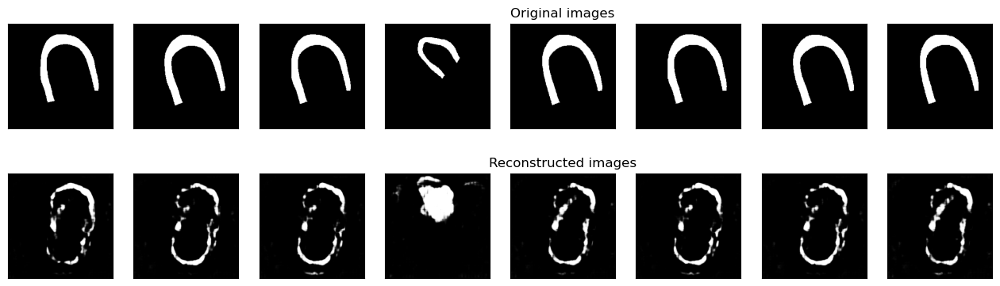


<<<----------------------- EPOCH 7/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9804
Val mean dice: 0.3229
Valid DSC improved from 0.3218 to 0.3229! Best model is saving as---> Myo_VAE_3D_256_32_.pth

 MYO train loss=2877.862 	 and 	 MYO val loss=131393.093
Best val DSC: 0.3229 at epoch number of 7


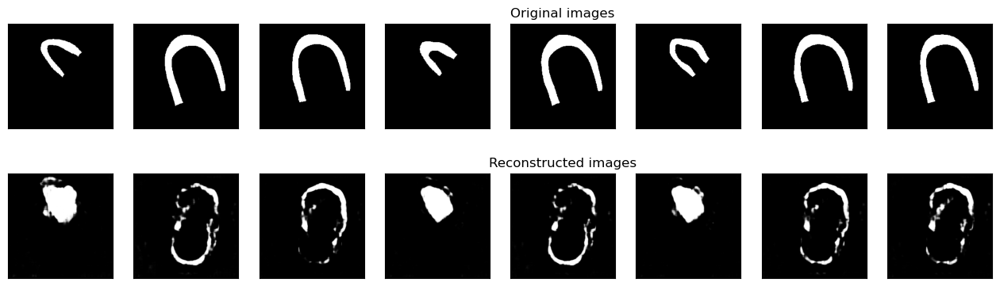


<<<----------------------- EPOCH 8/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9809
Val mean dice: 0.3196

 MYO train loss=2803.259 	 and 	 MYO val loss=132382.149
Best val DSC: 0.3229 at epoch number of 7


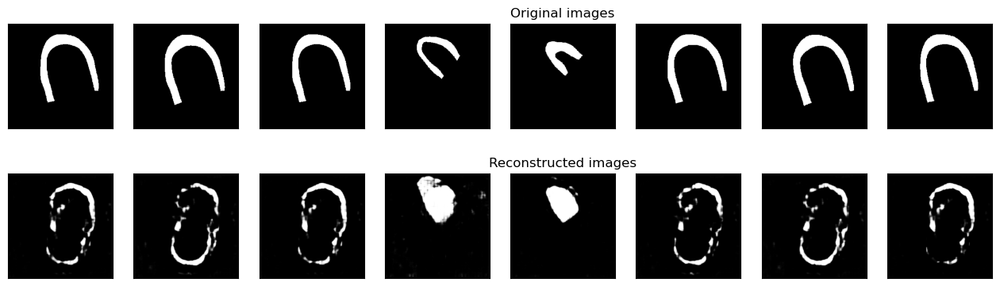


<<<----------------------- EPOCH 9/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9809
Val mean dice: 0.3272
Valid DSC improved from 0.3229 to 0.3272! Best model is saving as---> Myo_VAE_3D_256_32_.pth

 MYO train loss=2788.952 	 and 	 MYO val loss=133020.982
Best val DSC: 0.3272 at epoch number of 9


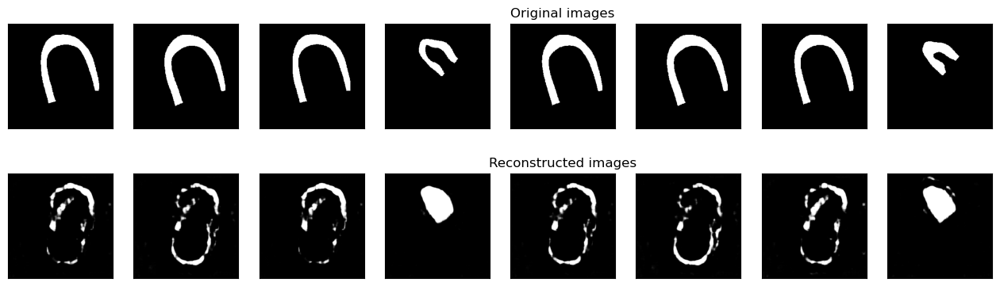


<<<----------------------- EPOCH 10/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9811
Val mean dice: 0.3262

 MYO train loss=2787.958 	 and 	 MYO val loss=134786.572
Best val DSC: 0.3272 at epoch number of 9


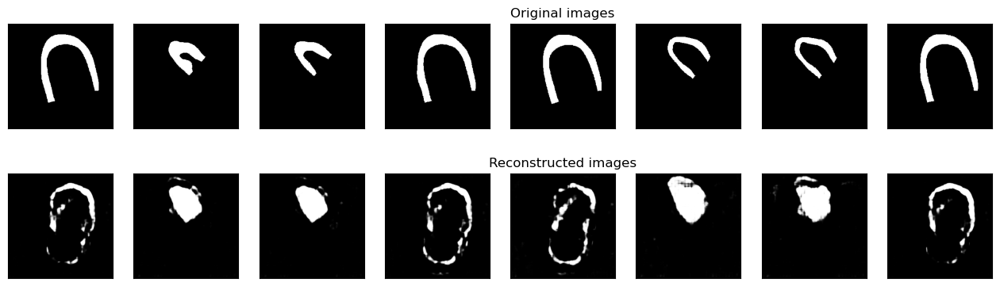


<<<----------------------- EPOCH 11/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9815
Val mean dice: 0.3188

 MYO train loss=2738.708 	 and 	 MYO val loss=133551.921
Best val DSC: 0.3272 at epoch number of 9


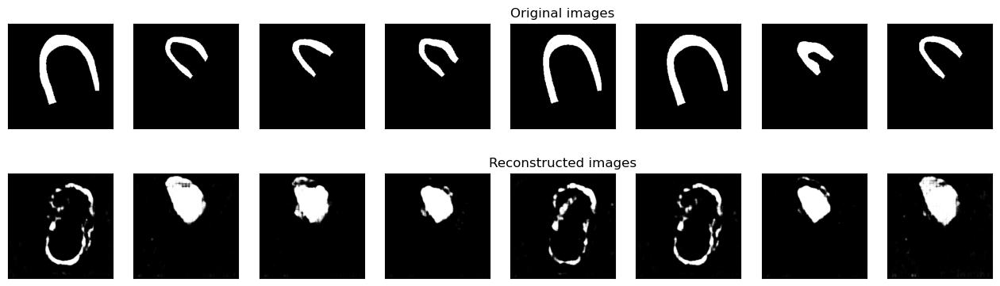


<<<----------------------- EPOCH 12/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9814
Val mean dice: 0.3243

 MYO train loss=2767.292 	 and 	 MYO val loss=132792.993
Best val DSC: 0.3272 at epoch number of 9


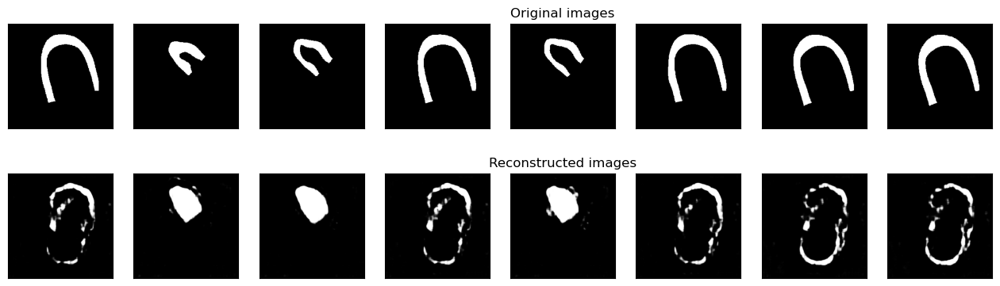


<<<----------------------- EPOCH 13/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9813
Val mean dice: 0.3207

 MYO train loss=2782.631 	 and 	 MYO val loss=132765.552
Best val DSC: 0.3272 at epoch number of 9


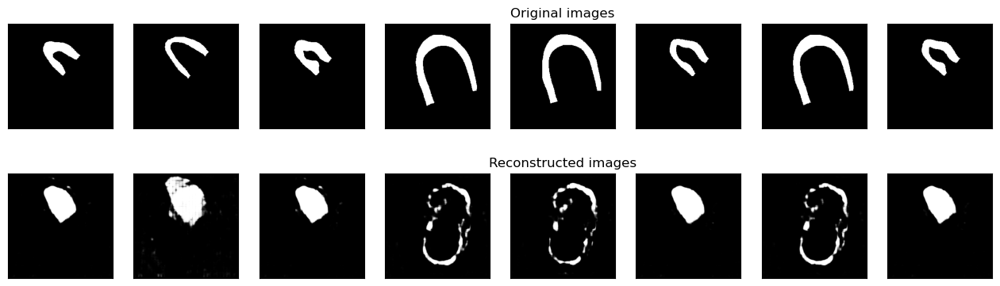


<<<----------------------- EPOCH 14/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9815
Val mean dice: 0.3103

 MYO train loss=2830.074 	 and 	 MYO val loss=133224.292
Best val DSC: 0.3272 at epoch number of 9


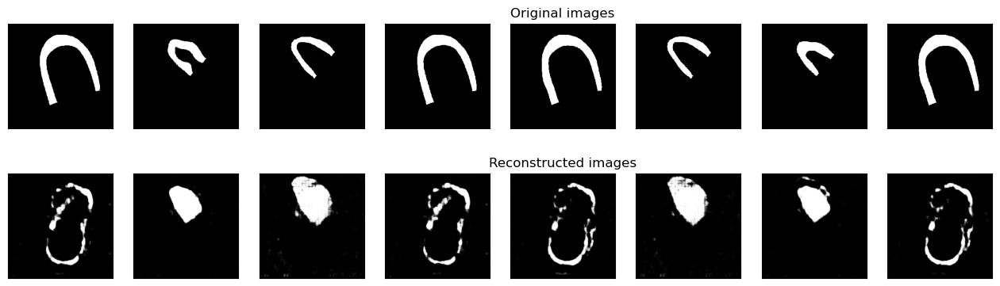


<<<----------------------- EPOCH 15/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9817
Val mean dice: 0.3103

 MYO train loss=2784.880 	 and 	 MYO val loss=132557.559
Best val DSC: 0.3272 at epoch number of 9


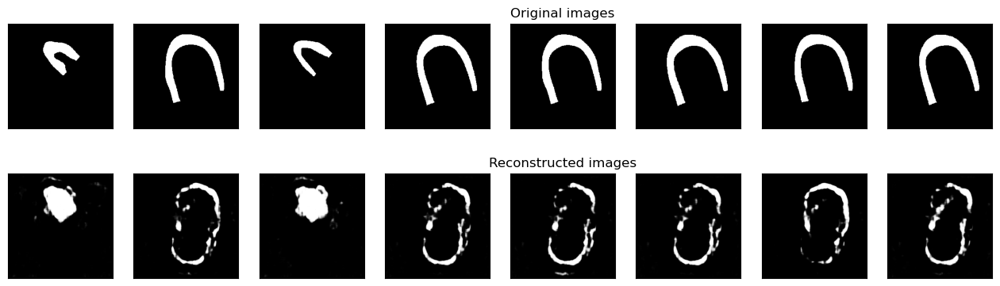


<<<----------------------- EPOCH 16/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9818
Val mean dice: 0.3143

 MYO train loss=2734.571 	 and 	 MYO val loss=132970.274
Best val DSC: 0.3272 at epoch number of 9


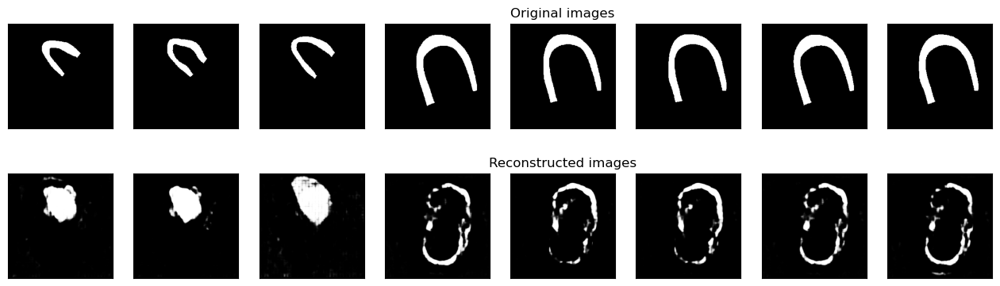


<<<----------------------- EPOCH 17/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9821
Val mean dice: 0.3258

 MYO train loss=2720.166 	 and 	 MYO val loss=134145.673
Best val DSC: 0.3272 at epoch number of 9


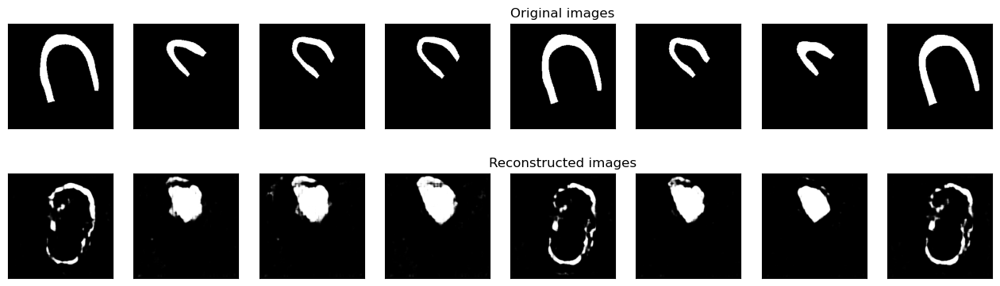


<<<----------------------- EPOCH 18/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9821
Val mean dice: 0.3149

 MYO train loss=2706.540 	 and 	 MYO val loss=133695.856
Best val DSC: 0.3272 at epoch number of 9


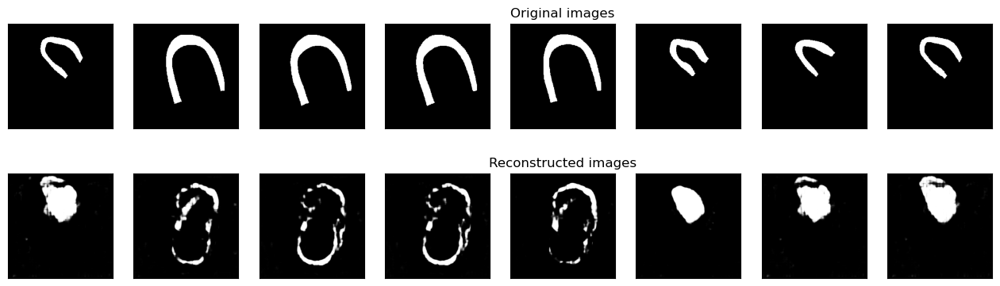


<<<----------------------- EPOCH 19/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9822
Val mean dice: 0.3120

 MYO train loss=2708.931 	 and 	 MYO val loss=132173.835
Best val DSC: 0.3272 at epoch number of 9


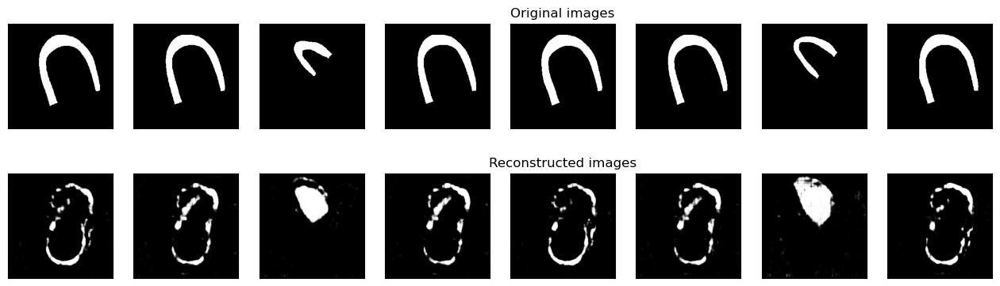


<<<----------------------- EPOCH 20/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9823
Val mean dice: 0.3180

 MYO train loss=2681.522 	 and 	 MYO val loss=134750.506
Best val DSC: 0.3272 at epoch number of 9


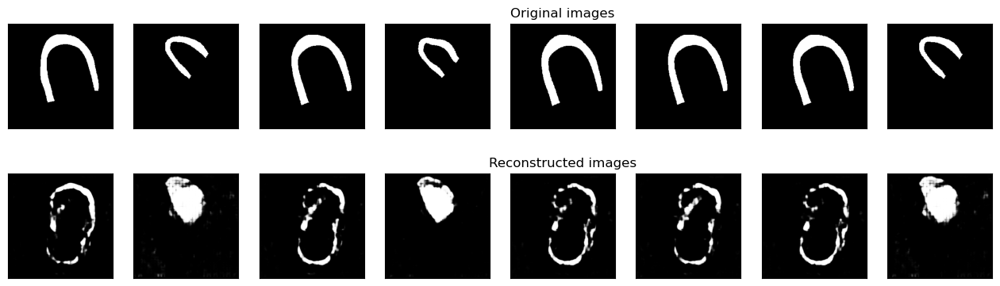


<<<----------------------- EPOCH 21/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9823
Val mean dice: 0.3156

 MYO train loss=2704.470 	 and 	 MYO val loss=133057.451
Best val DSC: 0.3272 at epoch number of 9


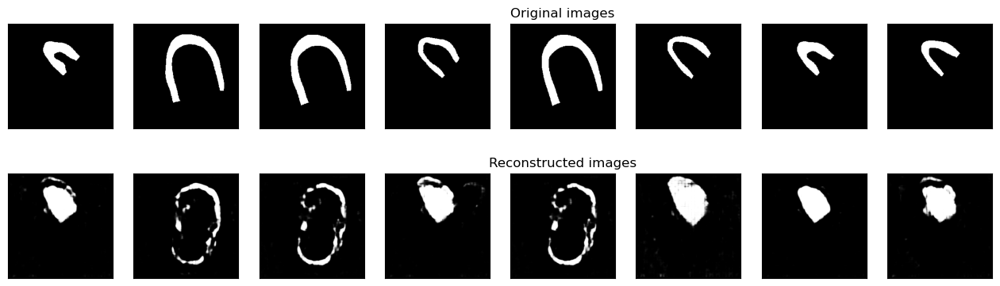


<<<----------------------- EPOCH 22/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9824
Val mean dice: 0.3190

 MYO train loss=2686.751 	 and 	 MYO val loss=135897.561
Best val DSC: 0.3272 at epoch number of 9


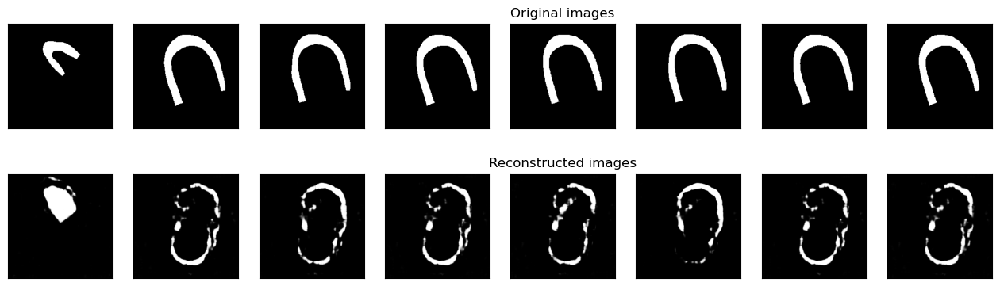


<<<----------------------- EPOCH 23/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9826
Val mean dice: 0.3235

 MYO train loss=2660.274 	 and 	 MYO val loss=133717.703
Best val DSC: 0.3272 at epoch number of 9


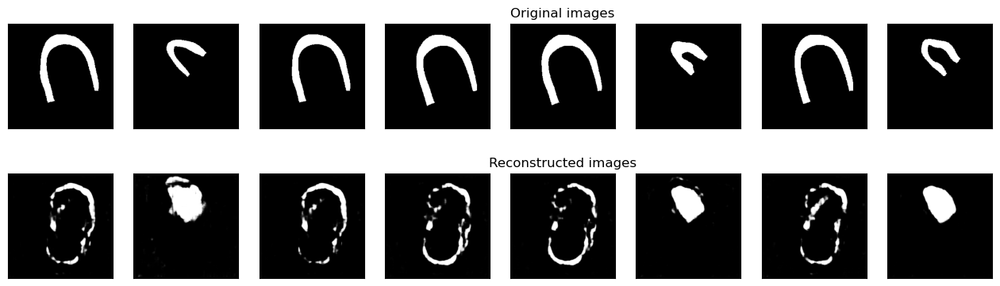


<<<----------------------- EPOCH 24/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9827
Val mean dice: 0.3223

 MYO train loss=2648.919 	 and 	 MYO val loss=135687.236
Best val DSC: 0.3272 at epoch number of 9


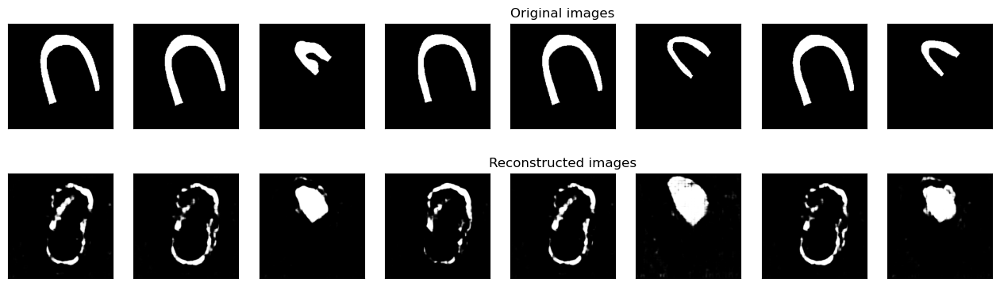


<<<----------------------- EPOCH 25/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9825
Val mean dice: 0.3212

 MYO train loss=2670.934 	 and 	 MYO val loss=134745.064
Best val DSC: 0.3272 at epoch number of 9


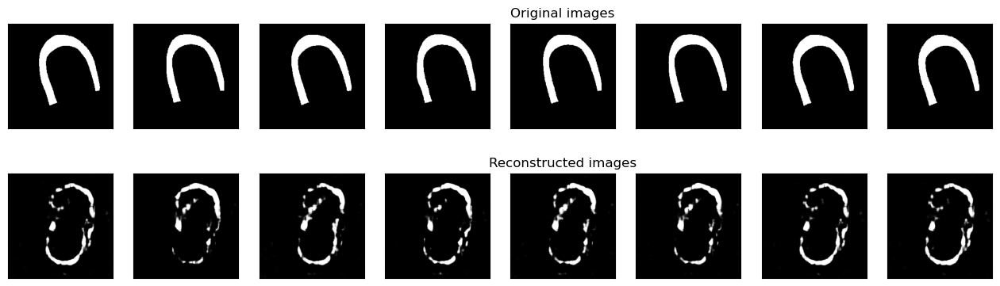


<<<----------------------- EPOCH 26/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9826
Val mean dice: 0.3292
Valid DSC improved from 0.3272 to 0.3292! Best model is saving as---> Myo_VAE_3D_256_32_.pth

 MYO train loss=2696.437 	 and 	 MYO val loss=135842.475
Best val DSC: 0.3292 at epoch number of 26


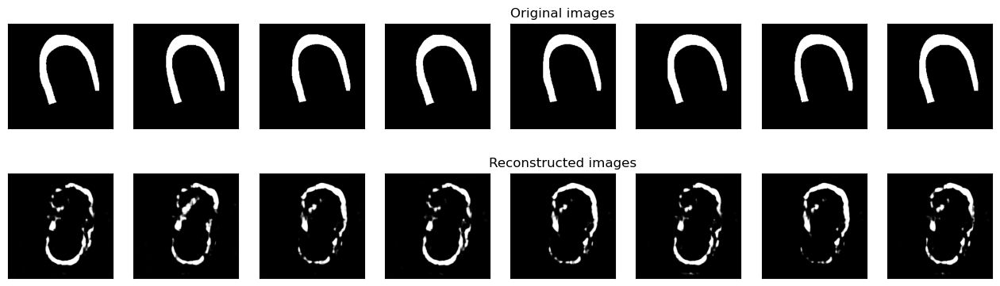


<<<----------------------- EPOCH 27/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9830
Val mean dice: 0.3140

 MYO train loss=2632.534 	 and 	 MYO val loss=135636.025
Best val DSC: 0.3292 at epoch number of 26


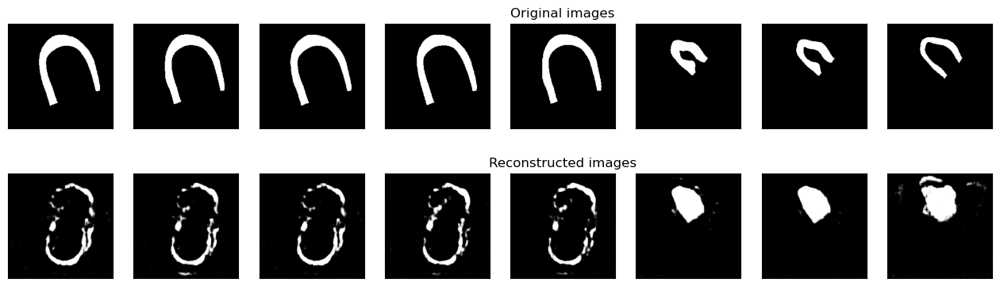


<<<----------------------- EPOCH 28/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9827
Val mean dice: 0.3111

 MYO train loss=2649.507 	 and 	 MYO val loss=134961.917
Best val DSC: 0.3292 at epoch number of 26


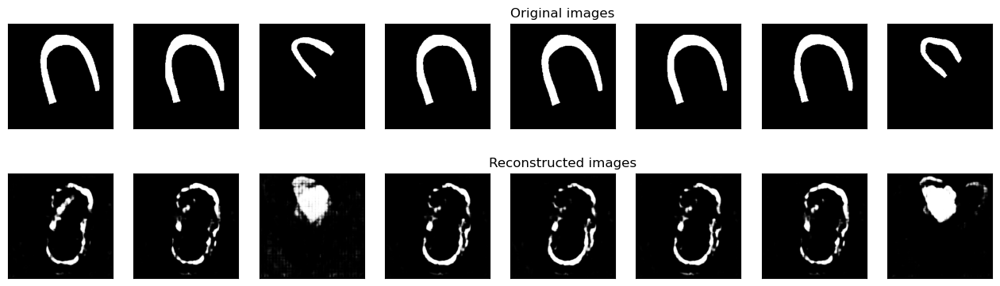


<<<----------------------- EPOCH 29/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9831
Val mean dice: 0.3261

 MYO train loss=2637.157 	 and 	 MYO val loss=134672.523
Best val DSC: 0.3292 at epoch number of 26


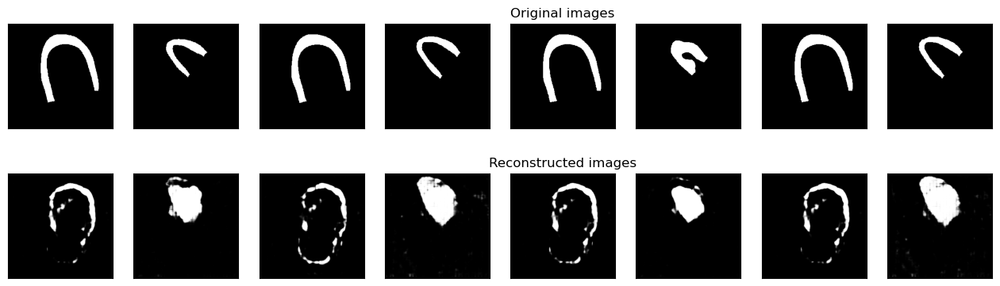


<<<----------------------- EPOCH 30/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9832
Val mean dice: 0.3287

 MYO train loss=2607.873 	 and 	 MYO val loss=138274.958
Best val DSC: 0.3292 at epoch number of 26


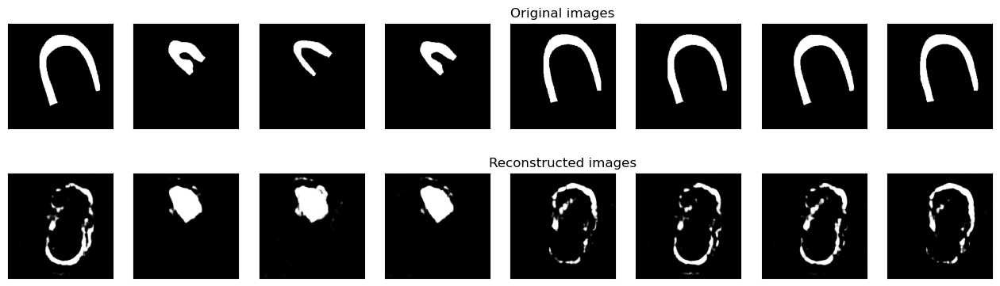


<<<----------------------- EPOCH 31/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9834
Val mean dice: 0.3177

 MYO train loss=2547.805 	 and 	 MYO val loss=135162.185
Best val DSC: 0.3292 at epoch number of 26


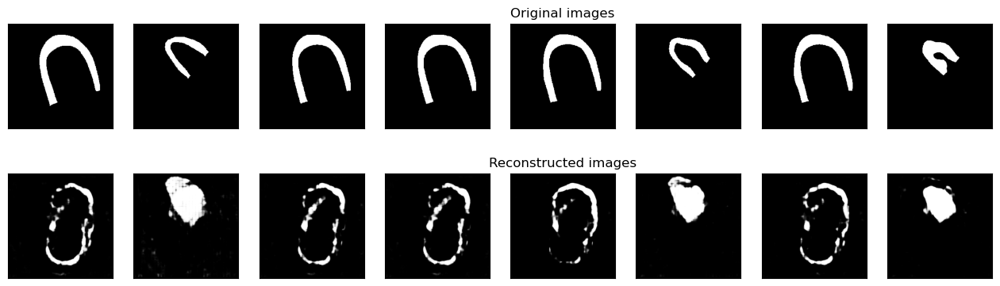


<<<----------------------- EPOCH 32/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9834
Val mean dice: 0.3135

 MYO train loss=2588.553 	 and 	 MYO val loss=134826.029
Best val DSC: 0.3292 at epoch number of 26


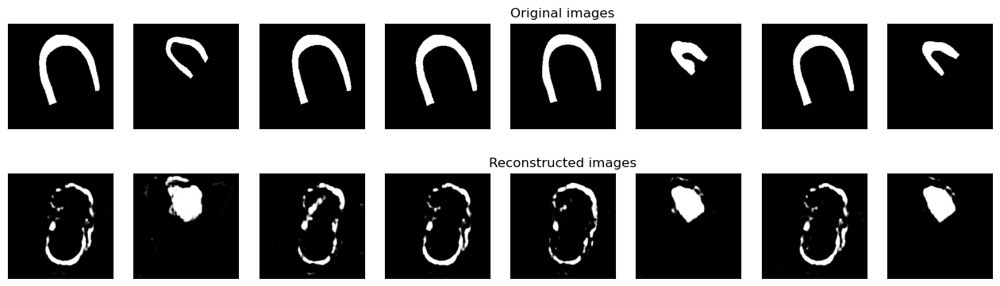


<<<----------------------- EPOCH 33/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9833
Val mean dice: 0.3221

 MYO train loss=2647.524 	 and 	 MYO val loss=137181.572
Best val DSC: 0.3292 at epoch number of 26


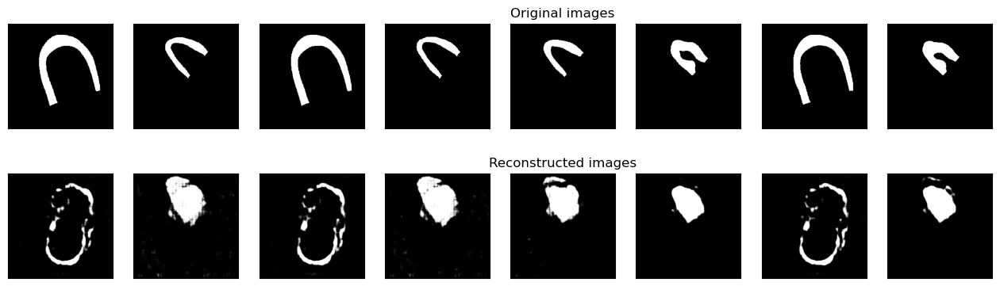


<<<----------------------- EPOCH 34/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9829
Val mean dice: 0.3329
Valid DSC improved from 0.3292 to 0.3329! Best model is saving as---> Myo_VAE_3D_256_32_.pth

 MYO train loss=2712.829 	 and 	 MYO val loss=138937.673
Best val DSC: 0.3329 at epoch number of 34


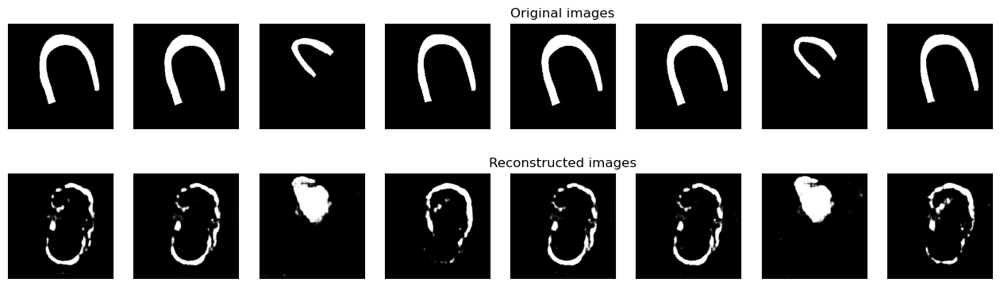


<<<----------------------- EPOCH 35/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9831
Val mean dice: 0.3150

 MYO train loss=2668.016 	 and 	 MYO val loss=135883.586
Best val DSC: 0.3329 at epoch number of 34


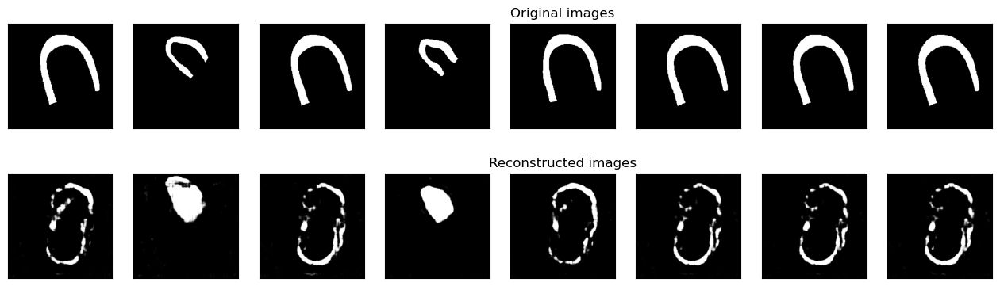


<<<----------------------- EPOCH 36/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9832
Val mean dice: 0.3197

 MYO train loss=2620.253 	 and 	 MYO val loss=135909.399
Best val DSC: 0.3329 at epoch number of 34


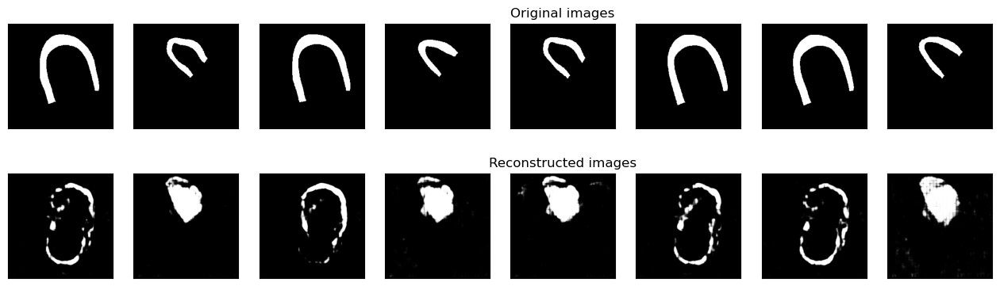


<<<----------------------- EPOCH 37/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9835
Val mean dice: 0.3245

 MYO train loss=2603.491 	 and 	 MYO val loss=137063.803
Best val DSC: 0.3329 at epoch number of 34


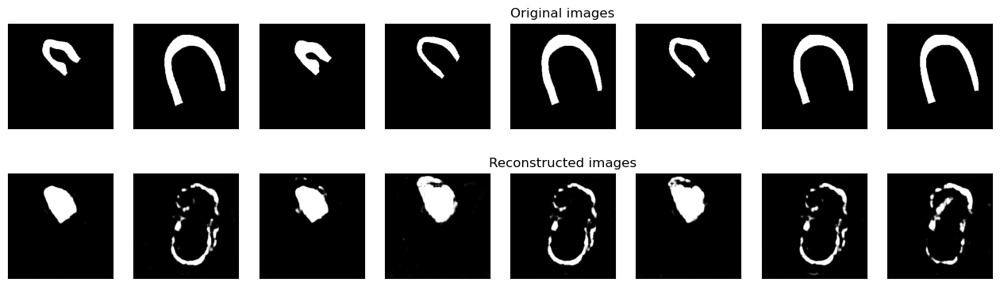


<<<----------------------- EPOCH 38/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9836
Val mean dice: 0.3116

 MYO train loss=2523.092 	 and 	 MYO val loss=134187.830
Best val DSC: 0.3329 at epoch number of 34


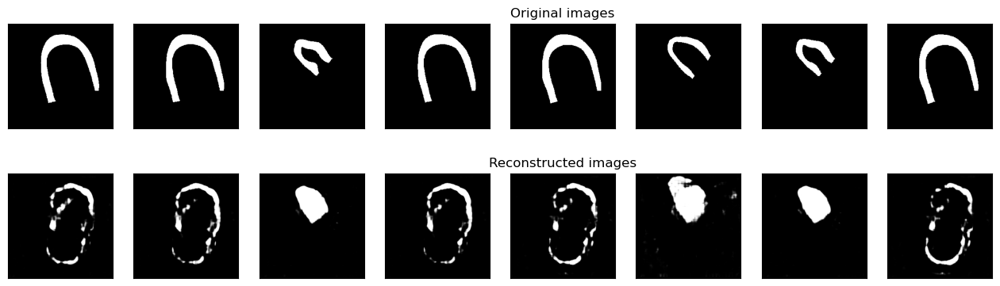


<<<----------------------- EPOCH 39/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9837
Val mean dice: 0.3188

 MYO train loss=2505.424 	 and 	 MYO val loss=134810.254
Best val DSC: 0.3329 at epoch number of 34


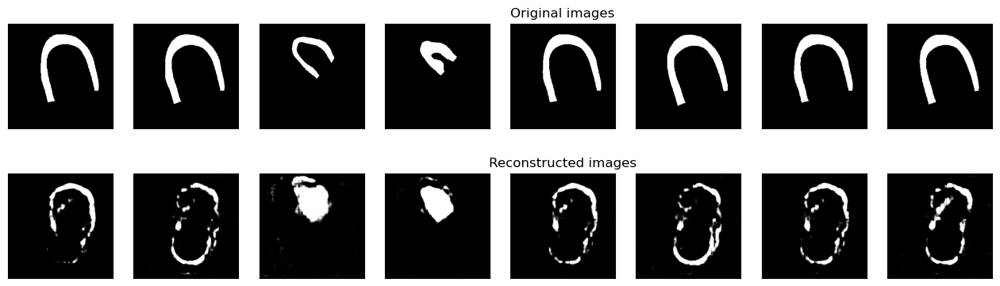


<<<----------------------- EPOCH 40/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9838
Val mean dice: 0.3120

 MYO train loss=2486.631 	 and 	 MYO val loss=135310.757
Best val DSC: 0.3329 at epoch number of 34


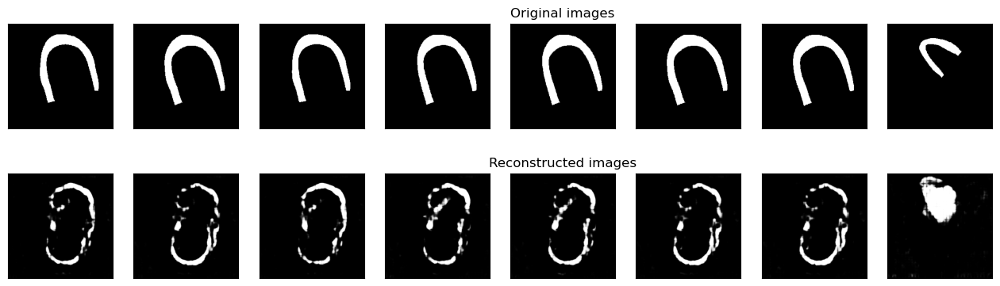


<<<----------------------- EPOCH 41/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9838
Val mean dice: 0.3267

 MYO train loss=2507.910 	 and 	 MYO val loss=138065.512
Best val DSC: 0.3329 at epoch number of 34


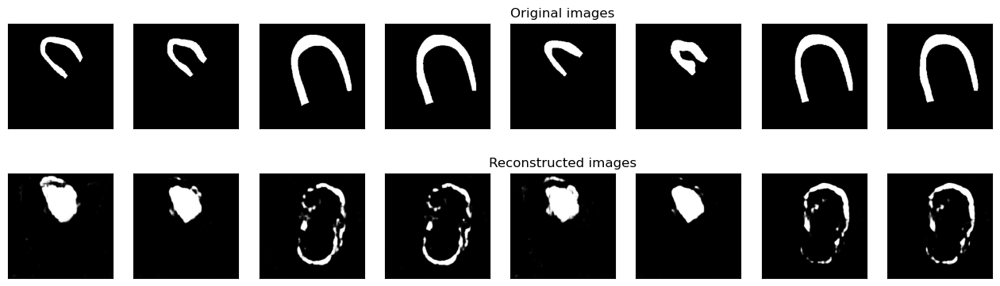


<<<----------------------- EPOCH 42/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9842
Val mean dice: 0.3258

 MYO train loss=2475.963 	 and 	 MYO val loss=137808.578
Best val DSC: 0.3329 at epoch number of 34


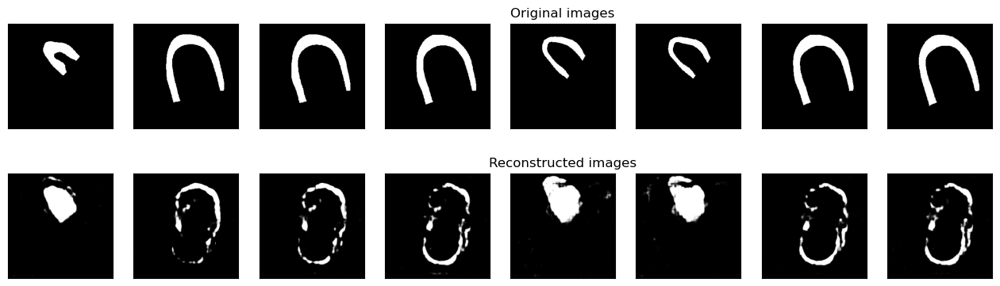


<<<----------------------- EPOCH 43/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9842
Val mean dice: 0.3133

 MYO train loss=2464.647 	 and 	 MYO val loss=134500.091
Best val DSC: 0.3329 at epoch number of 34


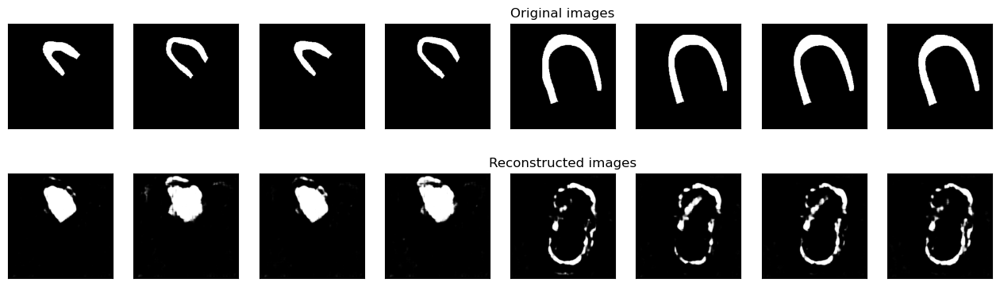


<<<----------------------- EPOCH 44/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9841
Val mean dice: 0.3195

 MYO train loss=2466.798 	 and 	 MYO val loss=136167.404
Best val DSC: 0.3329 at epoch number of 34


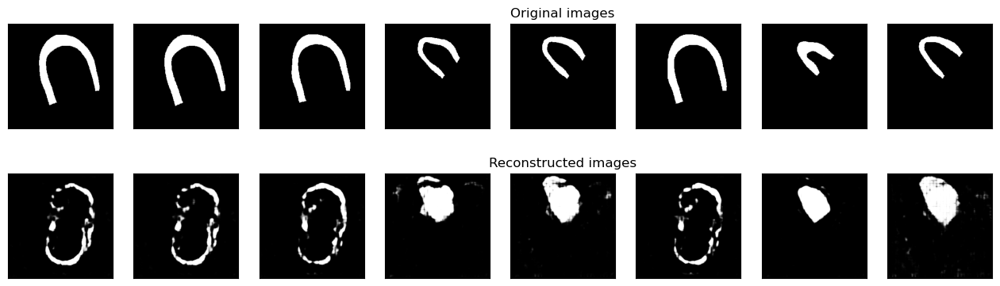


<<<----------------------- EPOCH 45/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9842
Val mean dice: 0.3217

 MYO train loss=2462.902 	 and 	 MYO val loss=134610.882
Best val DSC: 0.3329 at epoch number of 34


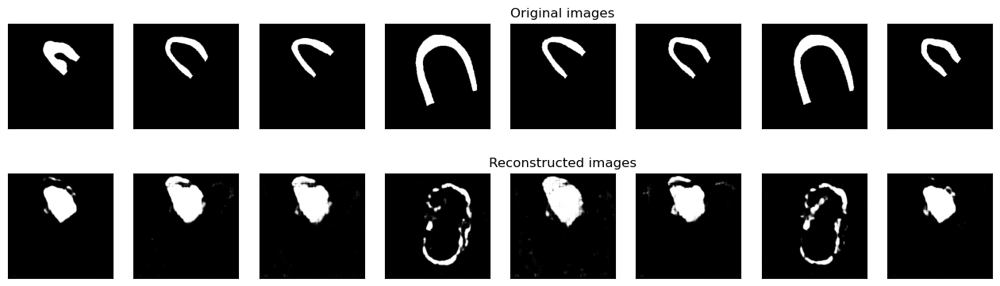


<<<----------------------- EPOCH 46/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9842
Val mean dice: 0.3231

 MYO train loss=2490.908 	 and 	 MYO val loss=136589.147
Best val DSC: 0.3329 at epoch number of 34


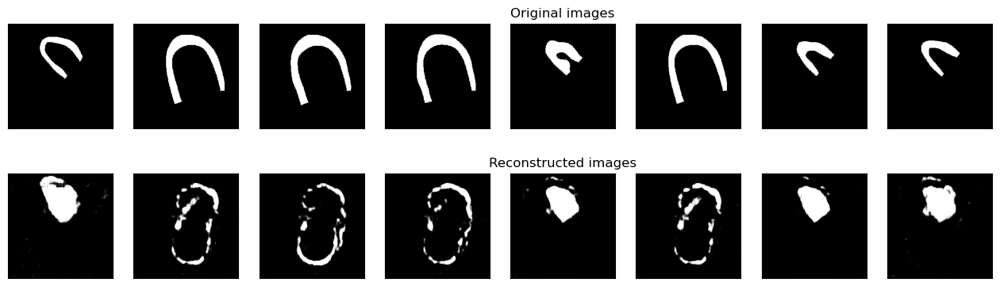


<<<----------------------- EPOCH 47/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9843
Val mean dice: 0.3163

 MYO train loss=2438.919 	 and 	 MYO val loss=135489.397
Best val DSC: 0.3329 at epoch number of 34


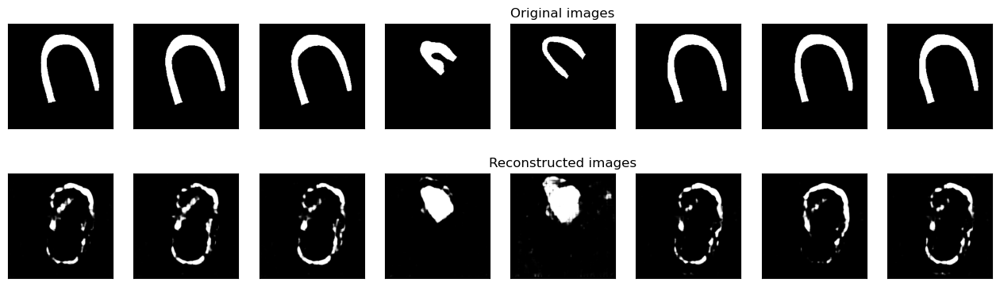


<<<----------------------- EPOCH 48/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9841
Val mean dice: 0.3203

 MYO train loss=2489.304 	 and 	 MYO val loss=135686.978
Best val DSC: 0.3329 at epoch number of 34


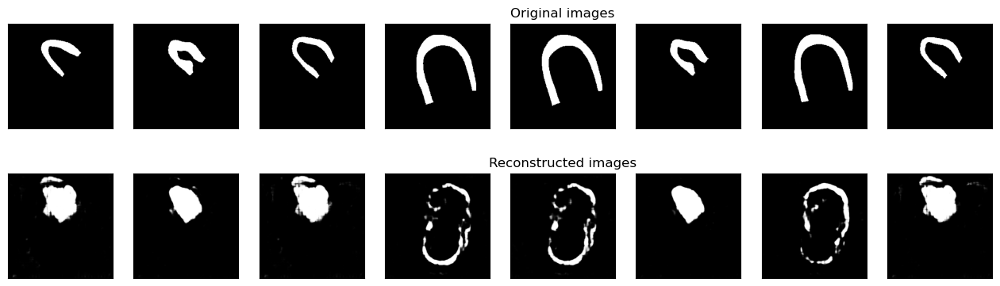


<<<----------------------- EPOCH 49/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9842
Val mean dice: 0.3209

 MYO train loss=2527.276 	 and 	 MYO val loss=136958.802
Best val DSC: 0.3329 at epoch number of 34


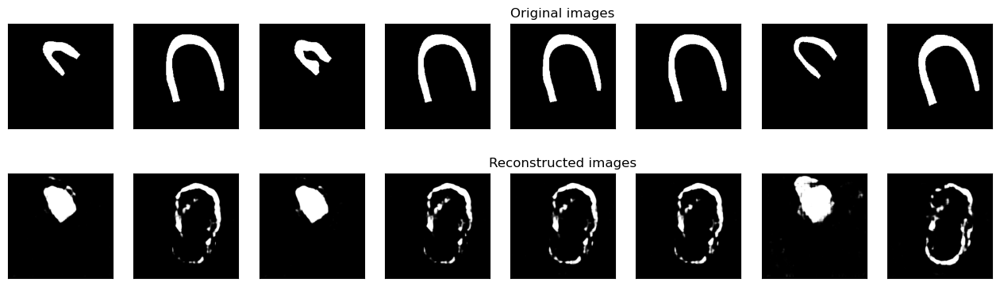


<<<----------------------- EPOCH 50/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9841
Val mean dice: 0.3019

 MYO train loss=2581.764 	 and 	 MYO val loss=131958.899
Best val DSC: 0.3329 at epoch number of 34


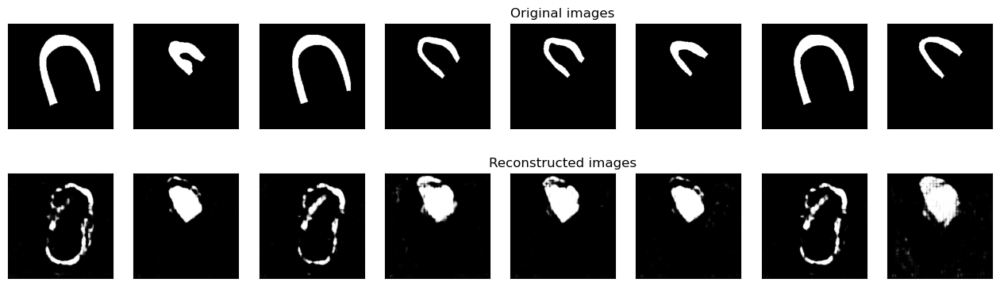


<<<----------------------- EPOCH 51/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9840
Val mean dice: 0.3144

 MYO train loss=2600.709 	 and 	 MYO val loss=135135.517
Best val DSC: 0.3329 at epoch number of 34


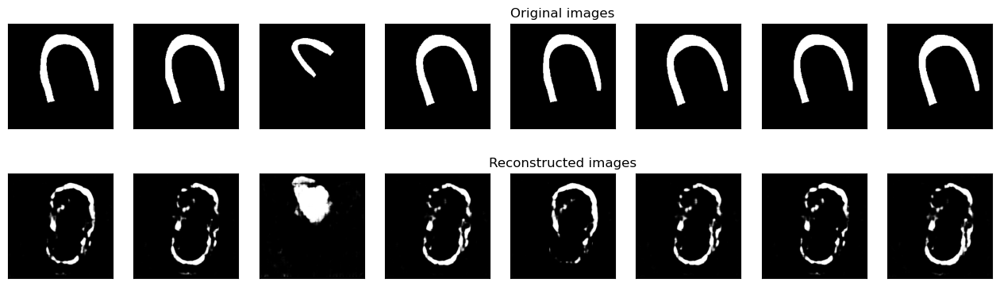


<<<----------------------- EPOCH 52/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9841
Val mean dice: 0.3163

 MYO train loss=2522.296 	 and 	 MYO val loss=135970.177
Best val DSC: 0.3329 at epoch number of 34


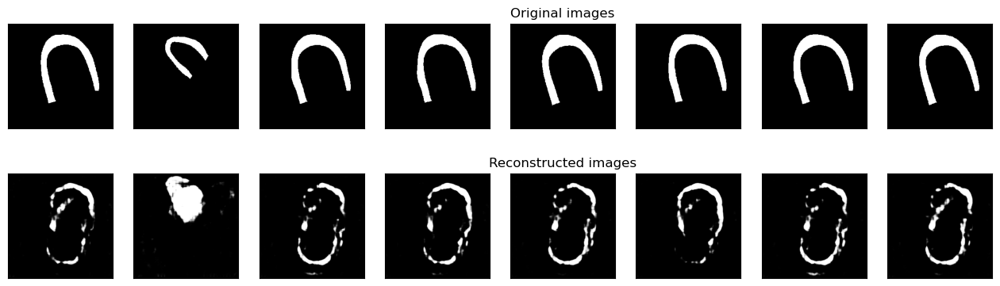


<<<----------------------- EPOCH 53/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9844
Val mean dice: 0.3255

 MYO train loss=2411.266 	 and 	 MYO val loss=138381.289
Best val DSC: 0.3329 at epoch number of 34


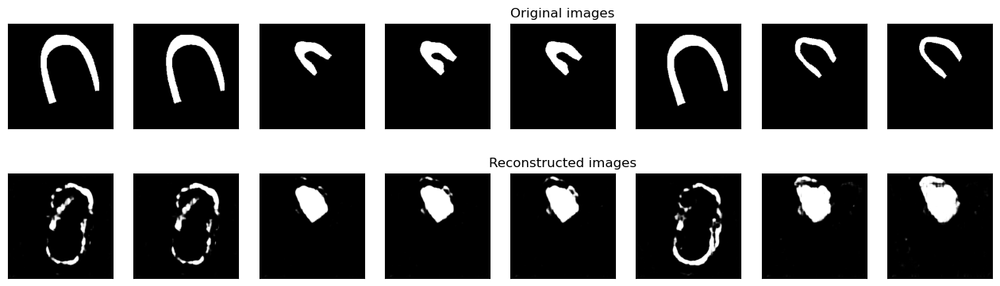


<<<----------------------- EPOCH 54/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9845
Val mean dice: 0.3163

 MYO train loss=2407.701 	 and 	 MYO val loss=137569.087
Best val DSC: 0.3329 at epoch number of 34


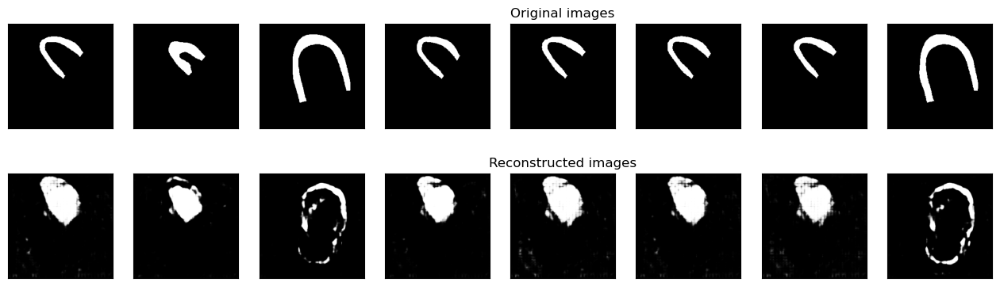


<<<----------------------- EPOCH 55/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9844
Val mean dice: 0.3066

 MYO train loss=2442.627 	 and 	 MYO val loss=135558.429
Best val DSC: 0.3329 at epoch number of 34


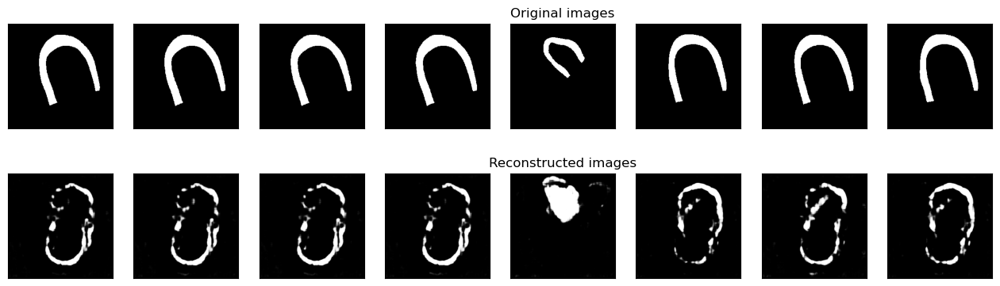


<<<----------------------- EPOCH 56/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9844
Val mean dice: 0.3127

 MYO train loss=2439.953 	 and 	 MYO val loss=136701.339
Best val DSC: 0.3329 at epoch number of 34


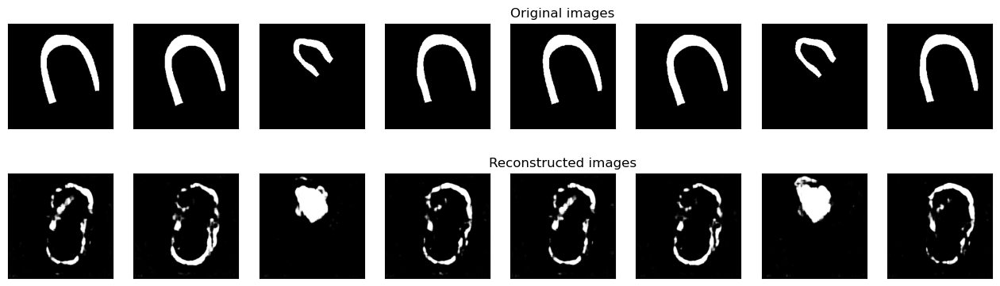


<<<----------------------- EPOCH 57/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9846
Val mean dice: 0.3202

 MYO train loss=2441.244 	 and 	 MYO val loss=136046.852
Best val DSC: 0.3329 at epoch number of 34


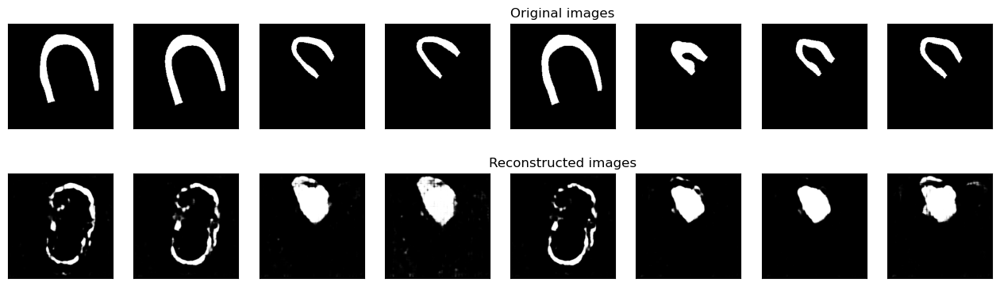


<<<----------------------- EPOCH 58/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9843
Val mean dice: 0.3103

 MYO train loss=2508.428 	 and 	 MYO val loss=135706.738
Best val DSC: 0.3329 at epoch number of 34


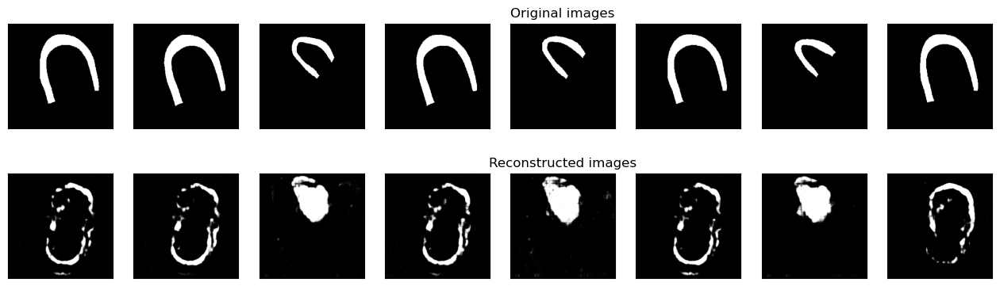


<<<----------------------- EPOCH 59/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9844
Val mean dice: 0.3160

 MYO train loss=2499.601 	 and 	 MYO val loss=137826.602
Best val DSC: 0.3329 at epoch number of 34


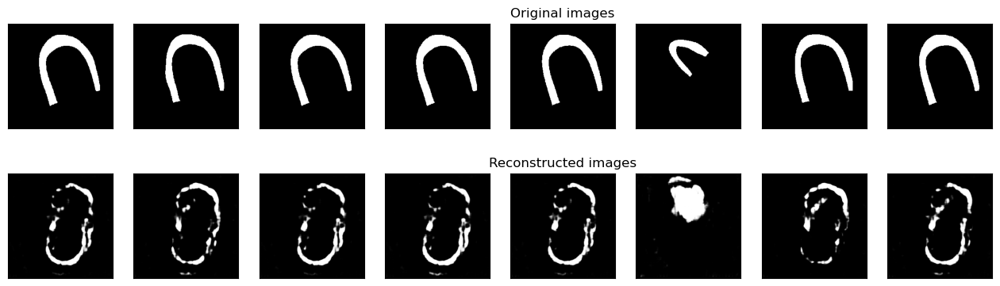


<<<----------------------- EPOCH 60/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9846
Val mean dice: 0.3198

 MYO train loss=2439.101 	 and 	 MYO val loss=137489.319
Best val DSC: 0.3329 at epoch number of 34


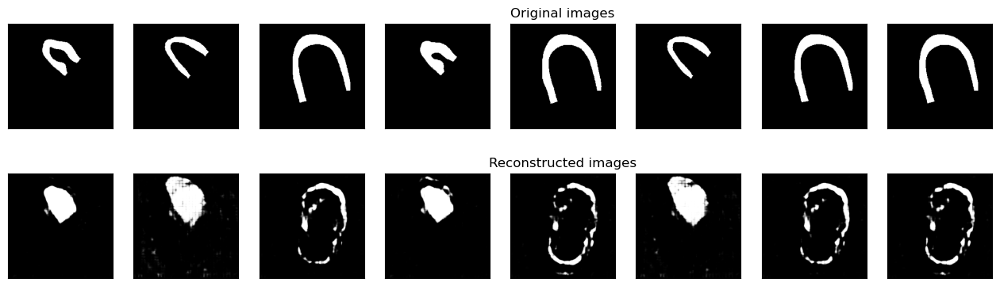


<<<----------------------- EPOCH 61/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9847
Val mean dice: 0.3150

 MYO train loss=2412.294 	 and 	 MYO val loss=137970.773
Best val DSC: 0.3329 at epoch number of 34


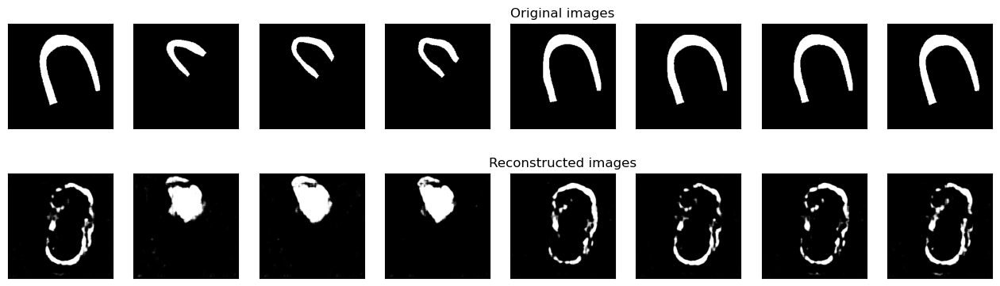


<<<----------------------- EPOCH 62/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9848
Val mean dice: 0.3166

 MYO train loss=2387.304 	 and 	 MYO val loss=137209.988
Best val DSC: 0.3329 at epoch number of 34


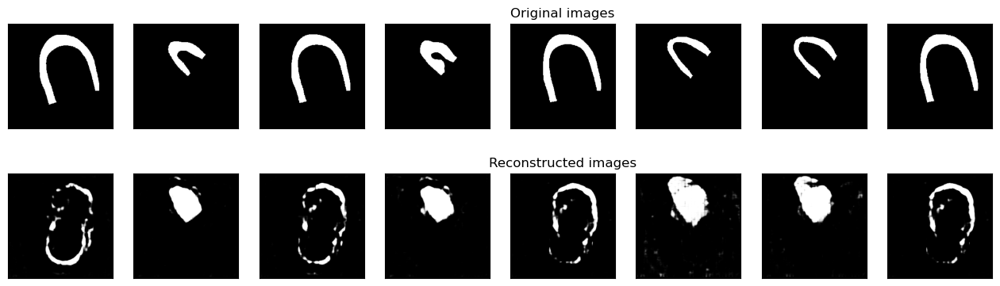


<<<----------------------- EPOCH 63/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9848
Val mean dice: 0.3116

 MYO train loss=2412.182 	 and 	 MYO val loss=136264.724
Best val DSC: 0.3329 at epoch number of 34


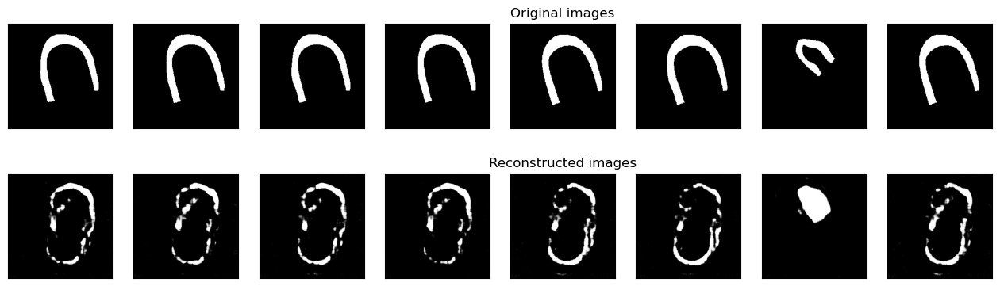


<<<----------------------- EPOCH 64/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9847
Val mean dice: 0.3256

 MYO train loss=2430.681 	 and 	 MYO val loss=138297.992
Best val DSC: 0.3329 at epoch number of 34


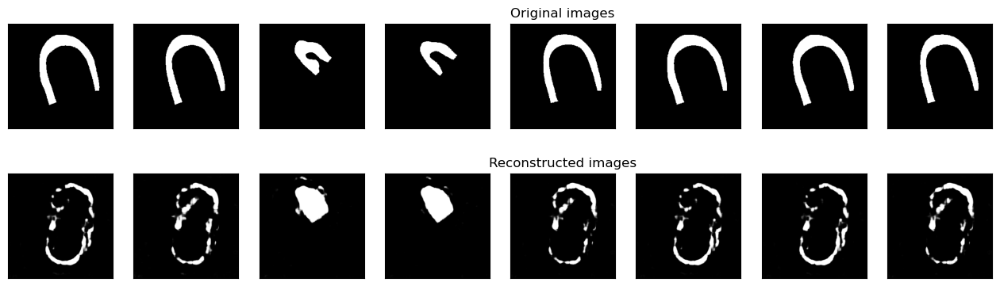


<<<----------------------- EPOCH 65/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3168

 MYO train loss=2359.257 	 and 	 MYO val loss=136781.909
Best val DSC: 0.3329 at epoch number of 34


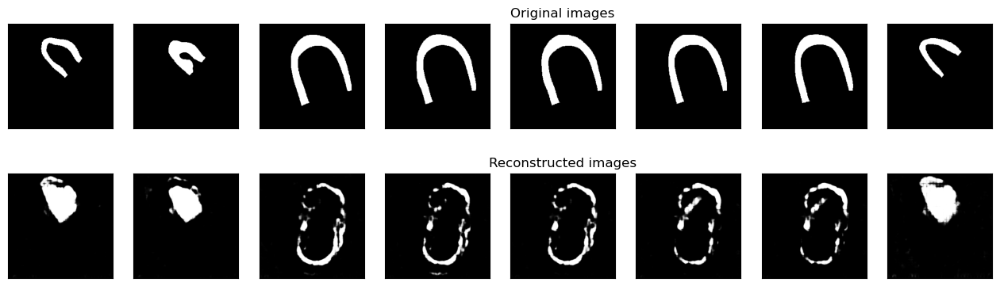


<<<----------------------- EPOCH 66/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9849
Val mean dice: 0.3221

 MYO train loss=2404.469 	 and 	 MYO val loss=138258.228
Best val DSC: 0.3329 at epoch number of 34


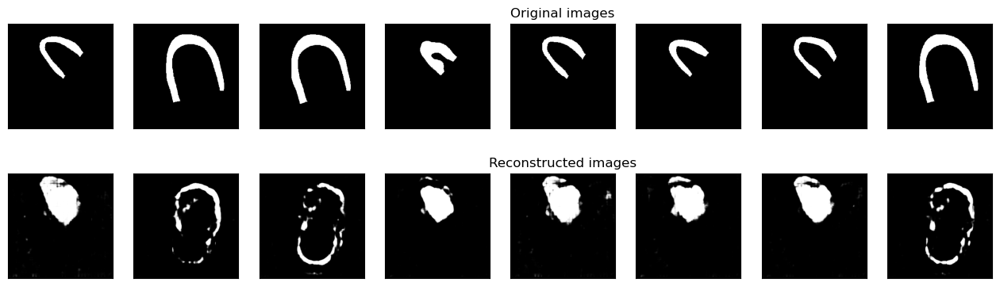


<<<----------------------- EPOCH 67/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9849
Val mean dice: 0.3219

 MYO train loss=2382.437 	 and 	 MYO val loss=139783.522
Best val DSC: 0.3329 at epoch number of 34


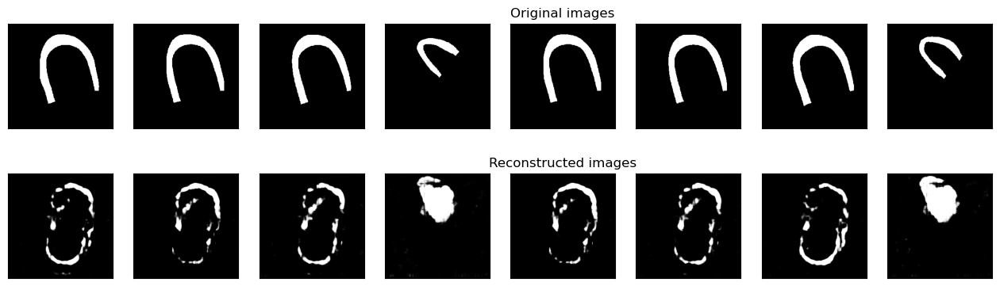


<<<----------------------- EPOCH 68/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9847
Val mean dice: 0.3127

 MYO train loss=2462.031 	 and 	 MYO val loss=138634.495
Best val DSC: 0.3329 at epoch number of 34


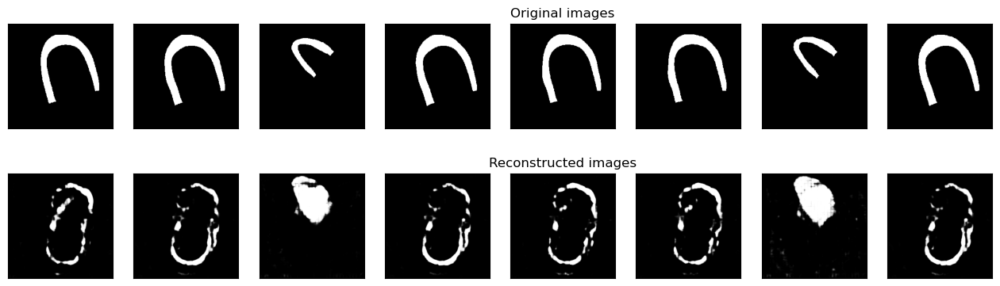


<<<----------------------- EPOCH 69/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9848
Val mean dice: 0.3222

 MYO train loss=2452.363 	 and 	 MYO val loss=139197.157
Best val DSC: 0.3329 at epoch number of 34


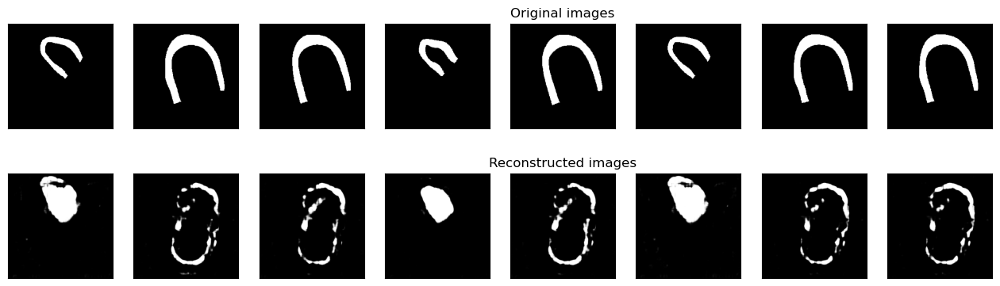


<<<----------------------- EPOCH 70/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3065

 MYO train loss=2402.001 	 and 	 MYO val loss=136413.968
Best val DSC: 0.3329 at epoch number of 34


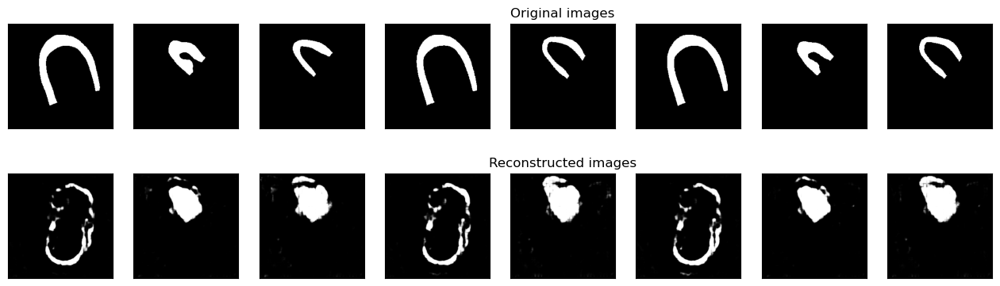


<<<----------------------- EPOCH 71/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3153

 MYO train loss=2392.825 	 and 	 MYO val loss=139212.205
Best val DSC: 0.3329 at epoch number of 34


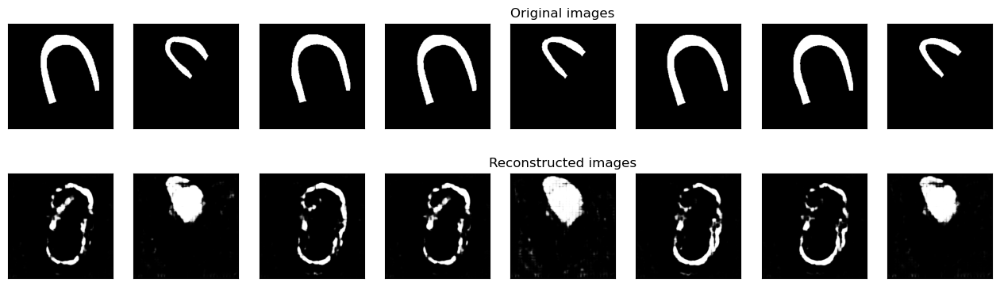


<<<----------------------- EPOCH 72/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9851
Val mean dice: 0.3135

 MYO train loss=2332.905 	 and 	 MYO val loss=137371.215
Best val DSC: 0.3329 at epoch number of 34


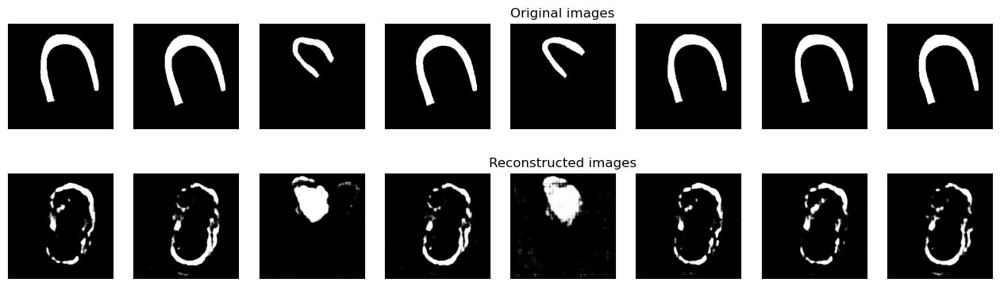


<<<----------------------- EPOCH 73/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3103

 MYO train loss=2359.050 	 and 	 MYO val loss=137643.825
Best val DSC: 0.3329 at epoch number of 34


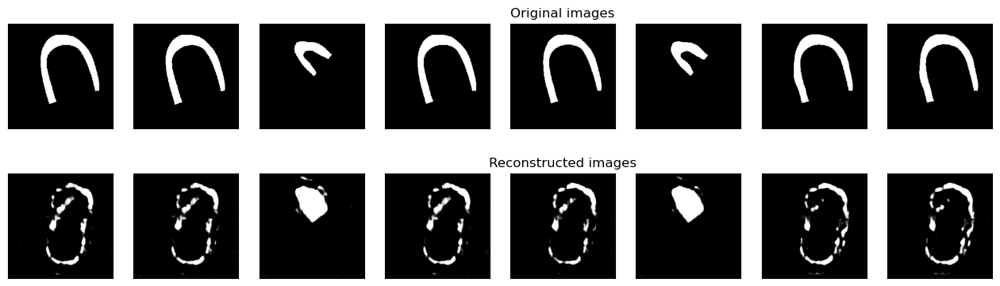


<<<----------------------- EPOCH 74/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3212

 MYO train loss=2374.431 	 and 	 MYO val loss=140558.296
Best val DSC: 0.3329 at epoch number of 34


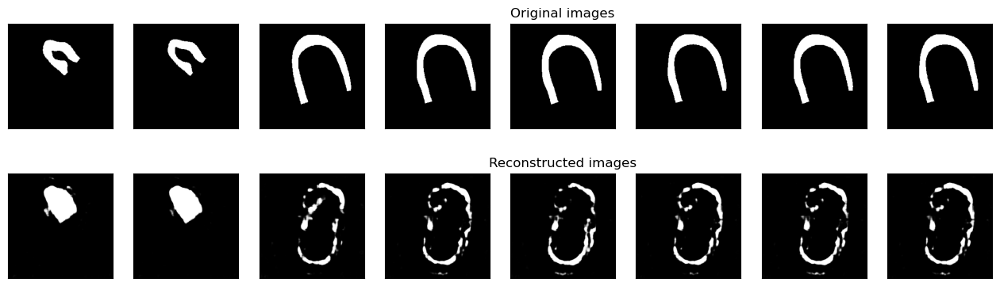


<<<----------------------- EPOCH 75/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9849
Val mean dice: 0.3160

 MYO train loss=2396.553 	 and 	 MYO val loss=137761.449
Best val DSC: 0.3329 at epoch number of 34


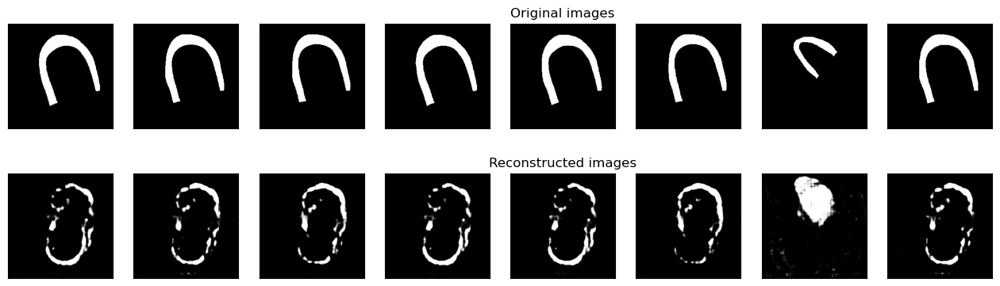


<<<----------------------- EPOCH 76/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9851
Val mean dice: 0.3236

 MYO train loss=2380.876 	 and 	 MYO val loss=140520.320
Best val DSC: 0.3329 at epoch number of 34


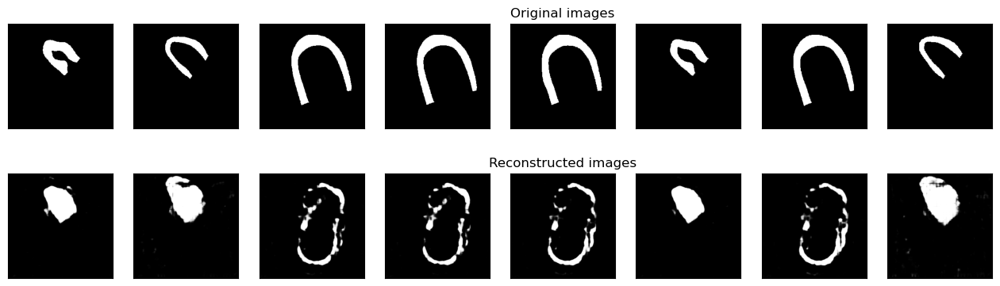


<<<----------------------- EPOCH 77/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9851
Val mean dice: 0.3149

 MYO train loss=2395.176 	 and 	 MYO val loss=138476.275
Best val DSC: 0.3329 at epoch number of 34


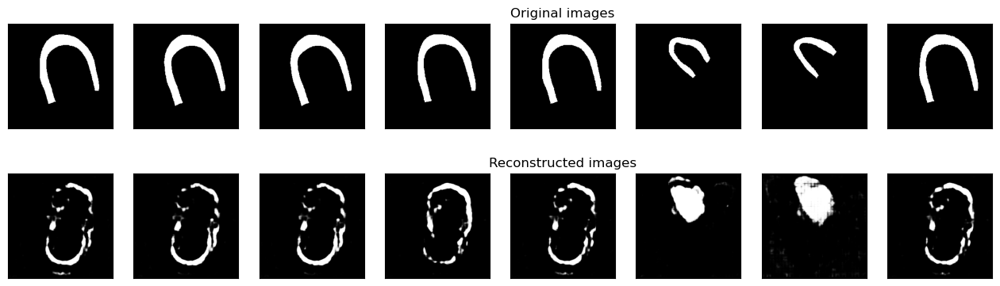


<<<----------------------- EPOCH 78/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9851
Val mean dice: 0.3079

 MYO train loss=2441.336 	 and 	 MYO val loss=137954.040
Best val DSC: 0.3329 at epoch number of 34


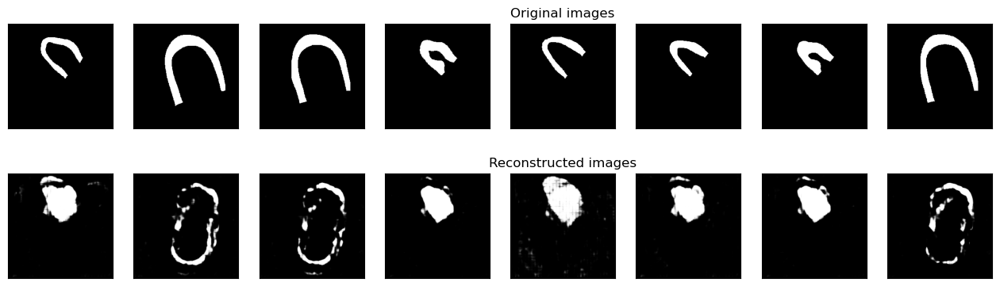


<<<----------------------- EPOCH 79/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3076

 MYO train loss=2410.785 	 and 	 MYO val loss=136792.327
Best val DSC: 0.3329 at epoch number of 34


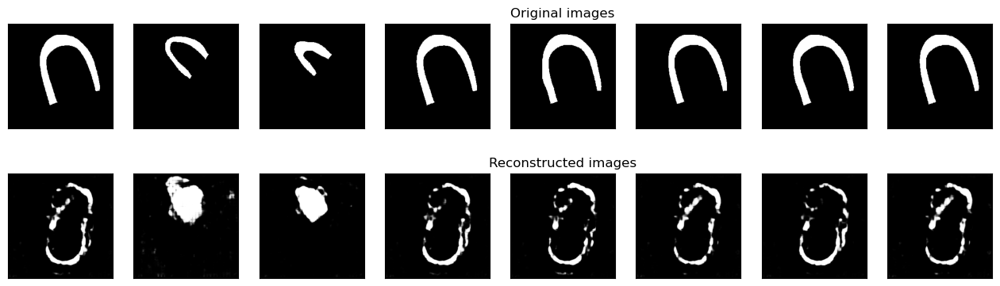


<<<----------------------- EPOCH 80/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9852
Val mean dice: 0.3191

 MYO train loss=2357.117 	 and 	 MYO val loss=138872.433
Best val DSC: 0.3329 at epoch number of 34


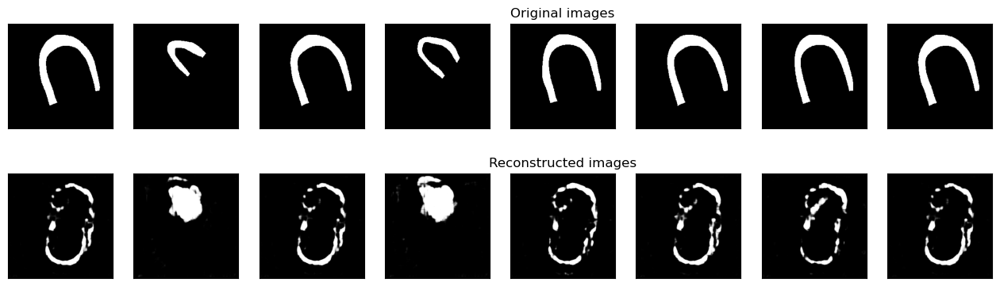


<<<----------------------- EPOCH 81/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9852
Val mean dice: 0.3143

 MYO train loss=2365.420 	 and 	 MYO val loss=136570.639
Best val DSC: 0.3329 at epoch number of 34


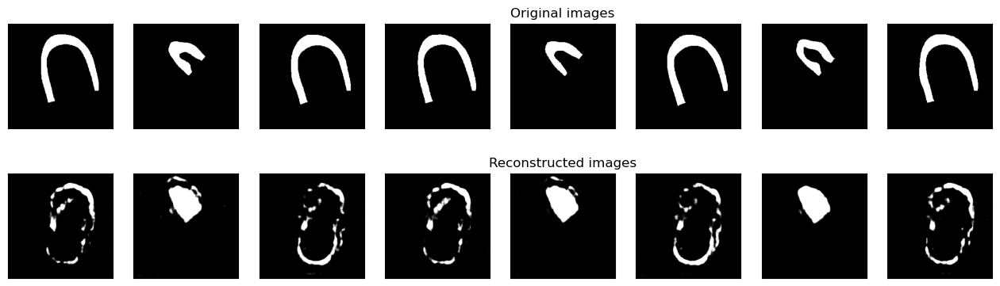


<<<----------------------- EPOCH 82/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9850
Val mean dice: 0.3139

 MYO train loss=2440.537 	 and 	 MYO val loss=137415.981
Best val DSC: 0.3329 at epoch number of 34


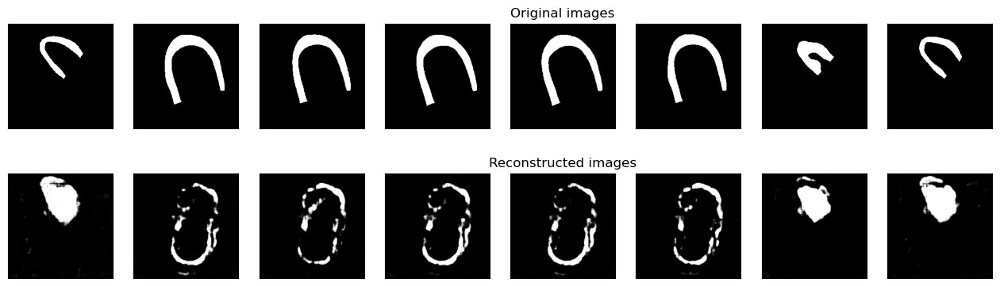


<<<----------------------- EPOCH 83/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9849
Val mean dice: 0.3122

 MYO train loss=2458.870 	 and 	 MYO val loss=137560.459
Best val DSC: 0.3329 at epoch number of 34


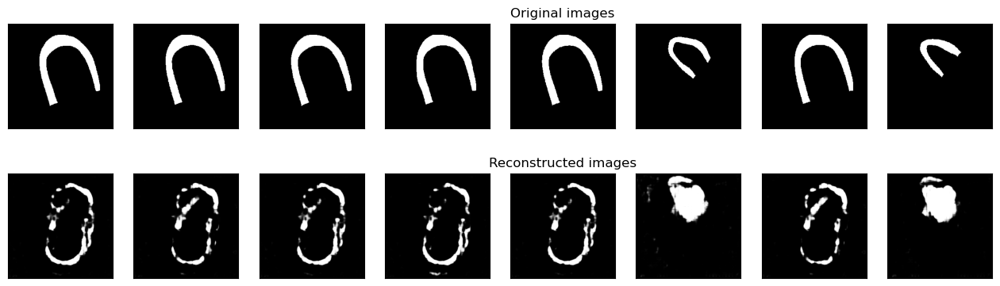


<<<----------------------- EPOCH 84/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9851
Val mean dice: 0.3230

 MYO train loss=2392.352 	 and 	 MYO val loss=140293.746
Best val DSC: 0.3329 at epoch number of 34


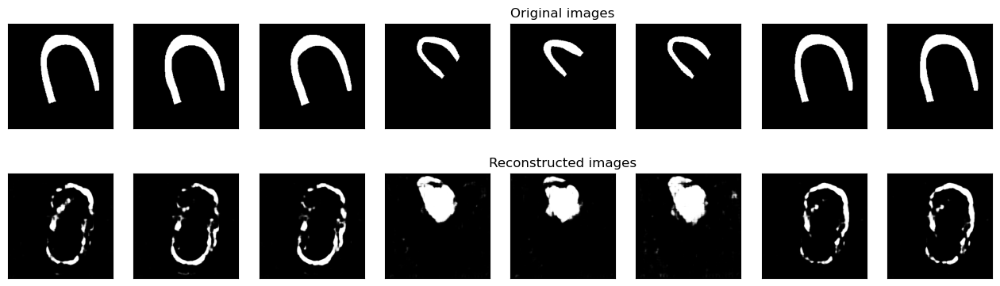


<<<----------------------- EPOCH 85/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9855
Val mean dice: 0.3040

 MYO train loss=2328.865 	 and 	 MYO val loss=135807.013
Best val DSC: 0.3329 at epoch number of 34


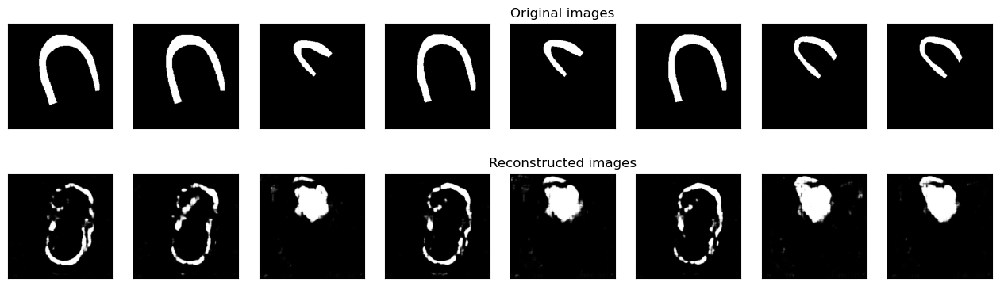


<<<----------------------- EPOCH 86/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9855
Val mean dice: 0.3176

 MYO train loss=2306.927 	 and 	 MYO val loss=139474.193
Best val DSC: 0.3329 at epoch number of 34


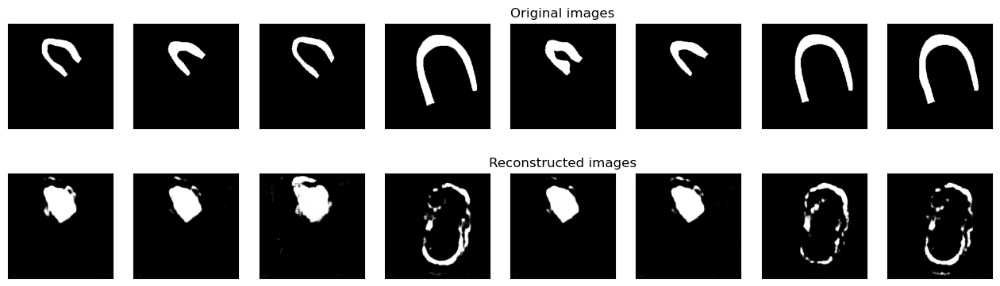


<<<----------------------- EPOCH 87/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9855
Val mean dice: 0.3053

 MYO train loss=2293.894 	 and 	 MYO val loss=137351.891
Best val DSC: 0.3329 at epoch number of 34


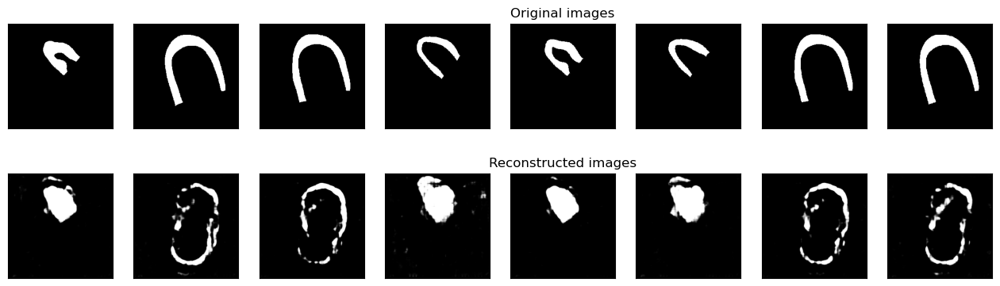


<<<----------------------- EPOCH 88/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9855
Val mean dice: 0.3038

 MYO train loss=2346.405 	 and 	 MYO val loss=137675.283
Best val DSC: 0.3329 at epoch number of 34


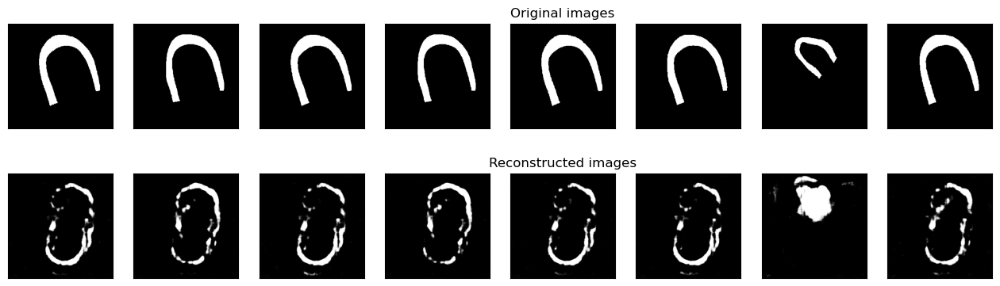


<<<----------------------- EPOCH 89/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9854
Val mean dice: 0.3129

 MYO train loss=2355.709 	 and 	 MYO val loss=140191.230
Best val DSC: 0.3329 at epoch number of 34


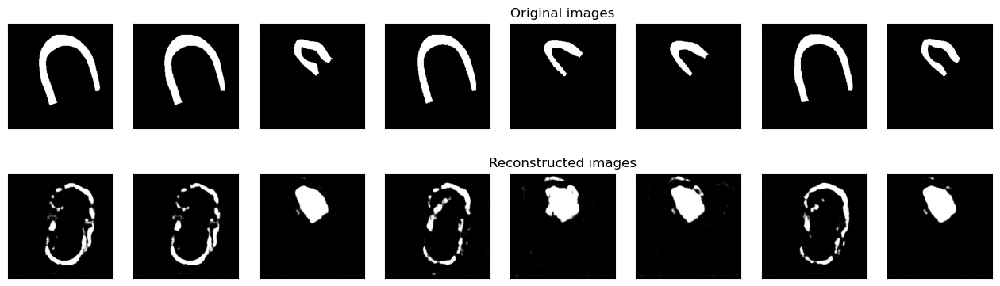


<<<----------------------- EPOCH 90/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9854
Val mean dice: 0.3030

 MYO train loss=2319.708 	 and 	 MYO val loss=136294.991
Best val DSC: 0.3329 at epoch number of 34


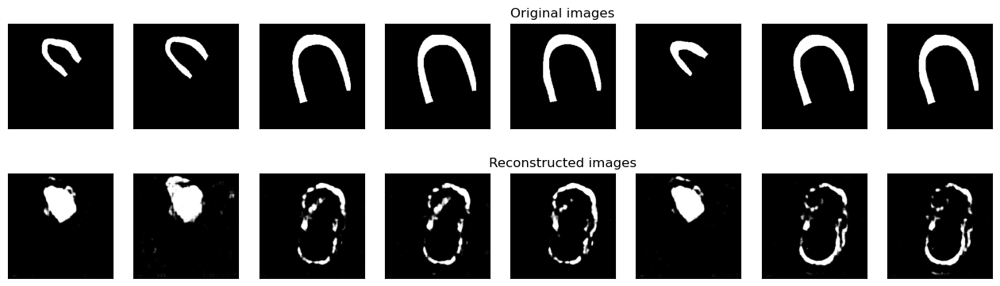


<<<----------------------- EPOCH 91/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9856
Val mean dice: 0.3094

 MYO train loss=2276.107 	 and 	 MYO val loss=136320.473
Best val DSC: 0.3329 at epoch number of 34


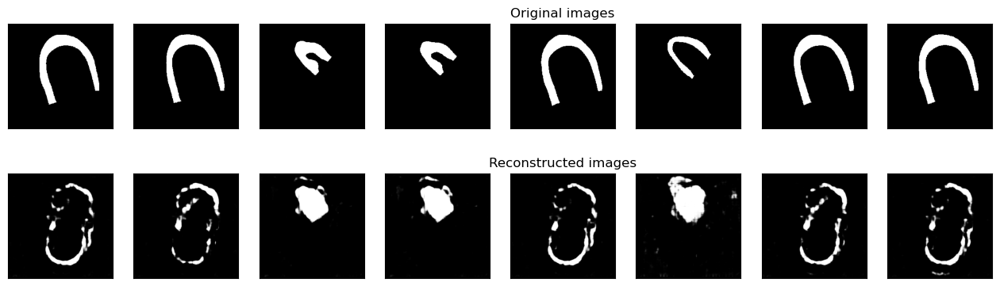


<<<----------------------- EPOCH 92/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9854
Val mean dice: 0.3236

 MYO train loss=2329.611 	 and 	 MYO val loss=139021.882
Best val DSC: 0.3329 at epoch number of 34


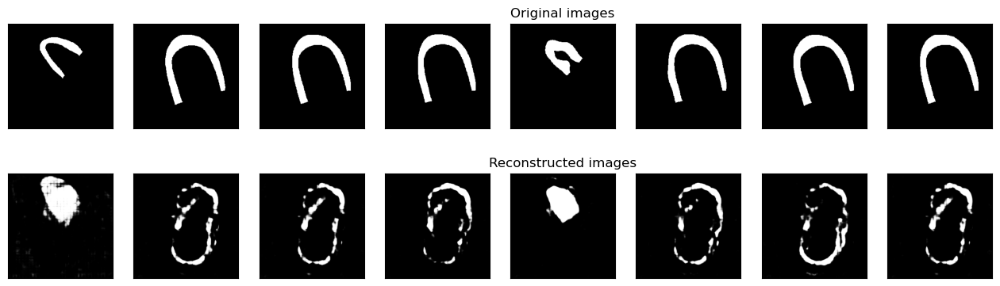


<<<----------------------- EPOCH 93/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9857
Val mean dice: 0.3132

 MYO train loss=2323.431 	 and 	 MYO val loss=137778.332
Best val DSC: 0.3329 at epoch number of 34


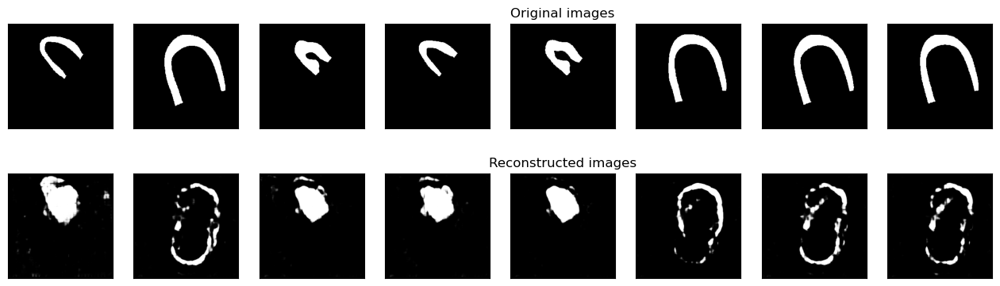


<<<----------------------- EPOCH 94/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9856
Val mean dice: 0.3066

 MYO train loss=2284.265 	 and 	 MYO val loss=138444.054
Best val DSC: 0.3329 at epoch number of 34


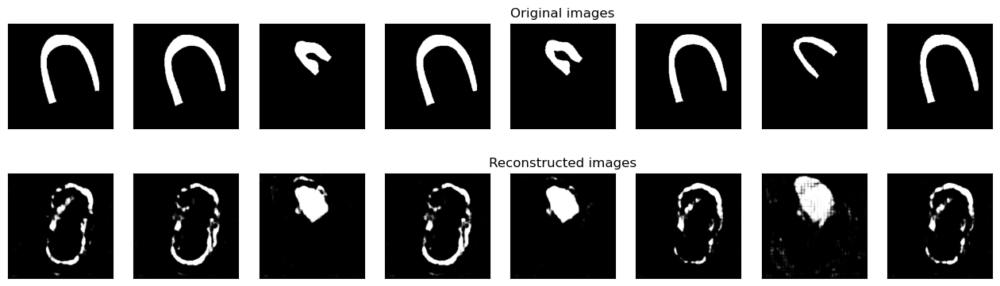


<<<----------------------- EPOCH 95/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9856
Val mean dice: 0.3199

 MYO train loss=2286.600 	 and 	 MYO val loss=140283.828
Best val DSC: 0.3329 at epoch number of 34


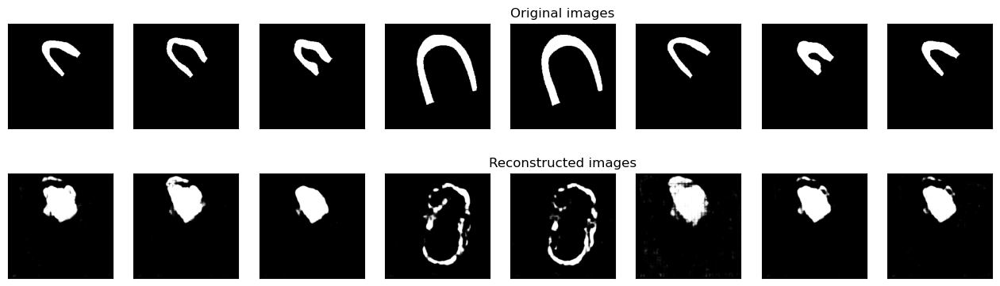


<<<----------------------- EPOCH 96/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3112

 MYO train loss=2257.777 	 and 	 MYO val loss=135850.714
Best val DSC: 0.3329 at epoch number of 34


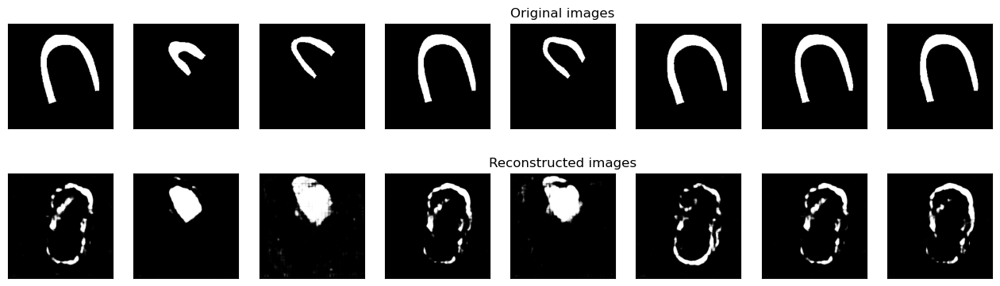


<<<----------------------- EPOCH 97/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3175

 MYO train loss=2260.554 	 and 	 MYO val loss=139556.525
Best val DSC: 0.3329 at epoch number of 34


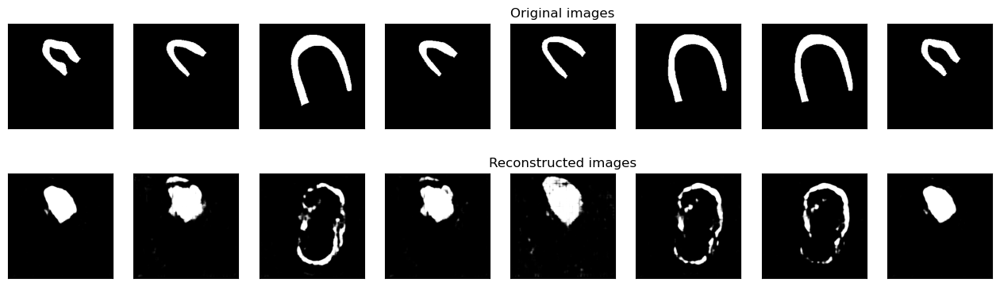


<<<----------------------- EPOCH 98/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3058

 MYO train loss=2269.002 	 and 	 MYO val loss=137222.723
Best val DSC: 0.3329 at epoch number of 34


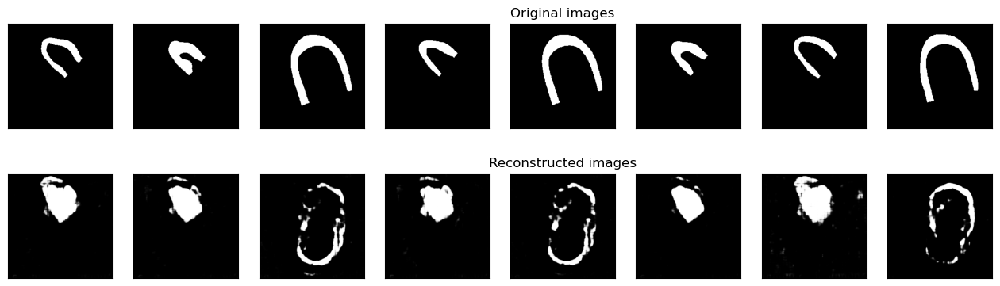


<<<----------------------- EPOCH 99/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3158

 MYO train loss=2282.231 	 and 	 MYO val loss=138321.553
Best val DSC: 0.3329 at epoch number of 34


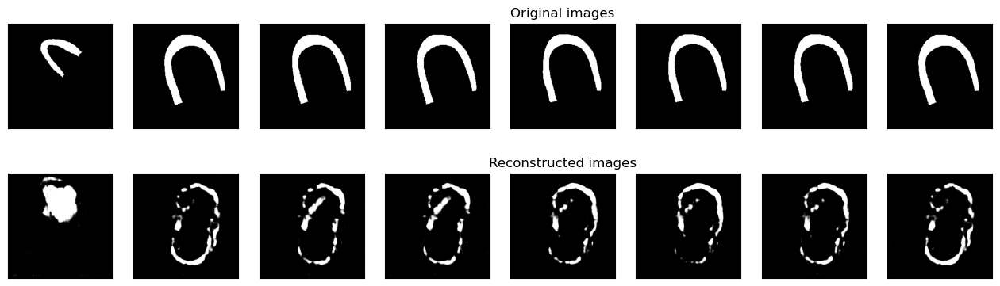


<<<----------------------- EPOCH 100/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3153

 MYO train loss=2308.226 	 and 	 MYO val loss=140977.640
Best val DSC: 0.3329 at epoch number of 34


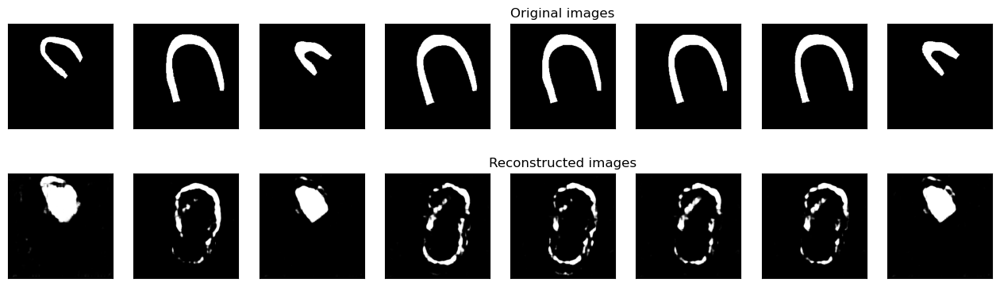


<<<----------------------- EPOCH 101/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3129

 MYO train loss=2284.058 	 and 	 MYO val loss=139534.082
Best val DSC: 0.3329 at epoch number of 34


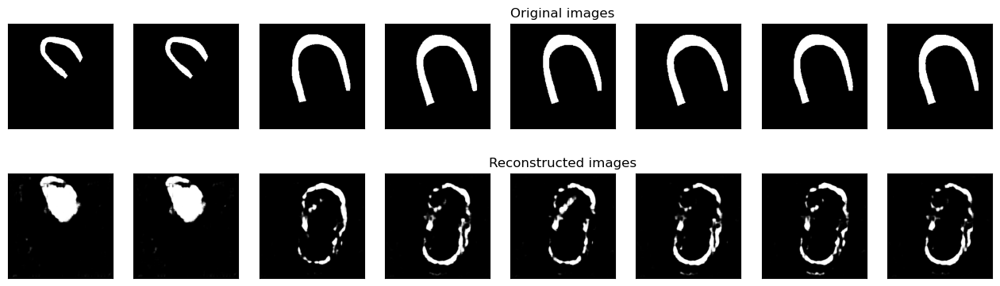


<<<----------------------- EPOCH 102/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3009

 MYO train loss=2264.740 	 and 	 MYO val loss=139792.117
Best val DSC: 0.3329 at epoch number of 34


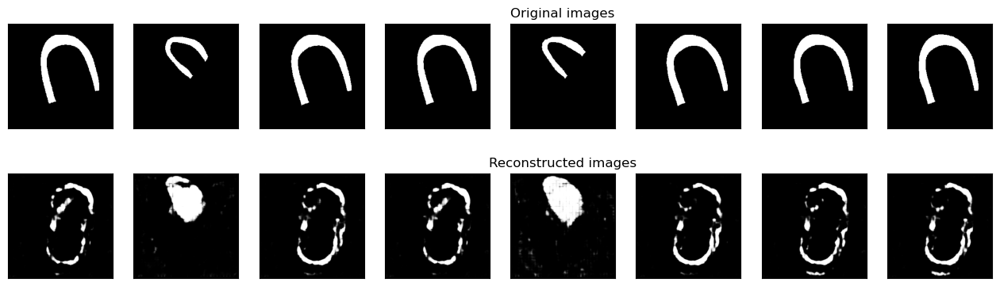


<<<----------------------- EPOCH 103/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3175

 MYO train loss=2263.747 	 and 	 MYO val loss=142465.306
Best val DSC: 0.3329 at epoch number of 34


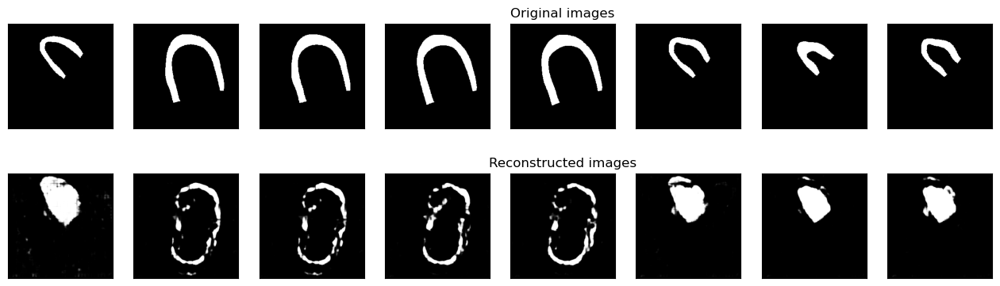


<<<----------------------- EPOCH 104/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3169

 MYO train loss=2265.978 	 and 	 MYO val loss=139891.270
Best val DSC: 0.3329 at epoch number of 34


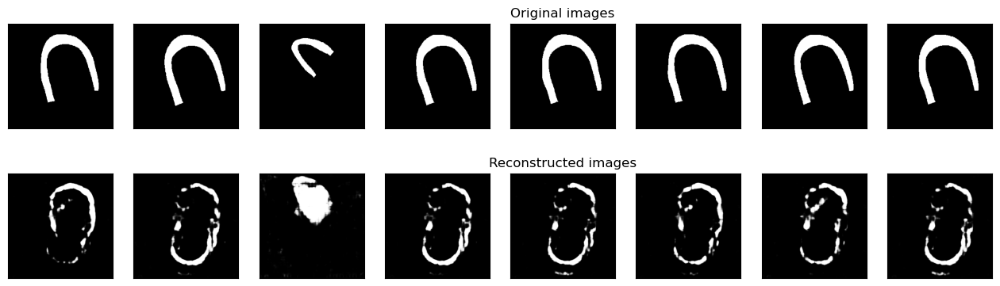


<<<----------------------- EPOCH 105/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3132

 MYO train loss=2293.603 	 and 	 MYO val loss=139782.732
Best val DSC: 0.3329 at epoch number of 34


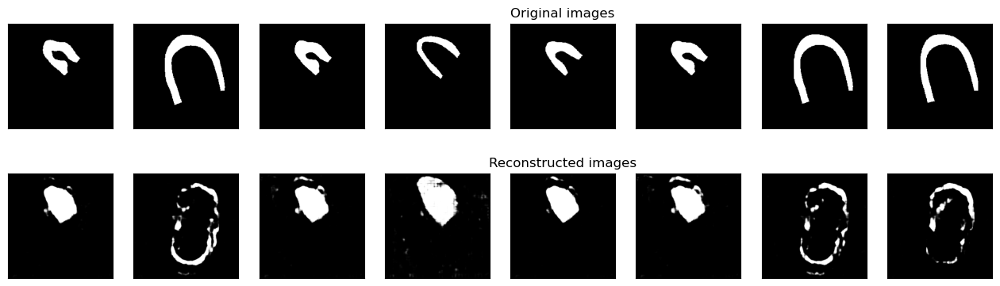


<<<----------------------- EPOCH 106/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3127

 MYO train loss=2304.541 	 and 	 MYO val loss=137500.142
Best val DSC: 0.3329 at epoch number of 34


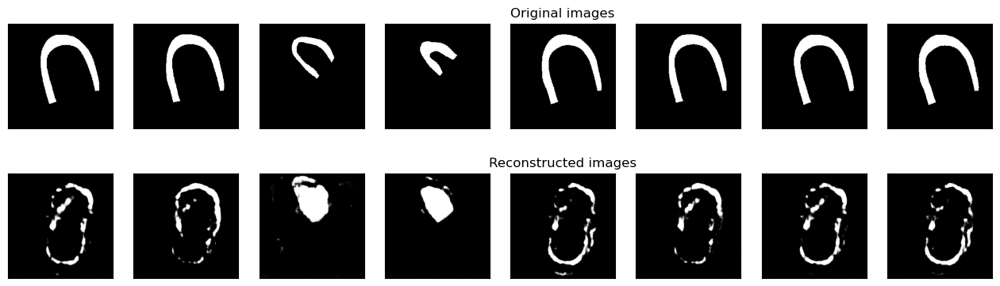


<<<----------------------- EPOCH 107/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9862
Val mean dice: 0.3083

 MYO train loss=2234.669 	 and 	 MYO val loss=138503.829
Best val DSC: 0.3329 at epoch number of 34


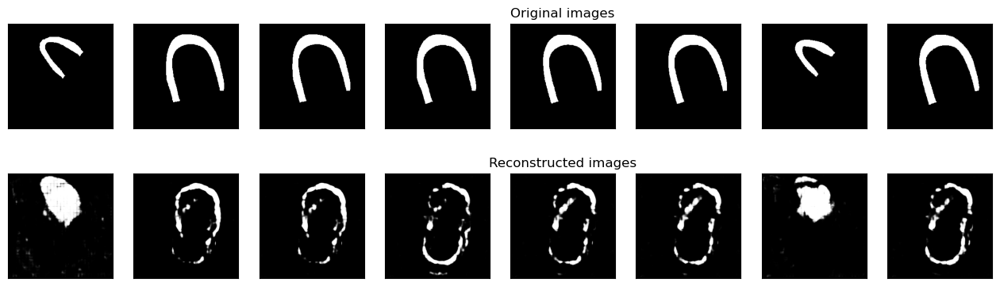


<<<----------------------- EPOCH 108/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3133

 MYO train loss=2279.948 	 and 	 MYO val loss=140287.246
Best val DSC: 0.3329 at epoch number of 34


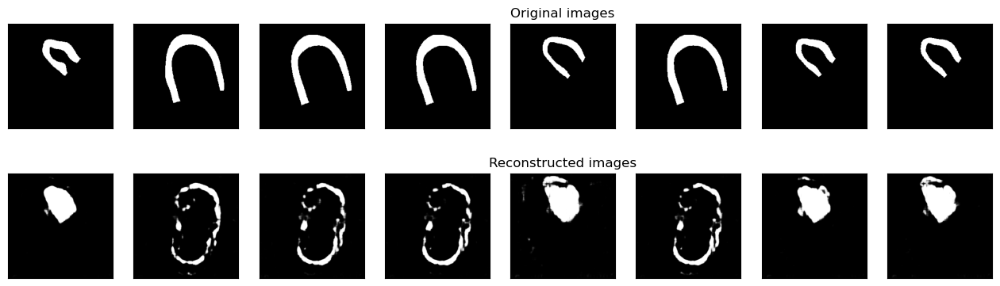


<<<----------------------- EPOCH 109/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3101

 MYO train loss=2285.831 	 and 	 MYO val loss=138852.429
Best val DSC: 0.3329 at epoch number of 34


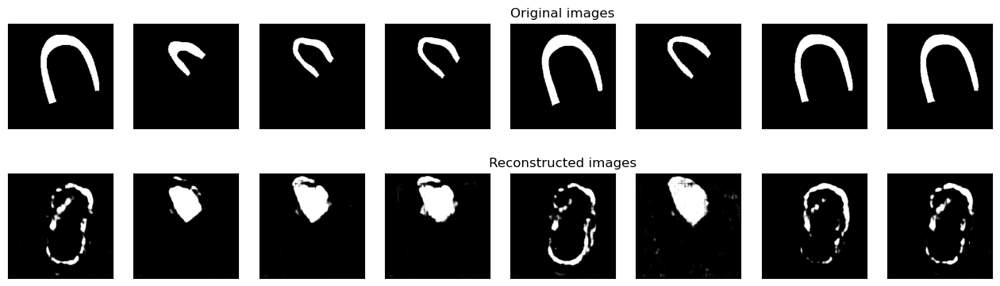


<<<----------------------- EPOCH 110/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3091

 MYO train loss=2260.722 	 and 	 MYO val loss=139979.050
Best val DSC: 0.3329 at epoch number of 34


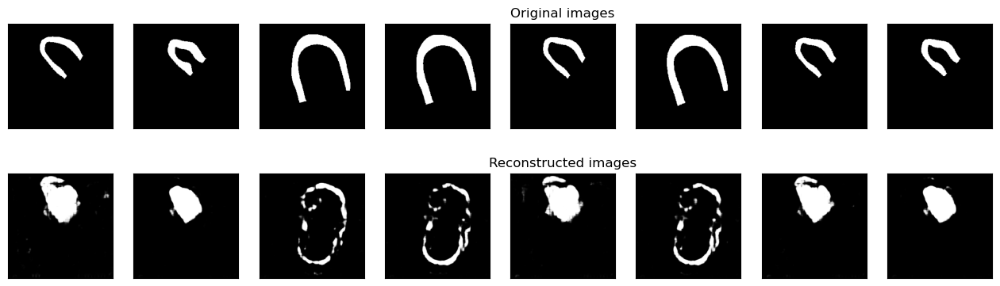


<<<----------------------- EPOCH 111/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9856
Val mean dice: 0.3057

 MYO train loss=2375.468 	 and 	 MYO val loss=137105.142
Best val DSC: 0.3329 at epoch number of 34


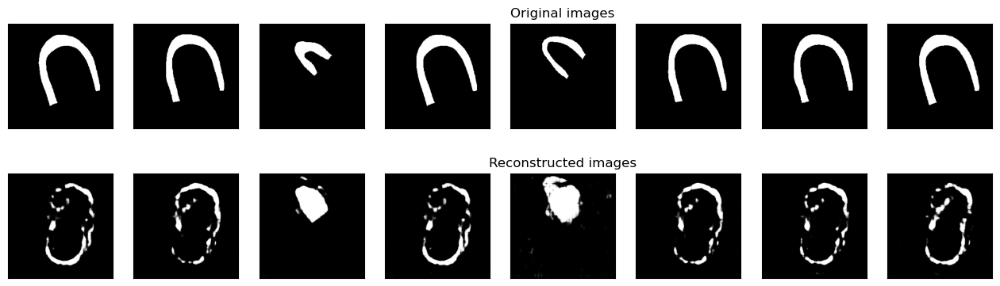


<<<----------------------- EPOCH 112/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9856
Val mean dice: 0.3100

 MYO train loss=2404.566 	 and 	 MYO val loss=137262.366
Best val DSC: 0.3329 at epoch number of 34


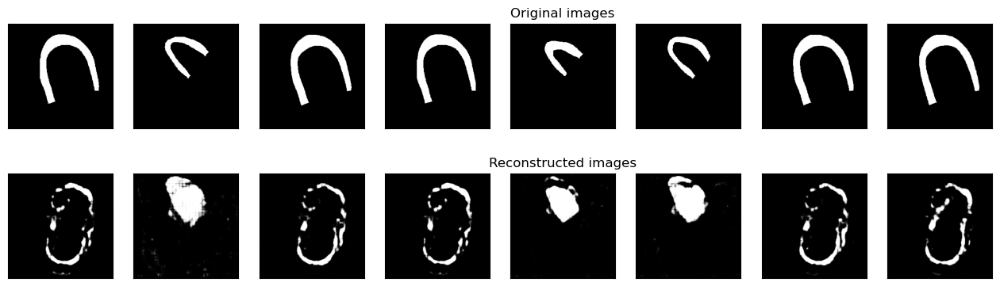


<<<----------------------- EPOCH 113/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3121

 MYO train loss=2344.013 	 and 	 MYO val loss=140548.597
Best val DSC: 0.3329 at epoch number of 34


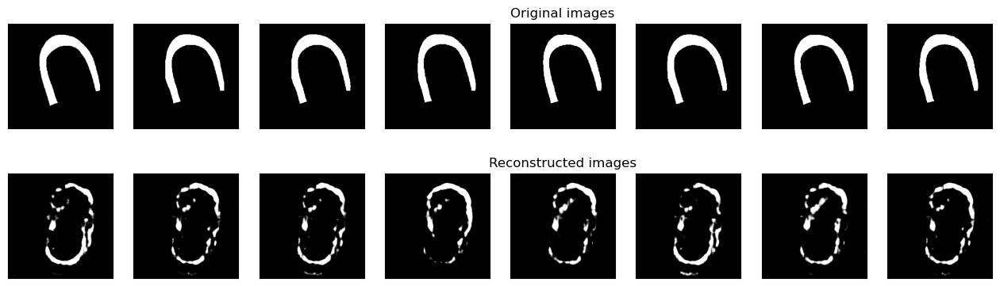


<<<----------------------- EPOCH 114/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9858
Val mean dice: 0.3084

 MYO train loss=2330.859 	 and 	 MYO val loss=137882.952
Best val DSC: 0.3329 at epoch number of 34


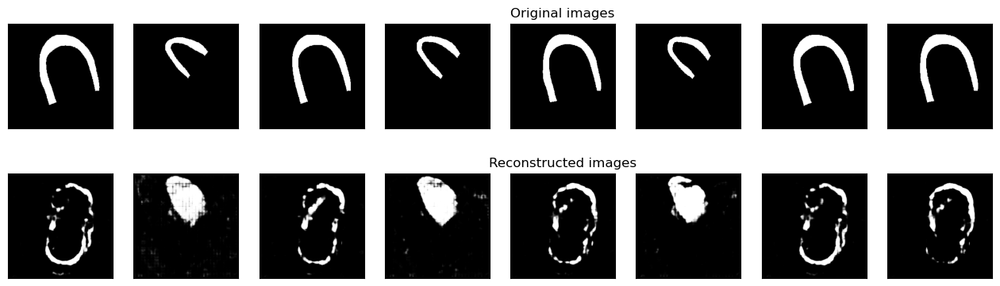


<<<----------------------- EPOCH 115/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9857
Val mean dice: 0.3139

 MYO train loss=2373.771 	 and 	 MYO val loss=140714.264
Best val DSC: 0.3329 at epoch number of 34


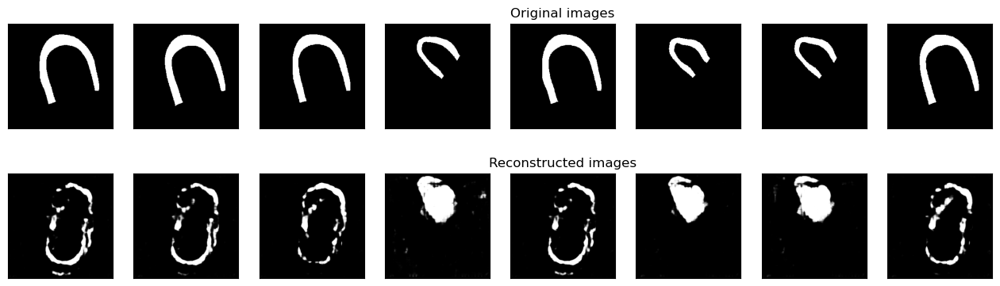


<<<----------------------- EPOCH 116/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9859
Val mean dice: 0.3071

 MYO train loss=2304.133 	 and 	 MYO val loss=138918.804
Best val DSC: 0.3329 at epoch number of 34


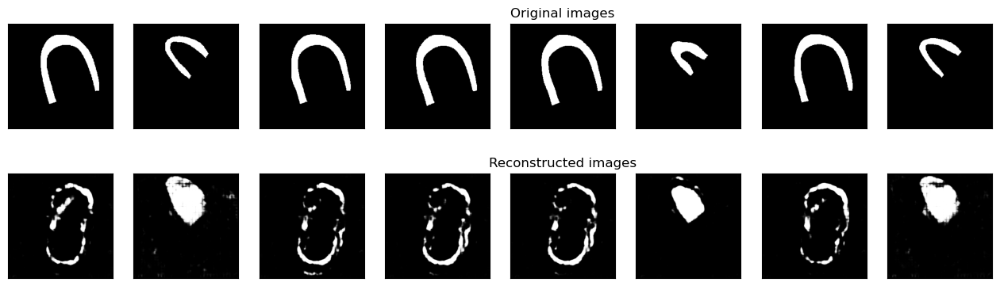


<<<----------------------- EPOCH 117/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9861
Val mean dice: 0.3146

 MYO train loss=2250.617 	 and 	 MYO val loss=138794.555
Best val DSC: 0.3329 at epoch number of 34


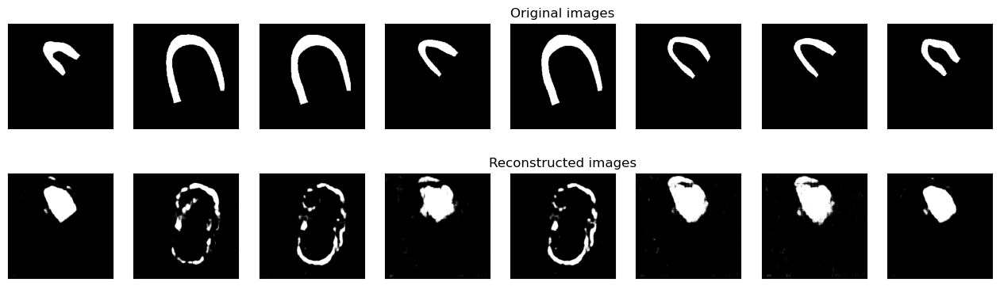


<<<----------------------- EPOCH 118/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9860
Val mean dice: 0.3165

 MYO train loss=2265.391 	 and 	 MYO val loss=140520.942
Best val DSC: 0.3329 at epoch number of 34


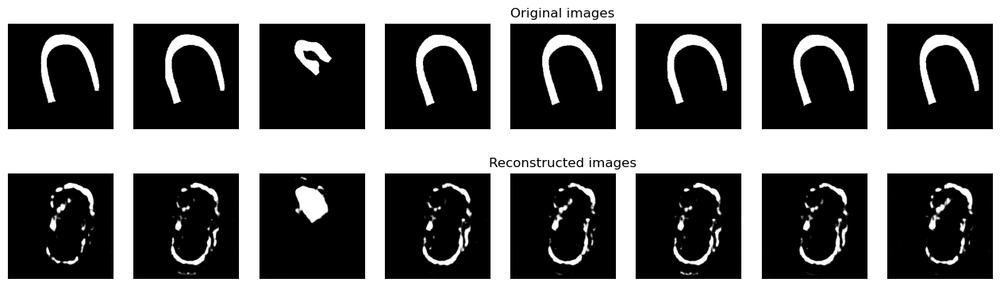


<<<----------------------- EPOCH 119/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9860
Val mean dice: 0.3114

 MYO train loss=2278.543 	 and 	 MYO val loss=141032.782
Best val DSC: 0.3329 at epoch number of 34


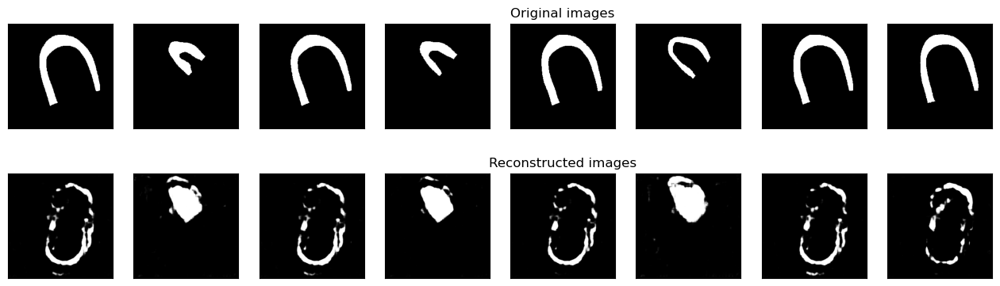


<<<----------------------- EPOCH 120/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9862
Val mean dice: 0.3126

 MYO train loss=2208.175 	 and 	 MYO val loss=142256.162
Best val DSC: 0.3329 at epoch number of 34


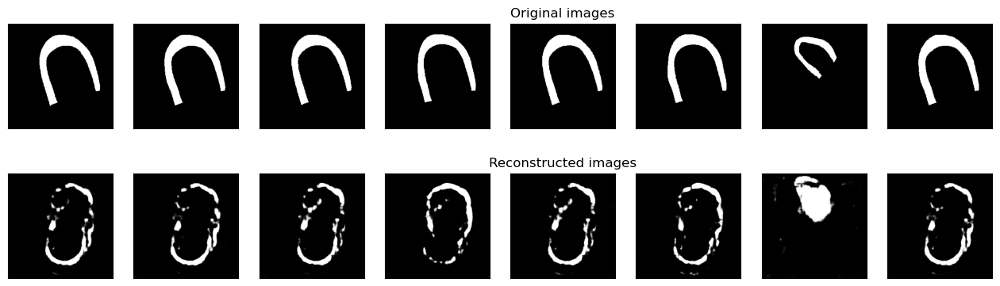


<<<----------------------- EPOCH 121/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3109

 MYO train loss=2189.104 	 and 	 MYO val loss=138423.981
Best val DSC: 0.3329 at epoch number of 34


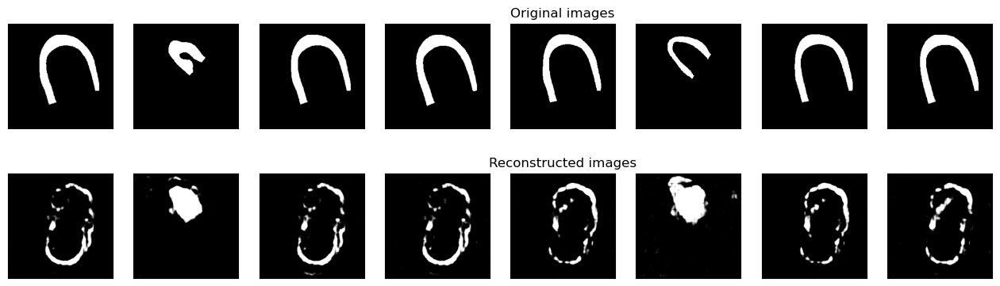


<<<----------------------- EPOCH 122/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9864
Val mean dice: 0.3230

 MYO train loss=2189.385 	 and 	 MYO val loss=141848.489
Best val DSC: 0.3329 at epoch number of 34


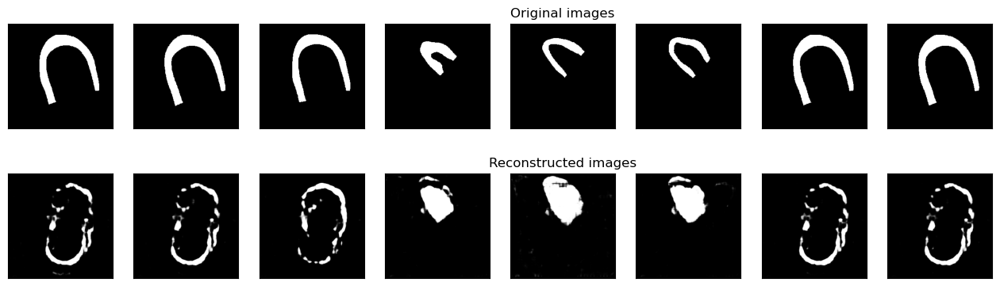


<<<----------------------- EPOCH 123/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3110

 MYO train loss=2235.832 	 and 	 MYO val loss=140096.120
Best val DSC: 0.3329 at epoch number of 34


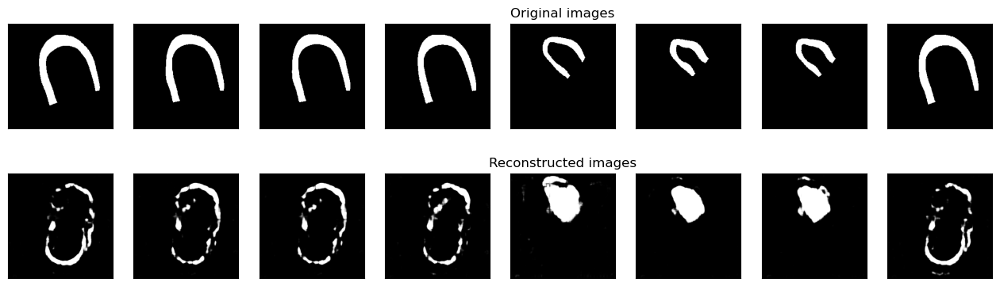


<<<----------------------- EPOCH 124/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9861
Val mean dice: 0.3050

 MYO train loss=2266.306 	 and 	 MYO val loss=139332.073
Best val DSC: 0.3329 at epoch number of 34


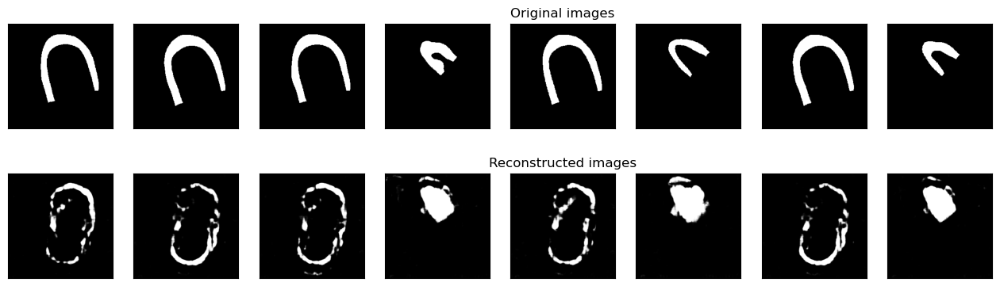


<<<----------------------- EPOCH 125/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9862
Val mean dice: 0.3118

 MYO train loss=2256.600 	 and 	 MYO val loss=141280.041
Best val DSC: 0.3329 at epoch number of 34


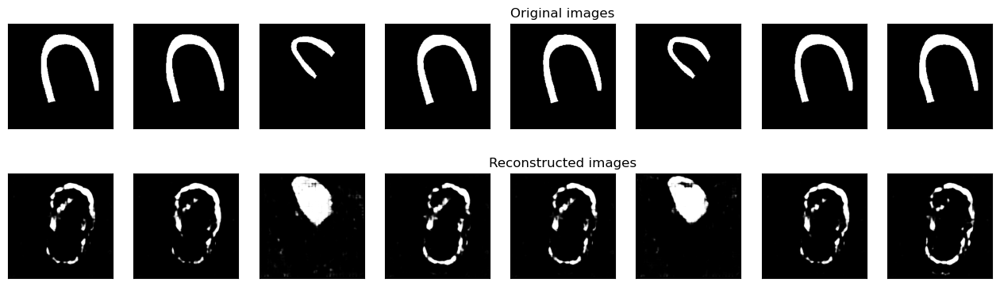


<<<----------------------- EPOCH 126/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9862
Val mean dice: 0.3117

 MYO train loss=2236.834 	 and 	 MYO val loss=140836.821
Best val DSC: 0.3329 at epoch number of 34


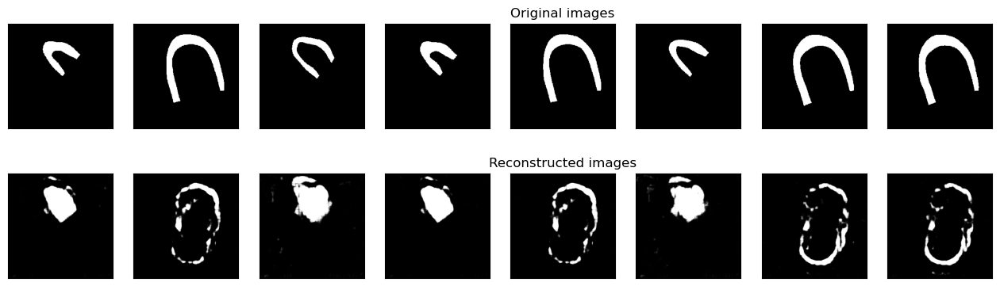


<<<----------------------- EPOCH 127/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3159

 MYO train loss=2236.436 	 and 	 MYO val loss=141416.227
Best val DSC: 0.3329 at epoch number of 34


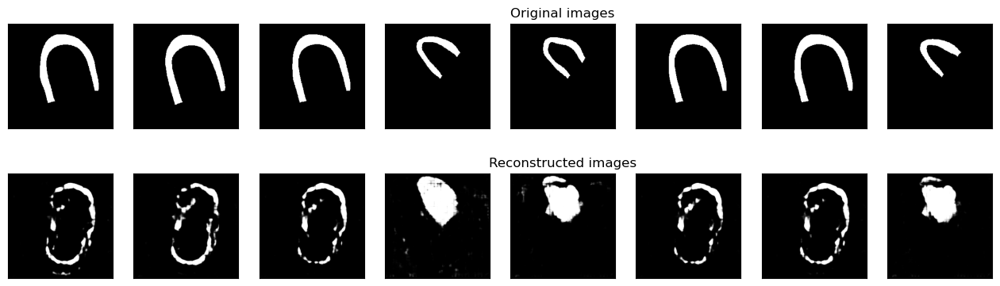


<<<----------------------- EPOCH 128/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.3013

 MYO train loss=2187.239 	 and 	 MYO val loss=138848.780
Best val DSC: 0.3329 at epoch number of 34


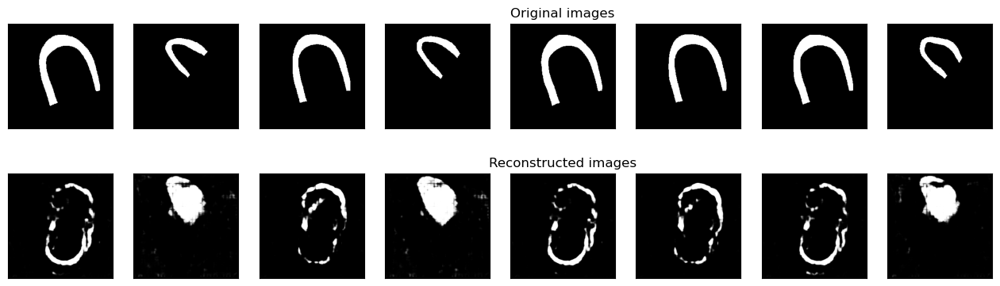


<<<----------------------- EPOCH 129/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.3159

 MYO train loss=2197.540 	 and 	 MYO val loss=140434.092
Best val DSC: 0.3329 at epoch number of 34


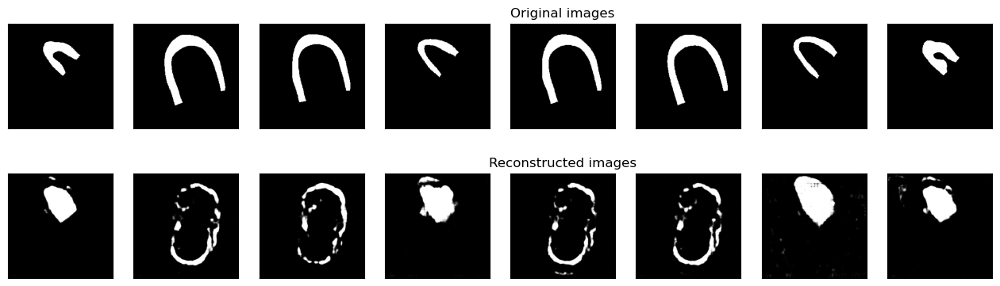


<<<----------------------- EPOCH 130/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.3072

 MYO train loss=2196.496 	 and 	 MYO val loss=138813.973
Best val DSC: 0.3329 at epoch number of 34


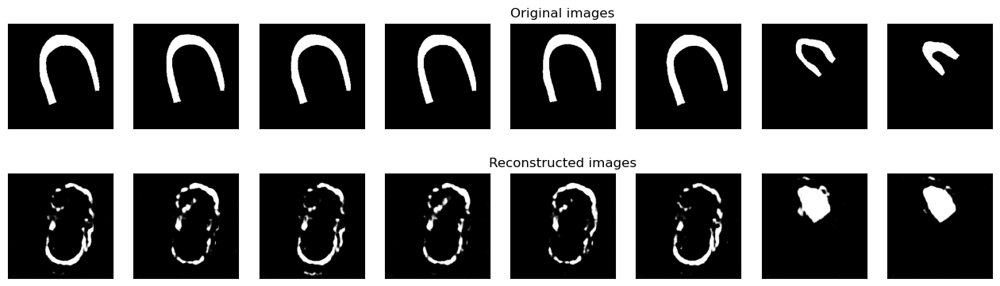


<<<----------------------- EPOCH 131/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3063

 MYO train loss=2250.727 	 and 	 MYO val loss=139222.048
Best val DSC: 0.3329 at epoch number of 34


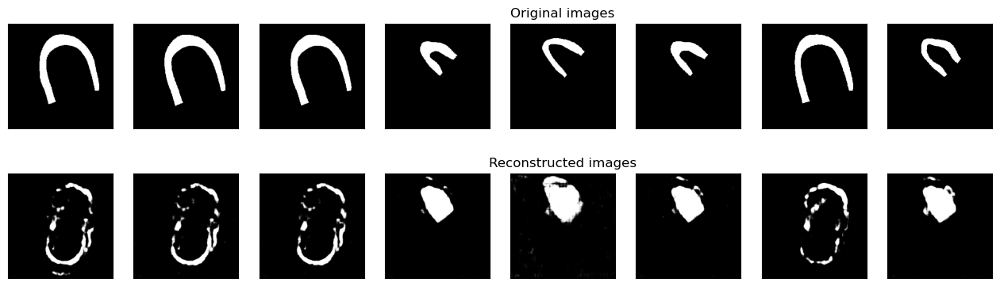


<<<----------------------- EPOCH 132/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3132

 MYO train loss=2228.724 	 and 	 MYO val loss=140448.384
Best val DSC: 0.3329 at epoch number of 34


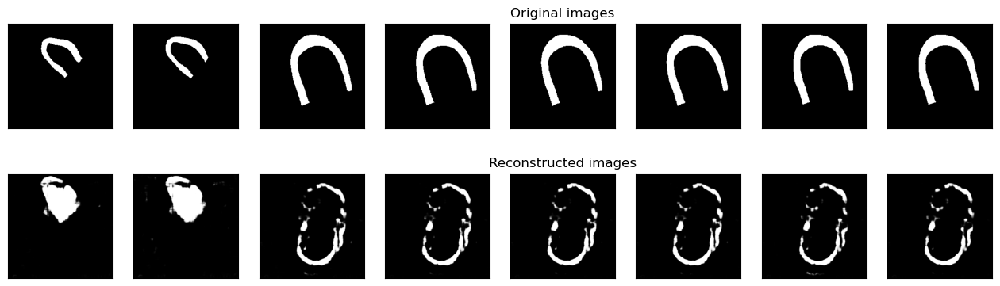


<<<----------------------- EPOCH 133/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3027

 MYO train loss=2248.755 	 and 	 MYO val loss=139274.946
Best val DSC: 0.3329 at epoch number of 34


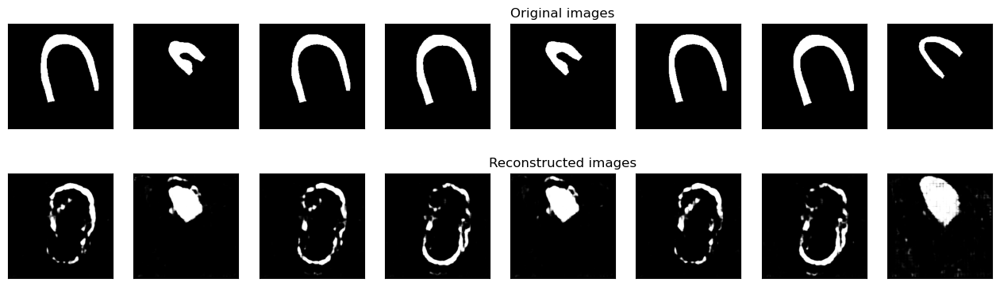


<<<----------------------- EPOCH 134/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9860
Val mean dice: 0.3073

 MYO train loss=2308.205 	 and 	 MYO val loss=137486.799
Best val DSC: 0.3329 at epoch number of 34


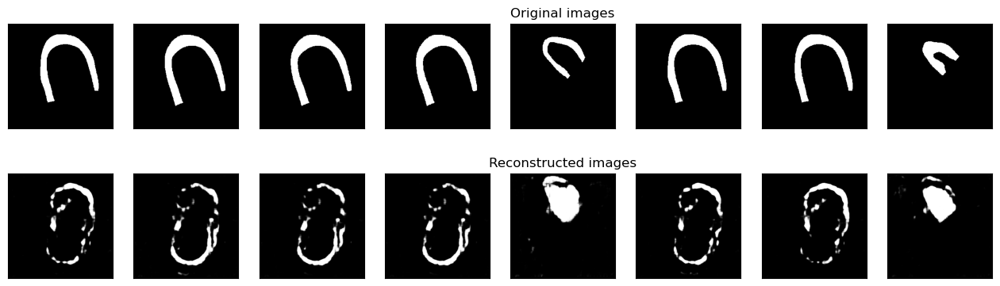


<<<----------------------- EPOCH 135/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3035

 MYO train loss=2256.395 	 and 	 MYO val loss=139993.357
Best val DSC: 0.3329 at epoch number of 34


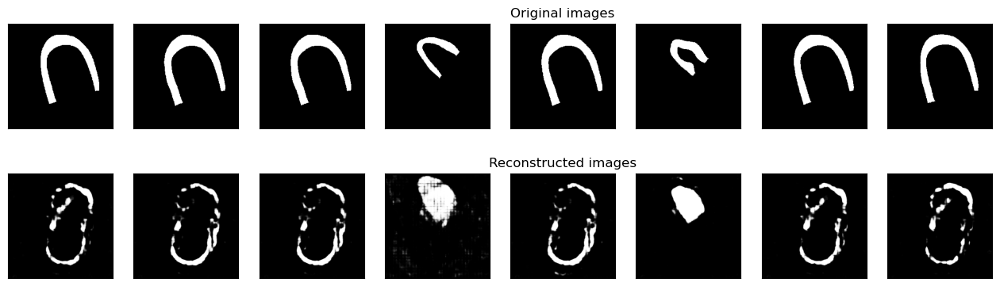


<<<----------------------- EPOCH 136/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.3050

 MYO train loss=2183.289 	 and 	 MYO val loss=140487.840
Best val DSC: 0.3329 at epoch number of 34


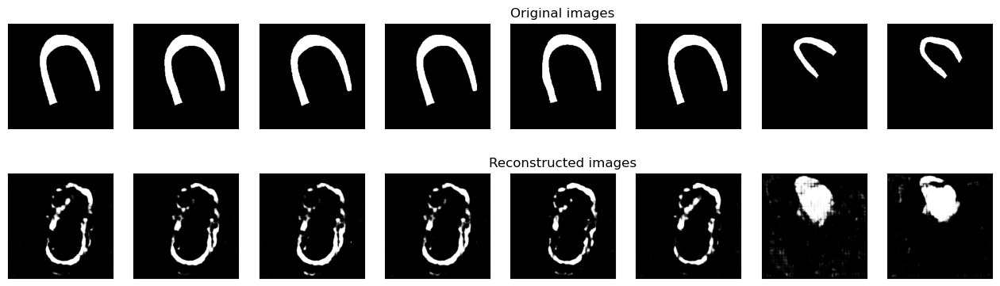


<<<----------------------- EPOCH 137/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3013

 MYO train loss=2243.619 	 and 	 MYO val loss=140701.585
Best val DSC: 0.3329 at epoch number of 34


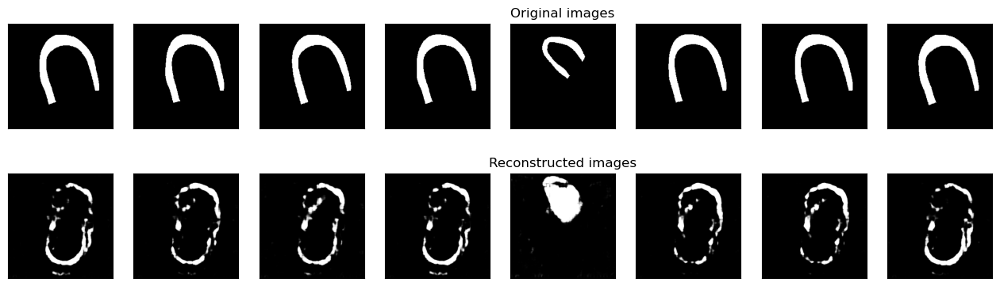


<<<----------------------- EPOCH 138/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3145

 MYO train loss=2273.121 	 and 	 MYO val loss=141007.962
Best val DSC: 0.3329 at epoch number of 34


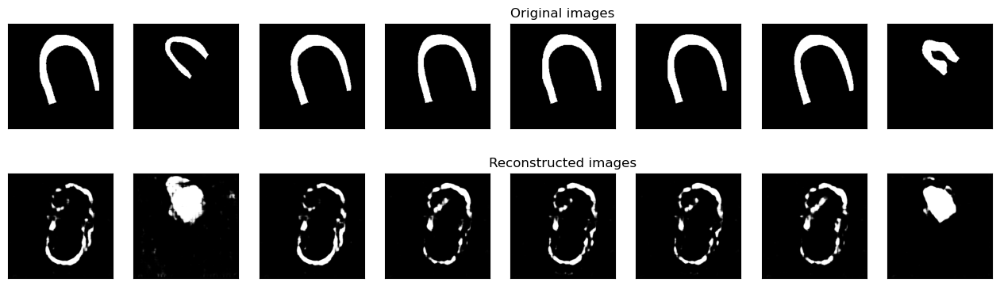


<<<----------------------- EPOCH 139/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9863
Val mean dice: 0.3125

 MYO train loss=2241.571 	 and 	 MYO val loss=138137.206
Best val DSC: 0.3329 at epoch number of 34


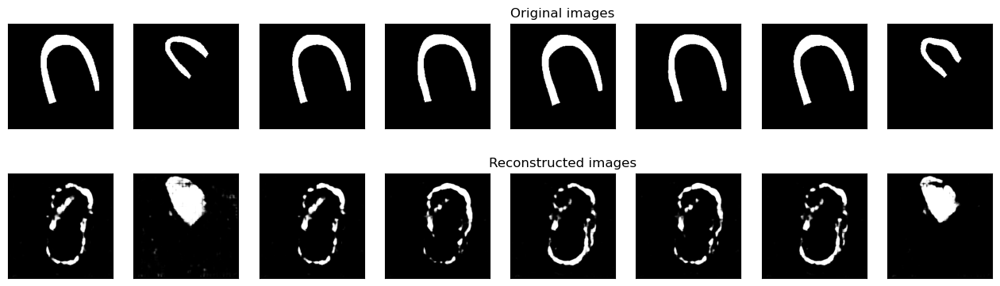


<<<----------------------- EPOCH 140/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9866
Val mean dice: 0.3070

 MYO train loss=2144.243 	 and 	 MYO val loss=139214.470
Best val DSC: 0.3329 at epoch number of 34


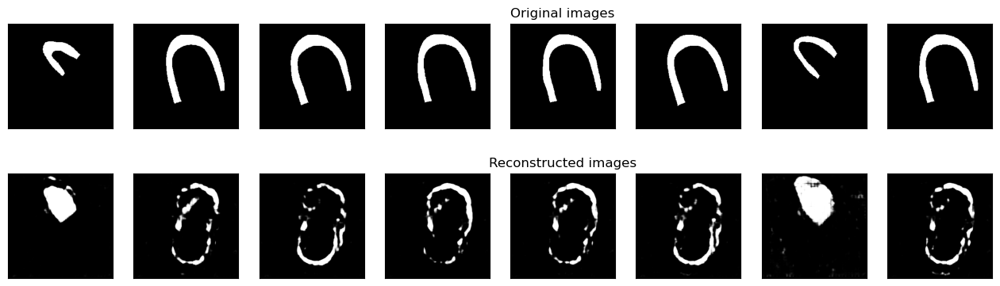


<<<----------------------- EPOCH 141/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.2940

 MYO train loss=2129.929 	 and 	 MYO val loss=139193.919
Best val DSC: 0.3329 at epoch number of 34


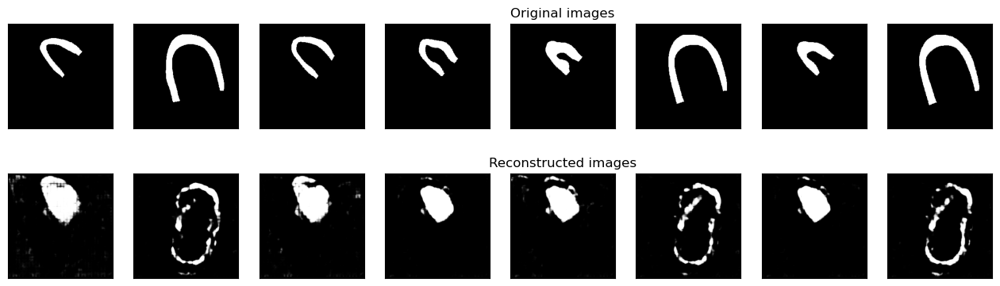


<<<----------------------- EPOCH 142/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3033

 MYO train loss=2154.651 	 and 	 MYO val loss=140394.864
Best val DSC: 0.3329 at epoch number of 34


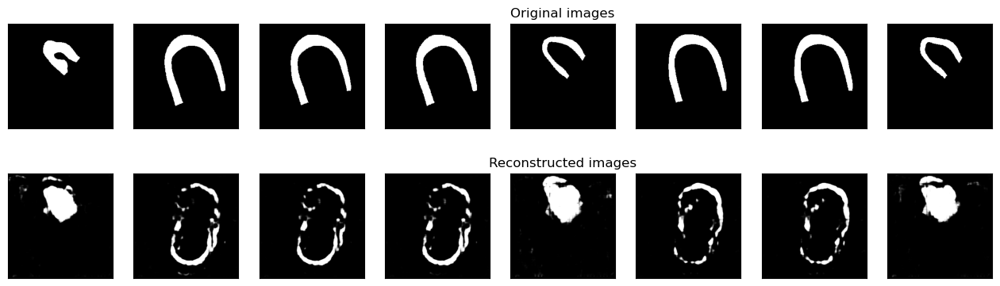


<<<----------------------- EPOCH 143/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9866
Val mean dice: 0.3044

 MYO train loss=2173.599 	 and 	 MYO val loss=140064.371
Best val DSC: 0.3329 at epoch number of 34


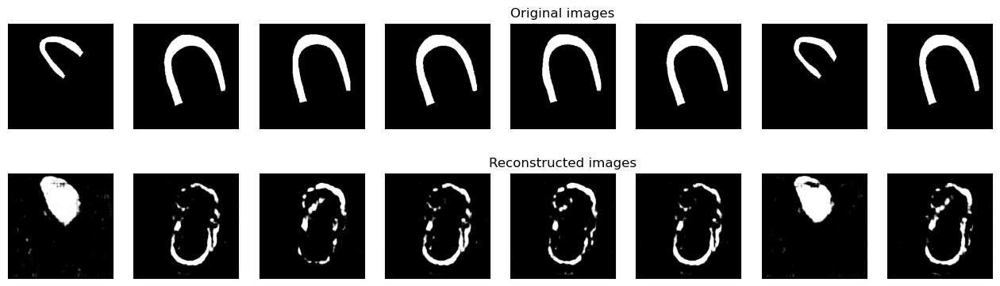


<<<----------------------- EPOCH 144/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3068

 MYO train loss=2177.881 	 and 	 MYO val loss=141027.357
Best val DSC: 0.3329 at epoch number of 34


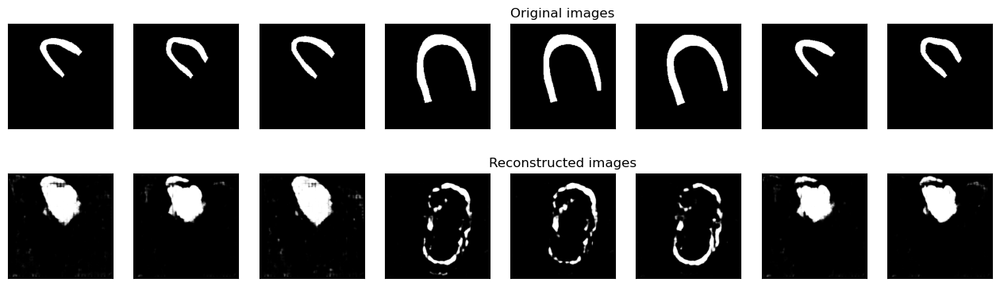


<<<----------------------- EPOCH 145/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3112

 MYO train loss=2172.868 	 and 	 MYO val loss=140963.269
Best val DSC: 0.3329 at epoch number of 34


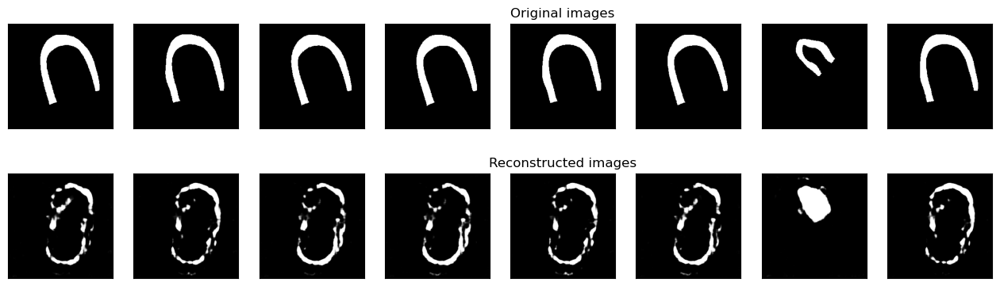


<<<----------------------- EPOCH 146/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3030

 MYO train loss=2173.348 	 and 	 MYO val loss=139602.684
Best val DSC: 0.3329 at epoch number of 34


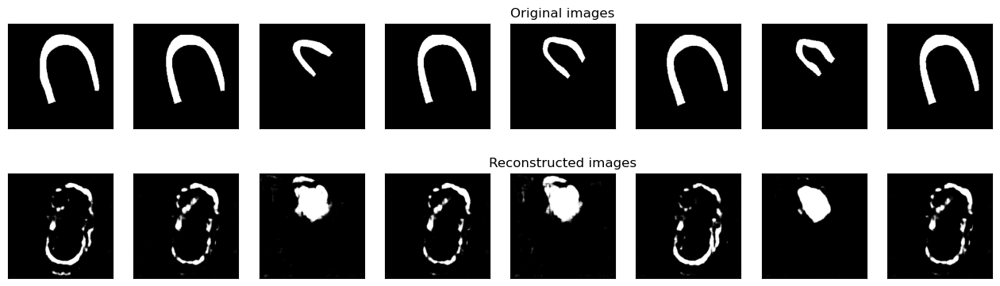


<<<----------------------- EPOCH 147/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3161

 MYO train loss=2180.481 	 and 	 MYO val loss=141311.757
Best val DSC: 0.3329 at epoch number of 34


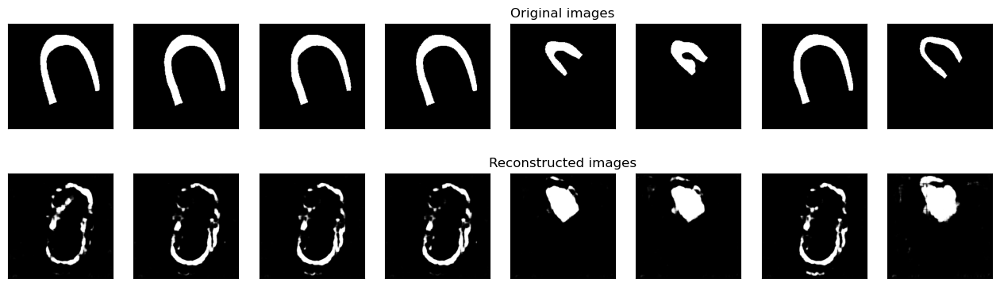


<<<----------------------- EPOCH 148/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3182

 MYO train loss=2184.432 	 and 	 MYO val loss=143934.867
Best val DSC: 0.3329 at epoch number of 34


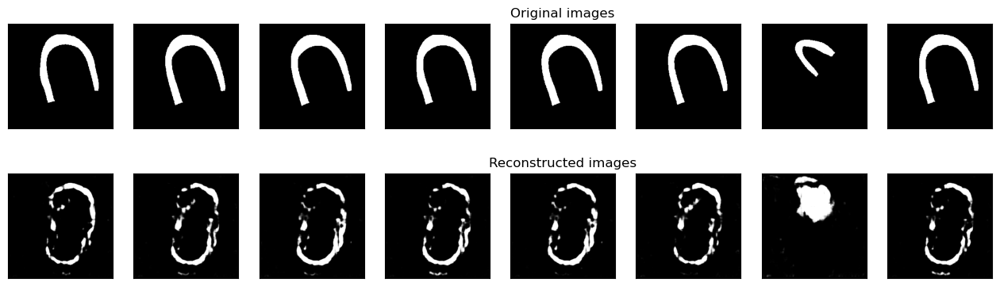


<<<----------------------- EPOCH 149/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.3063

 MYO train loss=2246.517 	 and 	 MYO val loss=140339.068
Best val DSC: 0.3329 at epoch number of 34


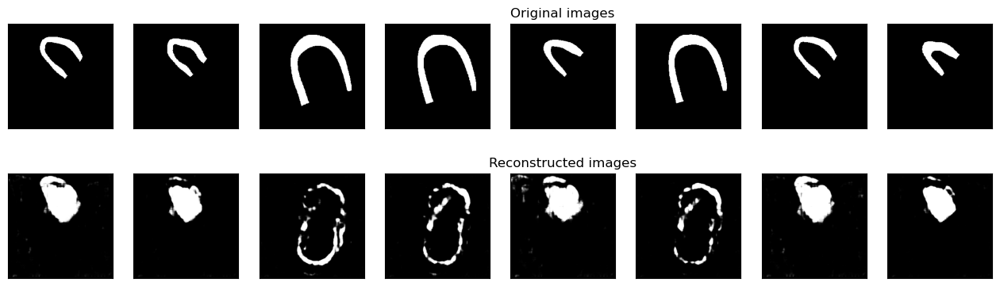


<<<----------------------- EPOCH 150/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9864
Val mean dice: 0.3127

 MYO train loss=2273.920 	 and 	 MYO val loss=142618.442
Best val DSC: 0.3329 at epoch number of 34


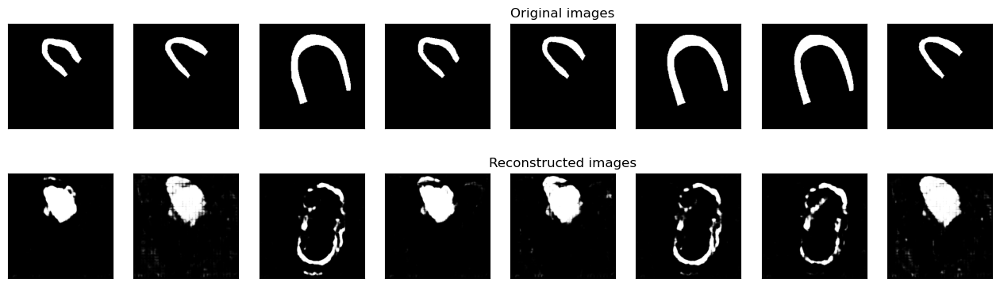


<<<----------------------- EPOCH 151/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9865
Val mean dice: 0.3068

 MYO train loss=2238.308 	 and 	 MYO val loss=141160.170
Best val DSC: 0.3329 at epoch number of 34


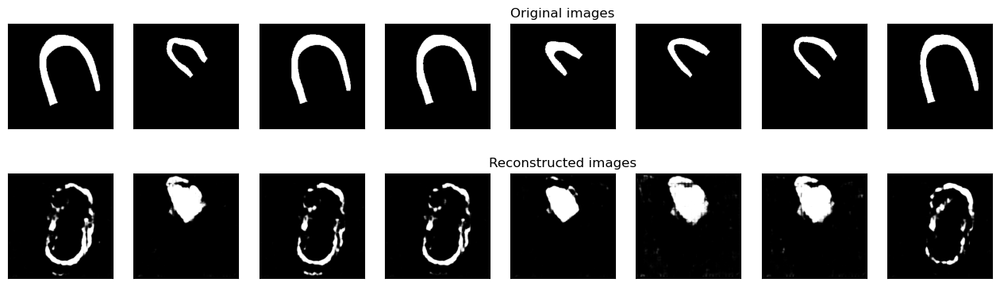


<<<----------------------- EPOCH 152/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9864
Val mean dice: 0.3066

 MYO train loss=2228.440 	 and 	 MYO val loss=143372.593
Best val DSC: 0.3329 at epoch number of 34


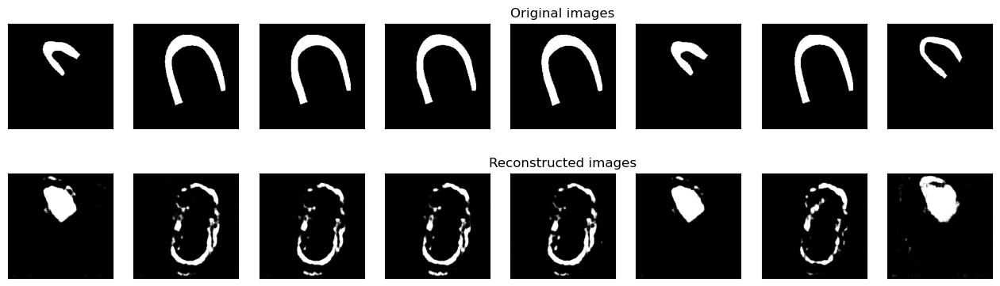


<<<----------------------- EPOCH 153/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.3038

 MYO train loss=2157.420 	 and 	 MYO val loss=140356.114
Best val DSC: 0.3329 at epoch number of 34


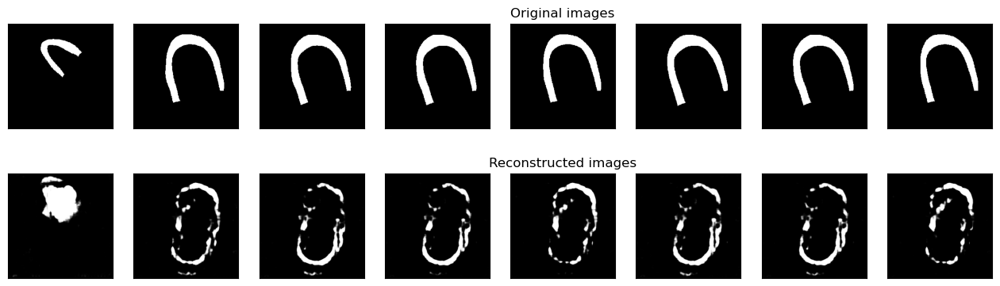


<<<----------------------- EPOCH 154/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9868
Val mean dice: 0.3071

 MYO train loss=2144.761 	 and 	 MYO val loss=140137.828
Best val DSC: 0.3329 at epoch number of 34


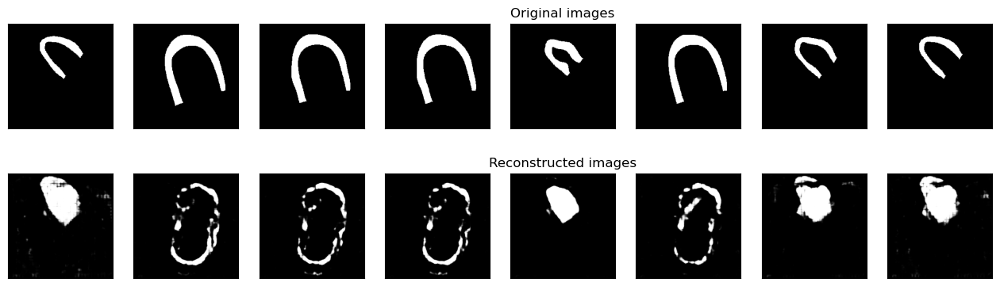


<<<----------------------- EPOCH 155/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3112

 MYO train loss=2138.203 	 and 	 MYO val loss=143304.388
Best val DSC: 0.3329 at epoch number of 34


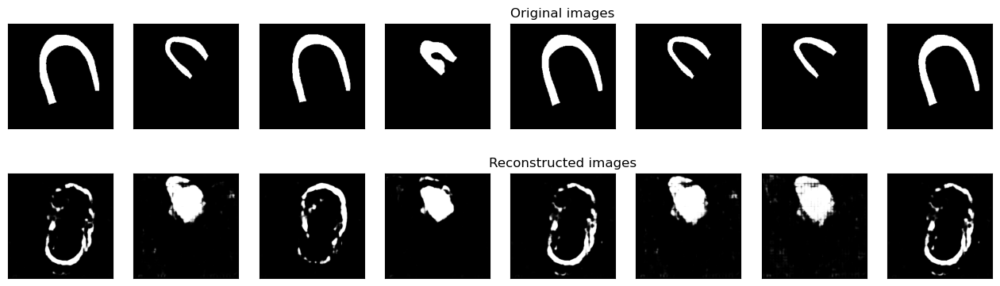


<<<----------------------- EPOCH 156/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3122

 MYO train loss=2106.869 	 and 	 MYO val loss=143584.800
Best val DSC: 0.3329 at epoch number of 34


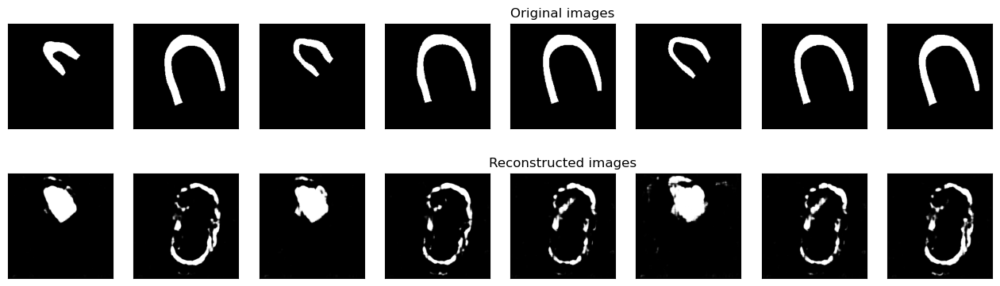


<<<----------------------- EPOCH 157/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3105

 MYO train loss=2111.978 	 and 	 MYO val loss=143382.931
Best val DSC: 0.3329 at epoch number of 34


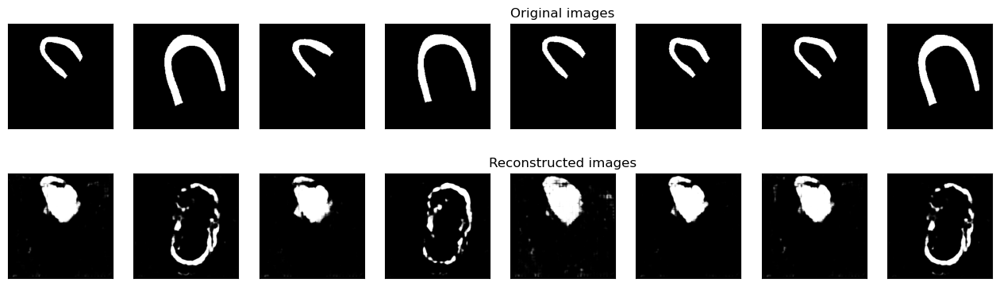


<<<----------------------- EPOCH 158/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3015

 MYO train loss=2136.612 	 and 	 MYO val loss=140293.537
Best val DSC: 0.3329 at epoch number of 34


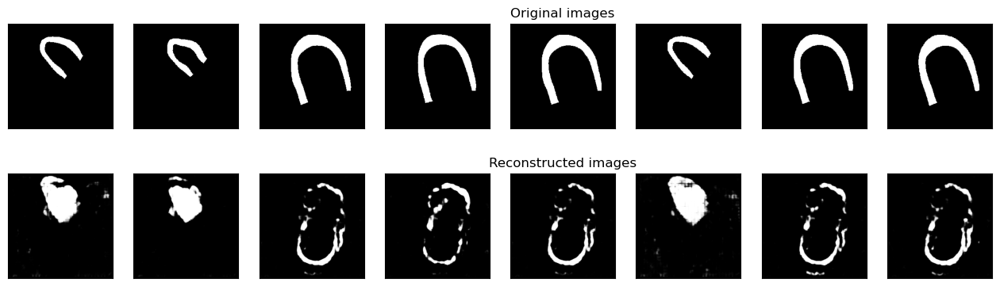


<<<----------------------- EPOCH 159/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9867
Val mean dice: 0.2960

 MYO train loss=2188.732 	 and 	 MYO val loss=139784.049
Best val DSC: 0.3329 at epoch number of 34


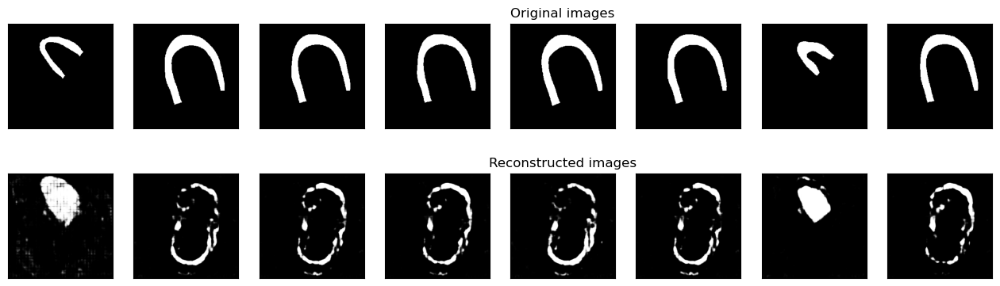


<<<----------------------- EPOCH 160/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9866
Val mean dice: 0.3091

 MYO train loss=2189.621 	 and 	 MYO val loss=139950.065
Best val DSC: 0.3329 at epoch number of 34


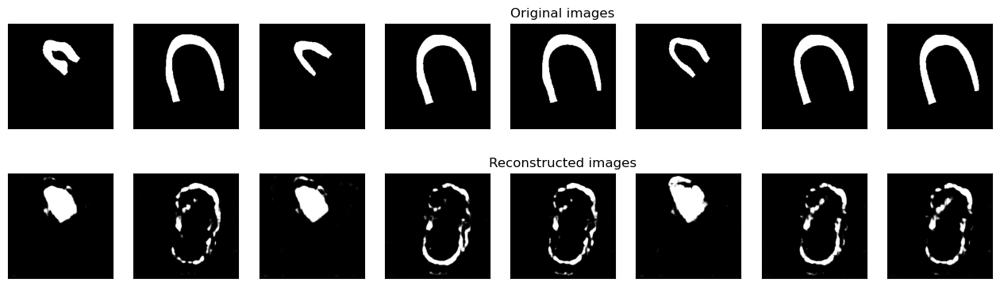


<<<----------------------- EPOCH 161/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3016

 MYO train loss=2185.722 	 and 	 MYO val loss=140198.744
Best val DSC: 0.3329 at epoch number of 34


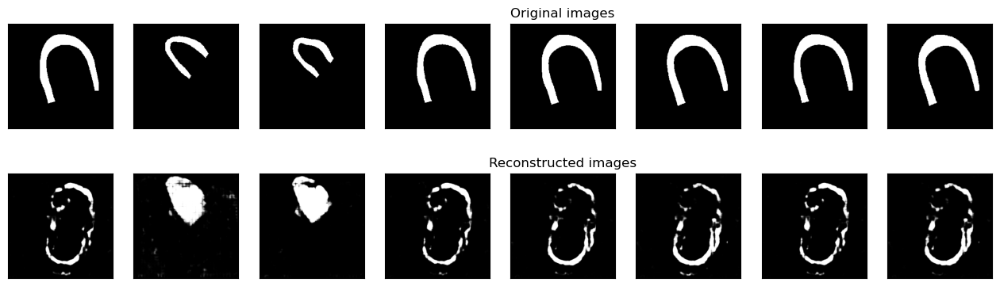


<<<----------------------- EPOCH 162/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3135

 MYO train loss=2174.280 	 and 	 MYO val loss=142855.607
Best val DSC: 0.3329 at epoch number of 34


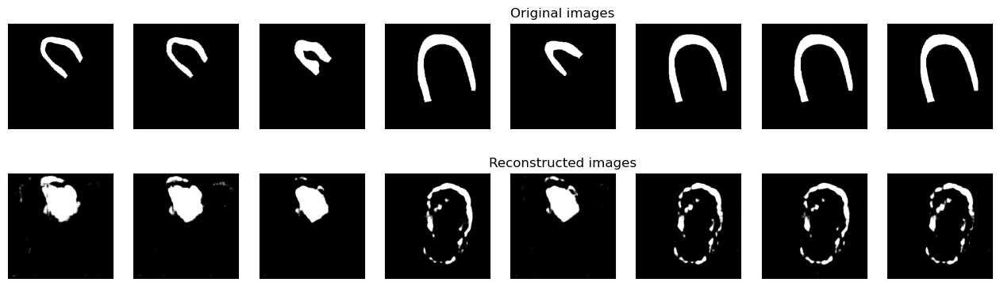


<<<----------------------- EPOCH 163/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3082

 MYO train loss=2139.009 	 and 	 MYO val loss=141413.769
Best val DSC: 0.3329 at epoch number of 34


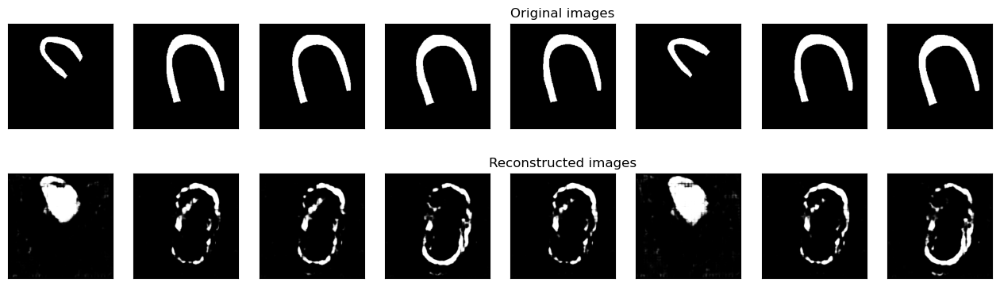


<<<----------------------- EPOCH 164/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9868
Val mean dice: 0.3140

 MYO train loss=2140.378 	 and 	 MYO val loss=142517.599
Best val DSC: 0.3329 at epoch number of 34


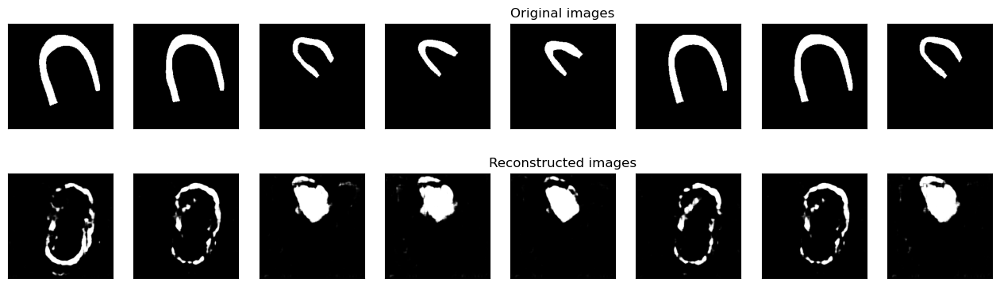


<<<----------------------- EPOCH 165/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3139

 MYO train loss=2120.773 	 and 	 MYO val loss=141982.058
Best val DSC: 0.3329 at epoch number of 34


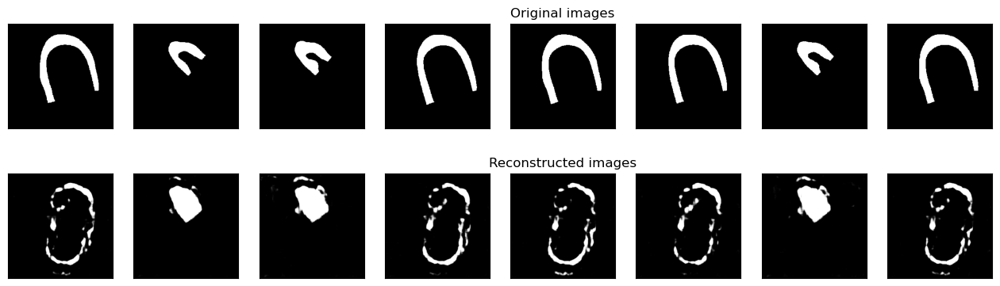


<<<----------------------- EPOCH 166/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3115

 MYO train loss=2129.312 	 and 	 MYO val loss=141131.817
Best val DSC: 0.3329 at epoch number of 34


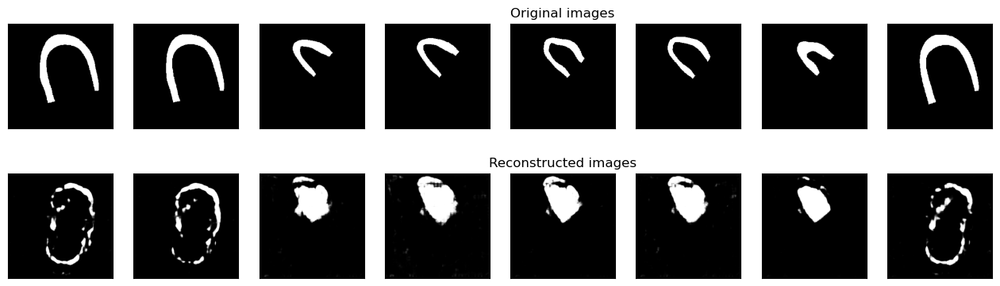


<<<----------------------- EPOCH 167/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3082

 MYO train loss=2127.616 	 and 	 MYO val loss=142502.816
Best val DSC: 0.3329 at epoch number of 34


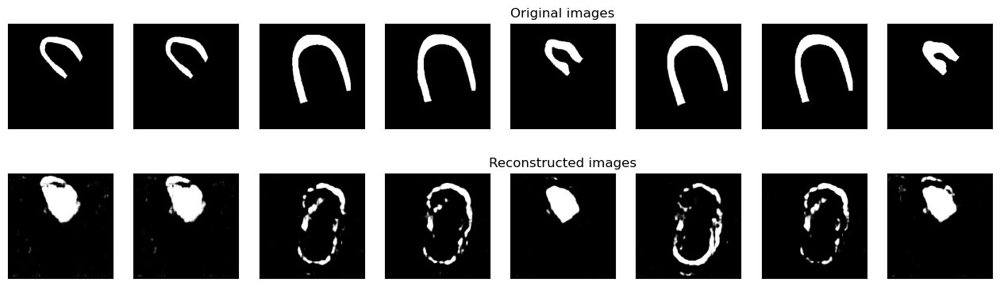


<<<----------------------- EPOCH 168/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3101

 MYO train loss=2069.556 	 and 	 MYO val loss=141655.223
Best val DSC: 0.3329 at epoch number of 34


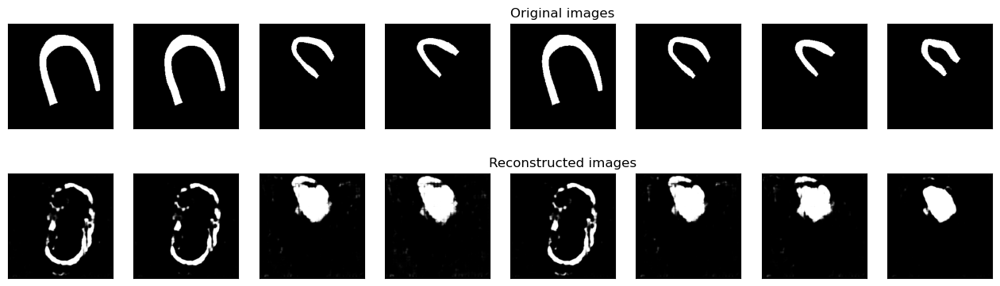


<<<----------------------- EPOCH 169/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3114

 MYO train loss=2136.618 	 and 	 MYO val loss=143040.694
Best val DSC: 0.3329 at epoch number of 34


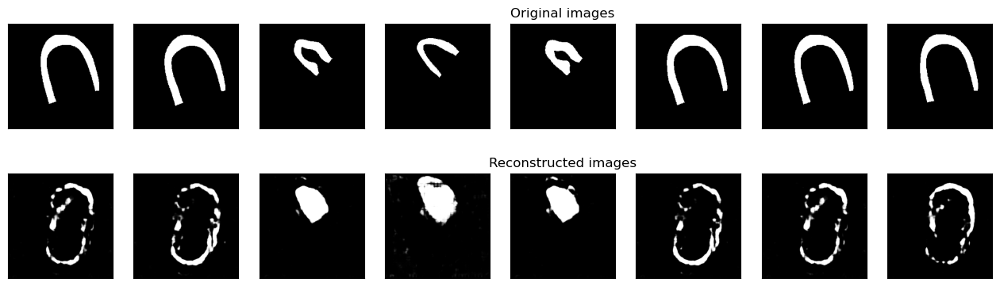


<<<----------------------- EPOCH 170/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3233

 MYO train loss=2168.359 	 and 	 MYO val loss=143516.463
Best val DSC: 0.3329 at epoch number of 34


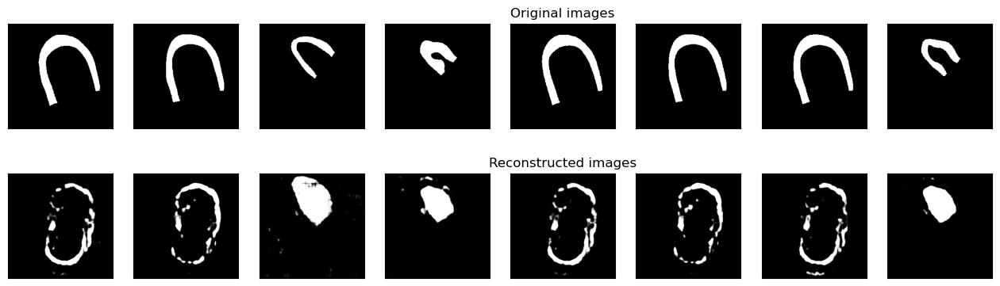


<<<----------------------- EPOCH 171/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3109

 MYO train loss=2165.510 	 and 	 MYO val loss=142157.567
Best val DSC: 0.3329 at epoch number of 34


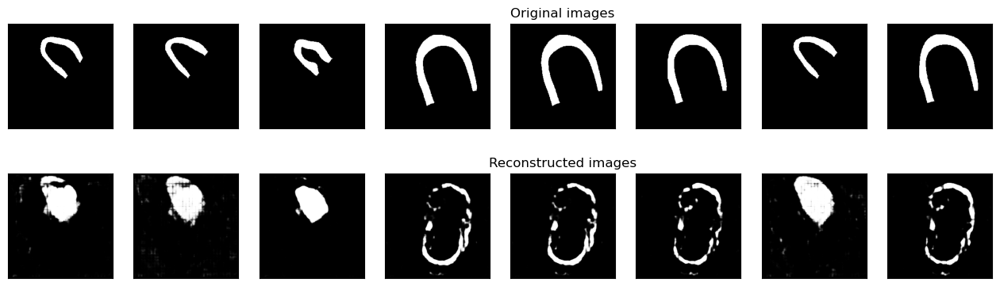


<<<----------------------- EPOCH 172/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3156

 MYO train loss=2143.135 	 and 	 MYO val loss=141952.404
Best val DSC: 0.3329 at epoch number of 34


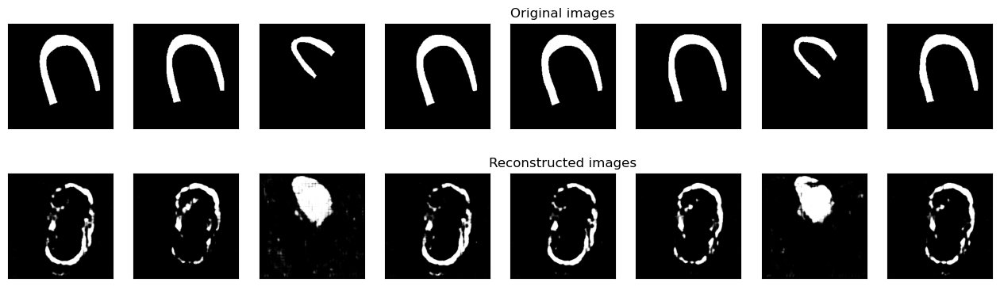


<<<----------------------- EPOCH 173/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3069

 MYO train loss=2123.824 	 and 	 MYO val loss=142932.768
Best val DSC: 0.3329 at epoch number of 34


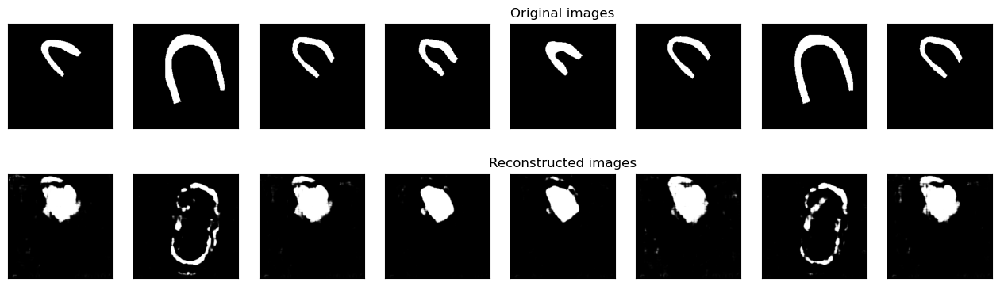


<<<----------------------- EPOCH 174/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.2979

 MYO train loss=2157.332 	 and 	 MYO val loss=140864.883
Best val DSC: 0.3329 at epoch number of 34


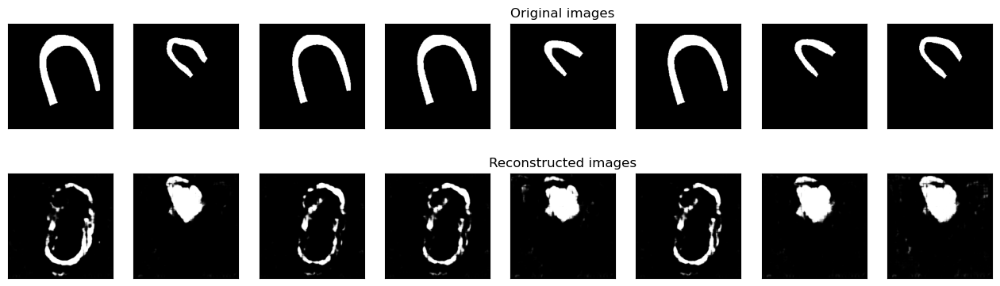


<<<----------------------- EPOCH 175/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3074

 MYO train loss=2142.544 	 and 	 MYO val loss=141006.266
Best val DSC: 0.3329 at epoch number of 34


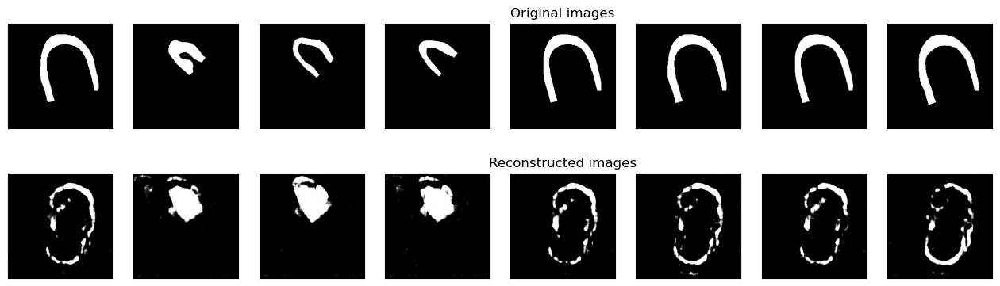


<<<----------------------- EPOCH 176/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3022

 MYO train loss=2160.652 	 and 	 MYO val loss=141898.132
Best val DSC: 0.3329 at epoch number of 34


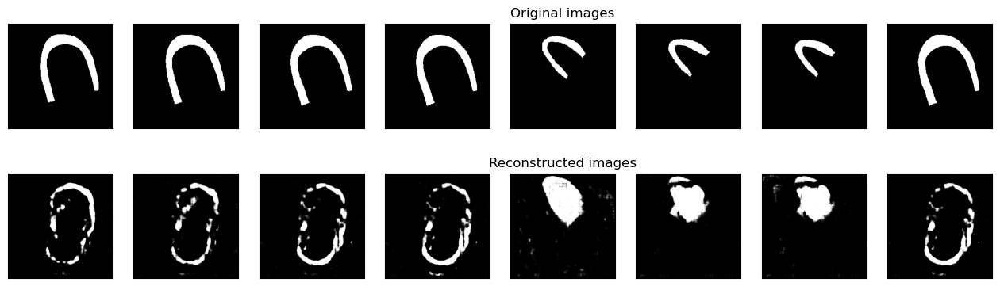


<<<----------------------- EPOCH 177/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9868
Val mean dice: 0.3131

 MYO train loss=2195.449 	 and 	 MYO val loss=143383.335
Best val DSC: 0.3329 at epoch number of 34


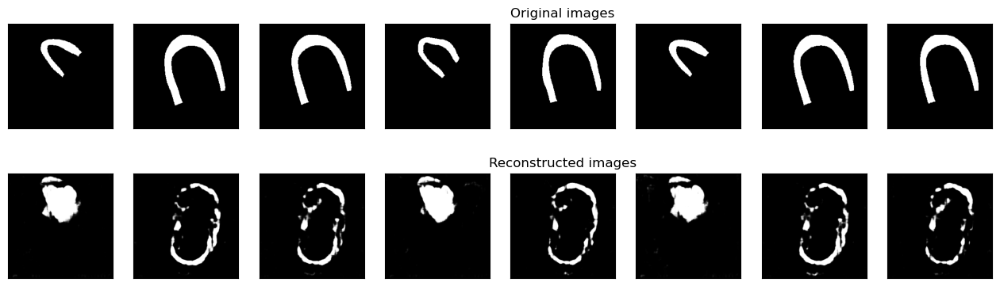


<<<----------------------- EPOCH 178/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3134

 MYO train loss=2139.953 	 and 	 MYO val loss=144838.007
Best val DSC: 0.3329 at epoch number of 34


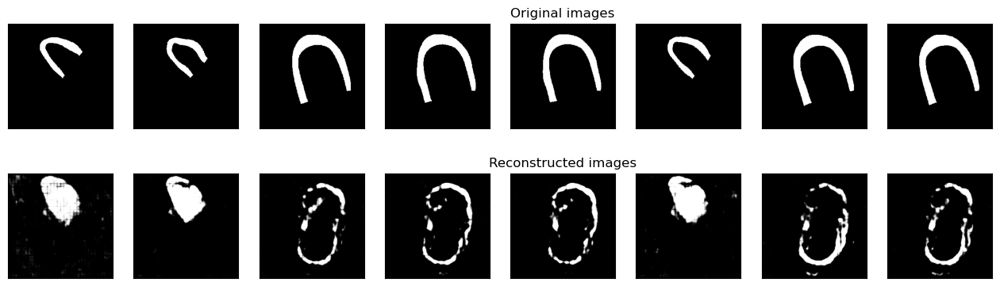


<<<----------------------- EPOCH 179/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9873
Val mean dice: 0.3160

 MYO train loss=2044.664 	 and 	 MYO val loss=145921.753
Best val DSC: 0.3329 at epoch number of 34


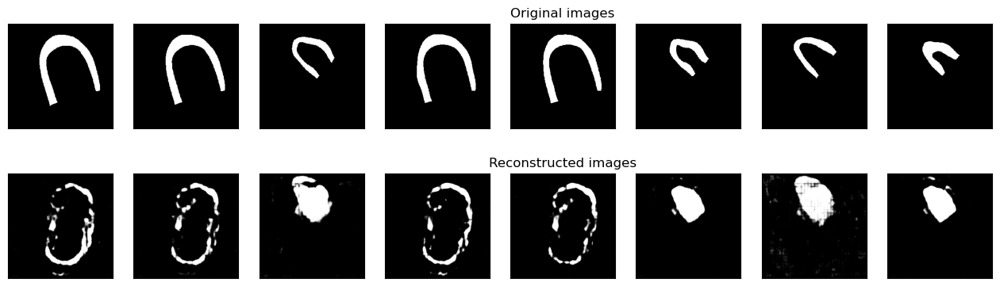


<<<----------------------- EPOCH 180/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9873
Val mean dice: 0.3128

 MYO train loss=2046.777 	 and 	 MYO val loss=142860.545
Best val DSC: 0.3329 at epoch number of 34


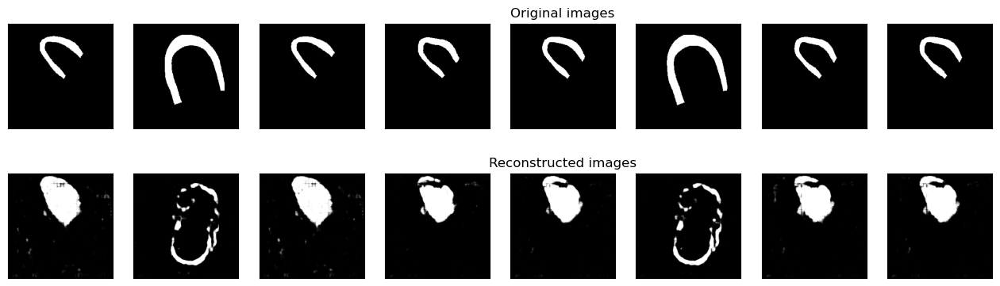


<<<----------------------- EPOCH 181/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3088

 MYO train loss=2088.459 	 and 	 MYO val loss=143164.338
Best val DSC: 0.3329 at epoch number of 34


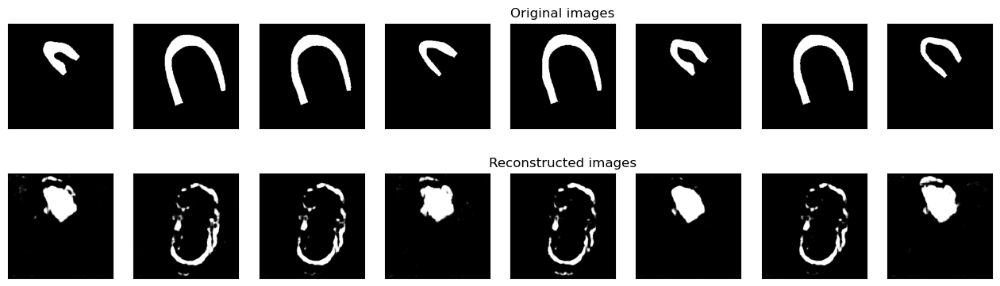


<<<----------------------- EPOCH 182/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3175

 MYO train loss=2121.320 	 and 	 MYO val loss=145013.380
Best val DSC: 0.3329 at epoch number of 34


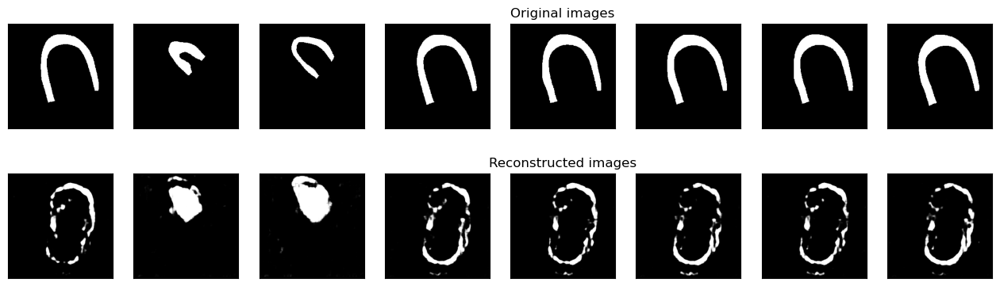


<<<----------------------- EPOCH 183/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3132

 MYO train loss=2075.663 	 and 	 MYO val loss=143610.136
Best val DSC: 0.3329 at epoch number of 34


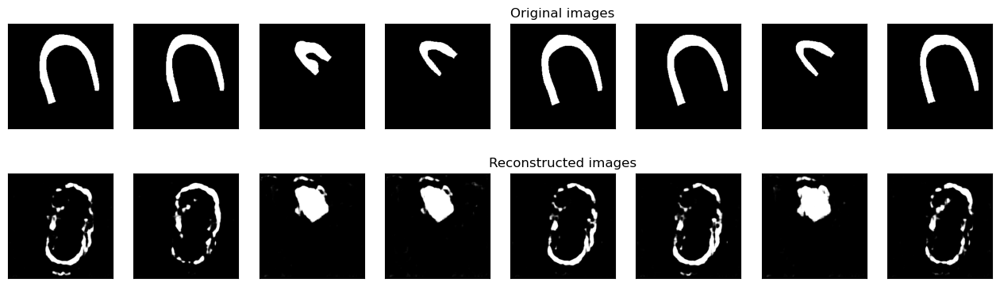


<<<----------------------- EPOCH 184/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9874
Val mean dice: 0.3067

 MYO train loss=2061.889 	 and 	 MYO val loss=143016.755
Best val DSC: 0.3329 at epoch number of 34


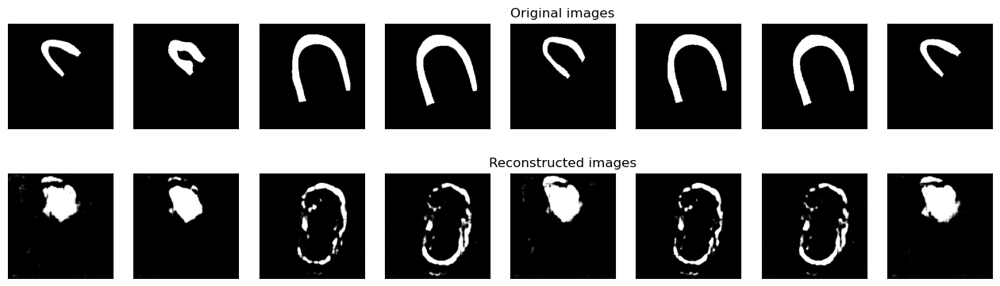


<<<----------------------- EPOCH 185/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.2960

 MYO train loss=2096.370 	 and 	 MYO val loss=140717.615
Best val DSC: 0.3329 at epoch number of 34


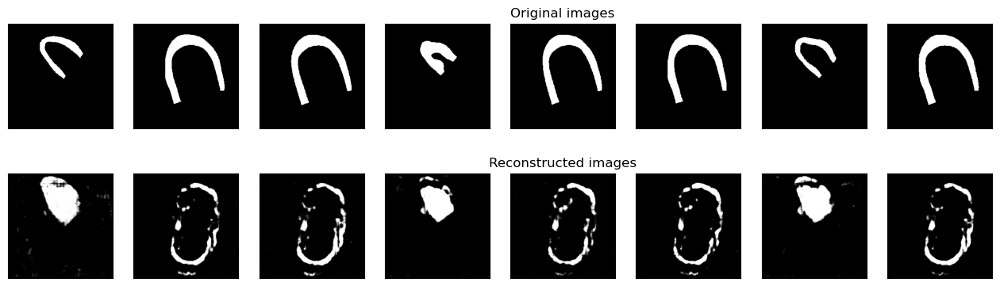


<<<----------------------- EPOCH 186/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9873
Val mean dice: 0.3099

 MYO train loss=2092.752 	 and 	 MYO val loss=145754.914
Best val DSC: 0.3329 at epoch number of 34


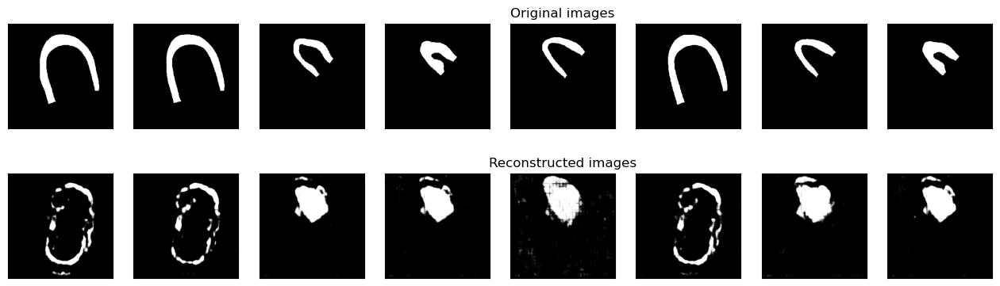


<<<----------------------- EPOCH 187/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3061

 MYO train loss=2108.493 	 and 	 MYO val loss=141844.618
Best val DSC: 0.3329 at epoch number of 34


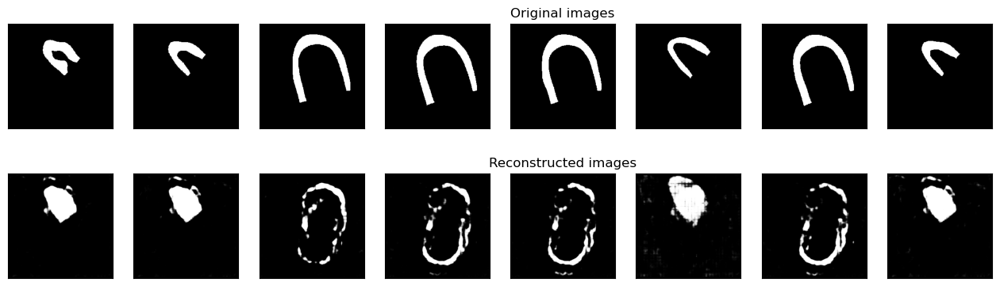


<<<----------------------- EPOCH 188/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3076

 MYO train loss=2099.008 	 and 	 MYO val loss=142827.042
Best val DSC: 0.3329 at epoch number of 34


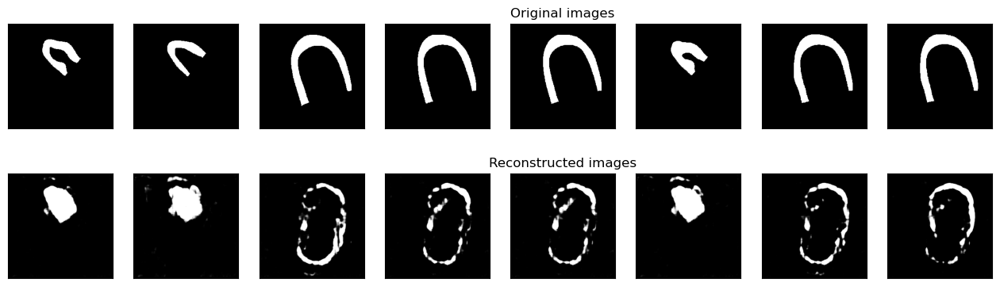


<<<----------------------- EPOCH 189/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9873
Val mean dice: 0.3073

 MYO train loss=2113.122 	 and 	 MYO val loss=142118.054
Best val DSC: 0.3329 at epoch number of 34


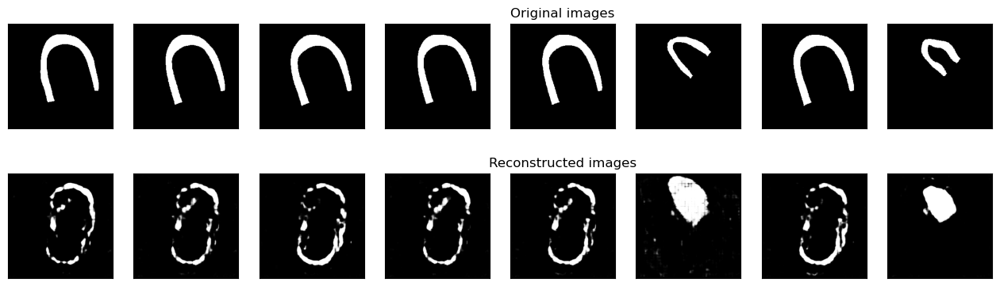


<<<----------------------- EPOCH 190/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9874
Val mean dice: 0.2922

 MYO train loss=2076.654 	 and 	 MYO val loss=139581.690
Best val DSC: 0.3329 at epoch number of 34


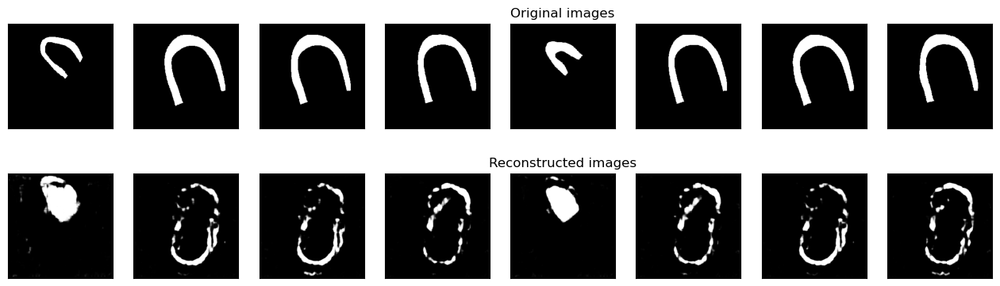


<<<----------------------- EPOCH 191/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3036

 MYO train loss=2165.409 	 and 	 MYO val loss=139668.774
Best val DSC: 0.3329 at epoch number of 34


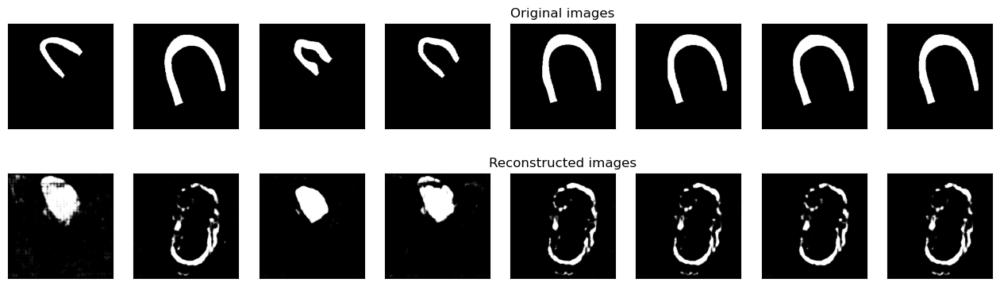


<<<----------------------- EPOCH 192/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3087

 MYO train loss=2166.997 	 and 	 MYO val loss=141364.703
Best val DSC: 0.3329 at epoch number of 34


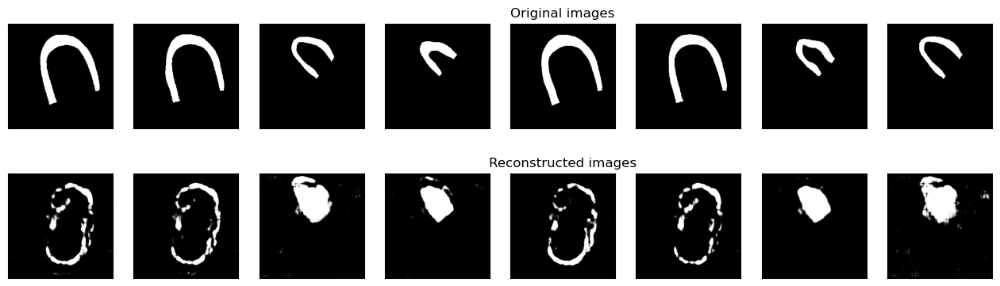


<<<----------------------- EPOCH 193/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3102

 MYO train loss=2109.950 	 and 	 MYO val loss=142733.862
Best val DSC: 0.3329 at epoch number of 34


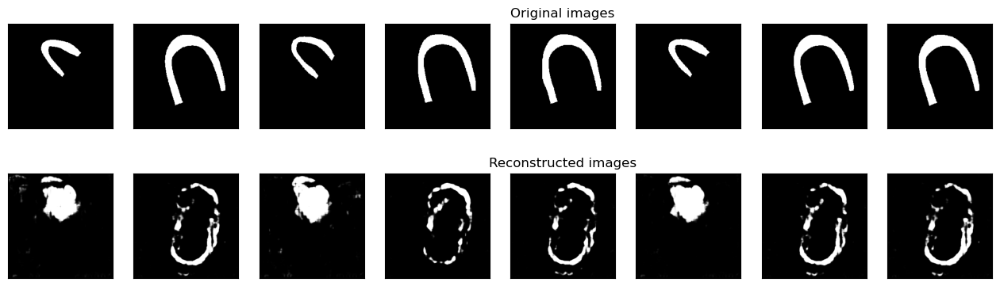


<<<----------------------- EPOCH 194/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3147

 MYO train loss=2183.481 	 and 	 MYO val loss=143223.445
Best val DSC: 0.3329 at epoch number of 34


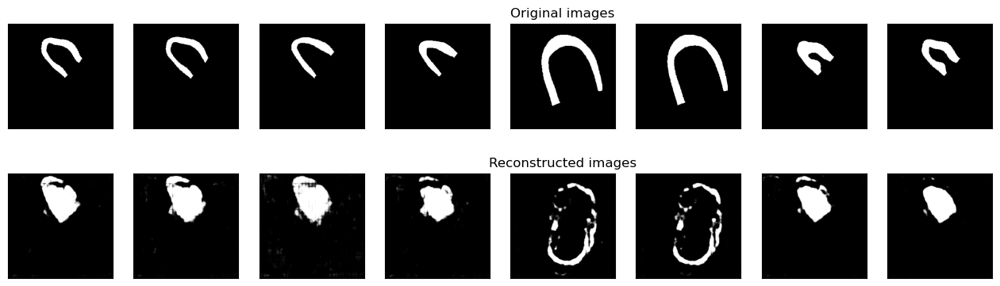


<<<----------------------- EPOCH 195/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9869
Val mean dice: 0.3152

 MYO train loss=2220.180 	 and 	 MYO val loss=144376.142
Best val DSC: 0.3329 at epoch number of 34


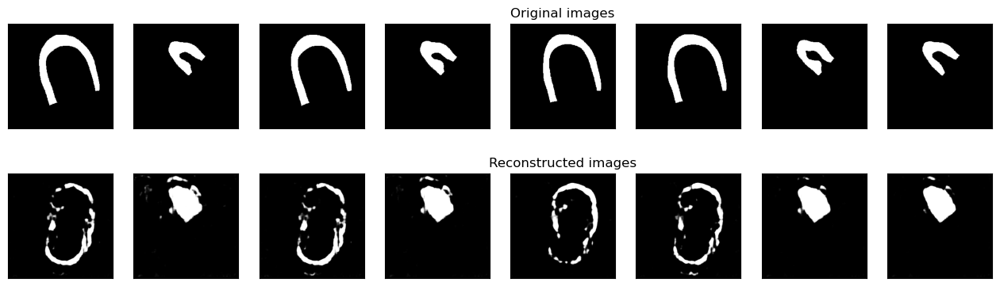


<<<----------------------- EPOCH 196/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9870
Val mean dice: 0.3183

 MYO train loss=2170.582 	 and 	 MYO val loss=144224.848
Best val DSC: 0.3329 at epoch number of 34


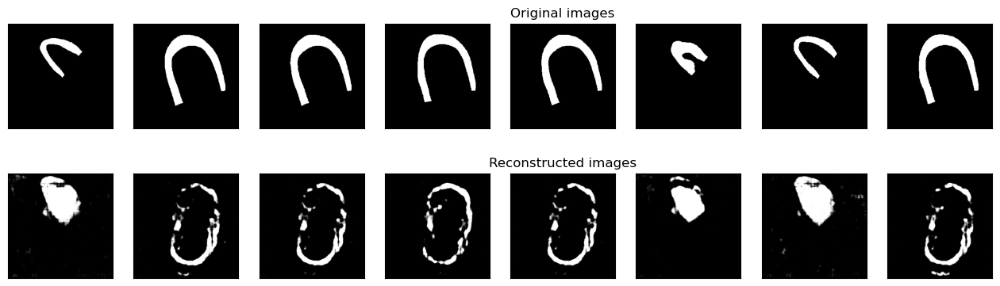


<<<----------------------- EPOCH 197/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3158

 MYO train loss=2111.330 	 and 	 MYO val loss=143591.526
Best val DSC: 0.3329 at epoch number of 34


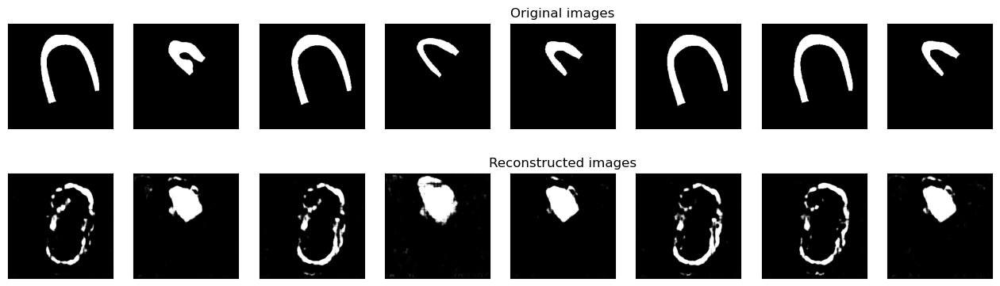


<<<----------------------- EPOCH 198/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3109

 MYO train loss=2137.346 	 and 	 MYO val loss=143408.472
Best val DSC: 0.3329 at epoch number of 34


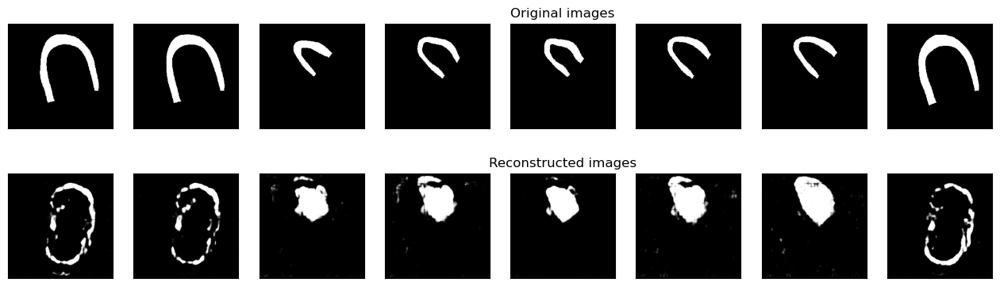


<<<----------------------- EPOCH 199/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9871
Val mean dice: 0.3112

 MYO train loss=2166.253 	 and 	 MYO val loss=145162.973
Best val DSC: 0.3329 at epoch number of 34


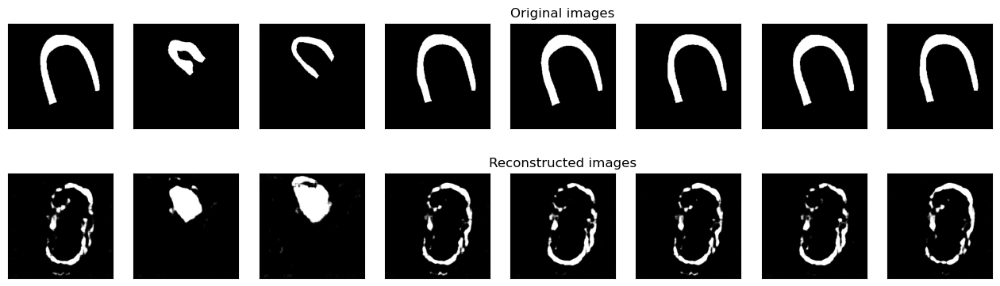


<<<----------------------- EPOCH 200/200 ------------------------->>>
<<<----------------------- MYO ------------------------->>>
Train mean dice: 0.9872
Val mean dice: 0.3200

 MYO train loss=2129.255 	 and 	 MYO val loss=146401.311
Best val DSC: 0.3329 at epoch number of 34


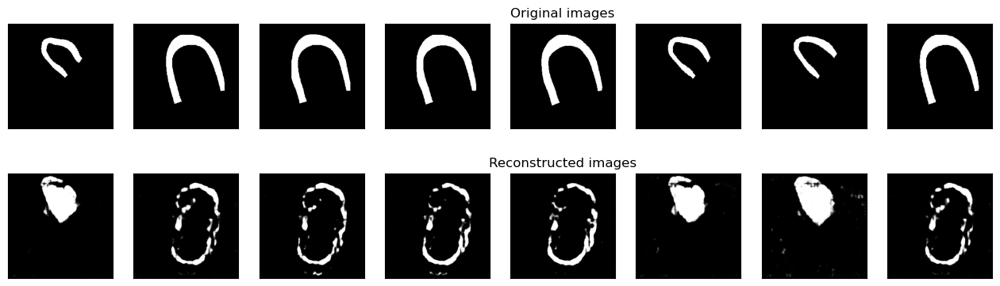

In [19]:
num_epochs = EP

dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)

train_Myo_loss_ = []
train_Myo_loss_DSC_ = []
train_Myo_loss_SSIM_ = []
train_Myo_loss_KL_ = []
train_Myo_loss_diff_loss_ = []

val_Myo_loss_ = []
val_Myo_loss_DSC_ = []
val_Myo_loss_SSIM_ = []
val_Myo_loss_KL_ = []
val_Myo_loss_diff_loss_ = []

best_loss = 0

checkpoint_path = 'Myo_VAE_3D_'+ str(img_size) + '_' + str(slice_size) + '_.pth'

for epoch in range(num_epochs):
    print('\n<<<----------------------- EPOCH {}/{} ------------------------->>>'.format(epoch + 1, num_epochs))
    print('<<<----------------------- MYO ------------------------->>>')
    
    MyotrainLoss = train_epoch(Myo_VAE, device, trainData['Myo'], optim_Myo_VAE)
    MyovalLoss = test_epoch(Myo_VAE, device, valData['Myo'])
    
    if MyovalLoss[5] > best_loss:
        best_loss_epoch = epoch + 1
        print(f"Valid DSC improved from {best_loss:2.4f} to {MyovalLoss[5]:2.4f}! Best model is saving as---> {checkpoint_path}")
        best_loss = MyovalLoss[5]
        torch.save(Myo_VAE.state_dict(), checkpoint_path)
    
    print('\n MYO train loss={:.3f} \t and \t MYO val loss={:.3f}'.format(MyotrainLoss[0], MyovalLoss[0]))
    
    print(
    f"Best val DSC: {best_loss:.4f} "
    f"at epoch number of {best_loss_epoch}")
    
    train_Myo_loss_.append(MyotrainLoss[0])
    train_Myo_loss_DSC_.append(MyotrainLoss[1])
    train_Myo_loss_SSIM_.append(MyotrainLoss[2])
    train_Myo_loss_KL_.append(MyotrainLoss[3])
    train_Myo_loss_diff_loss_.append(MyotrainLoss[4])
    
    val_Myo_loss_.append(MyovalLoss[0])
    val_Myo_loss_DSC_.append(MyovalLoss[1])
    val_Myo_loss_SSIM_.append(MyovalLoss[2])
    val_Myo_loss_KL_.append(MyovalLoss[3])
    val_Myo_loss_diff_loss_.append(MyovalLoss[4])
    
    plot_outputs(Myo_VAE.encoder, Myo_VAE.decoder, valData['Myo'])

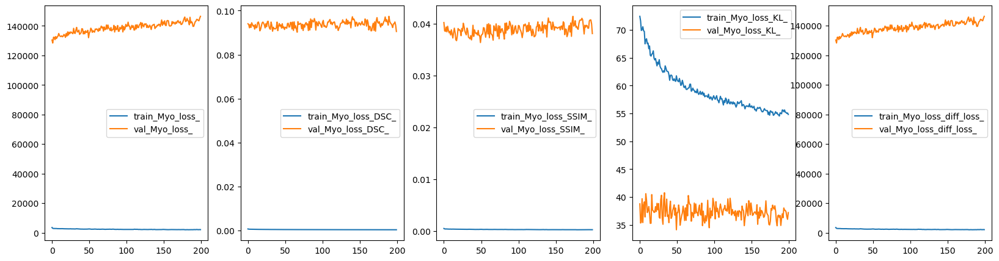

In [20]:
# plot and save the generator and discriminator loss
plt.figure("Myo", (20, 5))
plt.subplot(151)
plt.plot(train_Myo_loss_, label='train_Myo_loss_')
plt.plot(val_Myo_loss_, label='val_Myo_loss_')
plt.legend()

plt.subplot(152)
plt.plot(train_Myo_loss_DSC_, label='train_Myo_loss_DSC_')
plt.plot(val_Myo_loss_DSC_, label='val_Myo_loss_DSC_')
plt.legend()

plt.subplot(153)
plt.plot(train_Myo_loss_SSIM_, label='train_Myo_loss_SSIM_')
plt.plot(val_Myo_loss_SSIM_, label='val_Myo_loss_SSIM_')
plt.legend()

plt.subplot(154)
plt.plot(train_Myo_loss_KL_, label='train_Myo_loss_KL_')
plt.plot(val_Myo_loss_KL_, label='val_Myo_loss_KL_')
plt.legend()

plt.subplot(155)
plt.plot(train_Myo_loss_diff_loss_, label='train_Myo_loss_diff_loss_')
plt.plot(val_Myo_loss_diff_loss_, label='val_Myo_loss_diff_loss_')
plt.legend()